# ***Brazilian E-Commerce Public Dataset by Olist***

This Documentation presented by Gamma Team:
1. Mario Billy Gunawan
1. Muhammad Reyhan
1. Muhamad Rafif

## Business Understanding

### **Introduction**
Olist, a Brazilian e-commerce marketplace integrator, is an online e-commerce site aggregation platform designed to facilitate direct sales on e-commerce sites of Brazil. The company's platform connects entrepreneurs with major online retailers and allows shopkeepers to advertise and sell in the marketplaces without complication, enabling retail companies to reach out to the international marketplaces, improve the shopping experience and modify their purchasing behavior. Olist connects small businesses from all over Brazil to channels without hassle and with a single contract. Those merchants are able to sell their products through the Olist Store and ship them directly to the customers using Olist logistics partners.
After a customer purchases the product from Olist Store a seller gets notified to fulfill that order. Once the customer receives the product, or the estimated delivery date is due, the customer gets a satisfaction survey by email where he can give a note for the purchase experience and write down some comments.

### **Context** <br>
The dataset has information of 100k orders from 2016 to 2018 made at multiple marketplaces in Brazil. Its features allows viewing an order from multiple dimensions: from **order status**, **price**, **payment** and **freight performance to customer location**, **product attributes** and finally **reviews written by customers**.The **geolocation dataset** that relates Brazilian zip codes to lat/lng coordinates.

### **Problem Statements**

Olist have collected data throughout the year, the data contains seperated information, there are aggregated data, unique data or even combination of both (Aggregated on a unique data). With olist current dataset, it is hard to identify customer behaviour, since it has no representation of customer segments, moreover, even after understanding with segmentation what kind of approach should they take? hence...
The questions to be answered in this project:

1.   What can we infer from sales history nature when it comes to dictate customers' behaviour?
2.   Why does RFM analysis possibly segregate customers based-on their behaviours?
3.   How to classify when looking up to individual metrics?
4.   What is the next step after knowing the segments? Can we improve the segments? 

### **Objective**
With this project, it is hoped that Olist will be able to classify their customers with the appropriate segmentation.

### **Project Limitation**
The machine learning model built is limited to orders from 2016 to 2018 made at multiple marketplaces in Brazil from the Brazilian E-Commerce Public Dataset by Olist. So the performance of the model will be much different when used to classify customers from today. #In addition, this model is built from several selected features based on features importance and correlation analysis to the target.

### **Analytical Approach**
Underlying the problem statements, Our main focus lies around the implementation of CRM Campaign, the analytical approach we use are:

1. Customer Segmentation by Clustering
2. Classification of Clusters

### **Evaluation Metrics**

Since dealing with multi-class classification, **False Classes** are equally important, hence **F1-Score** would be an appropriate metrics for this

## 1. Libraries

In [1]:
# Standard libraries
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
pd.options.display.max_columns = None
import scipy.stats as stats
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import json
import requests
import folium
from statsmodels.stats.outliers_influence import variance_inflation_factor
from math import floor
from matplotlib import ticker
import missingno
from scipy.stats import kruskal
from matplotlib.gridspec import GridSpec
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime

# Utilities
from viz_utils import *
from custom_transformers import *

# Data Preparation
from scipy.stats import probplot
import squarify
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import KBinsDiscretizer, RobustScaler

# Modeling
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score
from geopy.distance import distance
from sklearn.model_selection import train_test_split


## 2. Reading the Data

> ### **Data Sets Scheme and Table Joining**

![Database Scheme](data_schemeArtboard_1.png)

In [2]:
orders = pd.read_csv('olist_orders_dataset.csv')
order_reviews = pd.read_csv('olist_order_reviews_dataset.csv')
customer = pd.read_csv('olist_customers_dataset.csv')
order_payments = pd.read_csv('olist_order_payments_dataset.csv')
order_items = pd.read_csv('olist_order_items_dataset.csv')
products = pd.read_csv('olist_products_dataset.csv')
products_english = pd.read_csv('product_category_name_translation.csv')
sellers = pd.read_csv('olist_sellers_dataset.csv')
geo = pd.read_csv('olist_geolocation_dataset.csv')

> **Null Values Checking**

In [3]:
#Overview from the Data
dataset_dictionary = {
    'Orders':orders, 'Order Reviews':order_reviews, 'Customer':customer,
    'Order Payments':order_payments, 'Order Items':order_items, 'Products':products,
    'Products in English':products_english, 'Sellers':sellers, 'Geolocation':geo
}

datasets_summary = pd.DataFrame()
datasets_summary['Dataset'] = [data[0] for data in dataset_dictionary.items()]
datasets_summary['Columns'] = [', '.join([col[0] for col in data[1].isnull().sum().items()])
                               for data in dataset_dictionary.items()]
datasets_summary['Rows'] = [data[1].shape[0] for data in dataset_dictionary.items()]
datasets_summary['Columns'] = [data[1].shape[1] for data in dataset_dictionary.items()]
datasets_summary['Duplicates'] = [data[1].duplicated().sum() for data in dataset_dictionary.items()]
datasets_summary['Nulls'] = [data[1].isnull().sum().sum() for data in dataset_dictionary.items()]
datasets_summary['Nullified Columns'] = [', '.join([col for col, null in data[1].isnull().sum().items() if null > 0])
                                         for data in dataset_dictionary.items()]
datasets_summary.set_index('Dataset').style.background_gradient(cmap='YlGnBu')

,Columns,Rows,Duplicates,Nulls,Nullified Columns
Dataset,,,,,
Orders,8,99441,0,4908,"order_approved_at, order_delivered_carrier_date, order_delivered_customer_date"
Order Reviews,7,99224,0,145903,"review_comment_title, review_comment_message"
Customer,5,99441,0,0,
Order Payments,5,103886,0,0,
Order Items,7,112650,0,0,
Products,9,32951,0,2448,"product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm"
Products in English,2,71,0,0,
Sellers,4,3095,0,0,
Geolocation,5,1000163,261831,0,


> **Orders and Order Reviews Table Joining**

In [4]:
#Display Order & Order Reviews Dataframe Along With Total Duplicates of Primary Key
for i in zip([orders,order_reviews],['Orders','Order Reviews']):
    print('\n'+(' '+i[1]+' DataFrame ').center(151,'-'))
    display(i[0].head())
    duplicates = i[0]['order_id'].duplicated().sum()
    print('Total duplicates of primary key from',i[1],f'DataFrame is {duplicates}.')


------------------------------------------------------------------- Orders DataFrame ------------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


Total duplicates of primary key from Orders DataFrame is 0.

--------------------------------------------------------------- Order Reviews DataFrame ---------------------------------------------------------------


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


Total duplicates of primary key from Order Reviews DataFrame is 551.


![merged_1](merged_1Artboard_1.jpg)

In [5]:
#Merging Orders & Order_reviews Dataframe Based on order_id
merged_1 = orders.merge(
    order_reviews[order_reviews['order_id'].duplicated()==False][['order_id','review_score']],
    how='left',
    on='order_id'
)
display(merged_1.head())
merged_1.info(verbose=False)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Columns: 9 entries, order_id to review_score
dtypes: float64(1), object(8)
memory usage: 7.6+ MB


> **Merged 1 and Customer Table Joining**

In [6]:
#Display Merged 1 & Customer Dataframe Along With Total Duplicates of Primary Key
for i in zip([merged_1,customer],['Merged 1','Customers']):
    print('\n'+(' '+i[1]+' DataFrame ').center(151,'-'))
    display(i[0].head())
    duplicates = i[0]['customer_id'].duplicated().sum()
    print('Total duplicates of primary key from',i[1],f'DataFrame is {duplicates}.')


------------------------------------------------------------------ Merged 1 DataFrame -----------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0


Total duplicates of primary key from Merged 1 DataFrame is 0.

----------------------------------------------------------------- Customers DataFrame -----------------------------------------------------------------


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


Total duplicates of primary key from Customers DataFrame is 0.


![cust_orders](customer_ordersArtboard__1.jpg)

In [7]:
#Merging Merged 1 & Customer Dataframe Based on customer_id
stored_temporary = merged_1['customer_id']
merged_1.drop('customer_id',axis=1,inplace=True)
merged_1['customer_id'] = stored_temporary

customer_orders = merged_1.merge(
    customer,
    how='left',
    on='customer_id'
)
display(customer_orders.head())
customer_orders.info(verbose=False)

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0,b0830fb4747a6c6d20dea0b8c802d7ef,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0,41ce2a54c0b03bf3443c3d931a367089,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0,f88197465ea7920adcdbec7375364d82,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0,8ab97904e6daea8866dbdbc4fb7aad2c,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Columns: 13 entries, order_id to customer_state
dtypes: float64(1), int64(1), object(11)
memory usage: 10.6+ MB


> **Customer Orders and Order Payments Table Joining**

In [8]:
#Display Customer Orders & Order Payments Dataframe Along With Total Duplicates of Primary Key
for i in zip([customer_orders,order_payments],['Customer Orders','Order Payments']):
    print('\n'+(' '+i[1]+' DataFrame ').center(151,'-'))
    display(i[0].head())
    duplicates = i[0]['order_id'].duplicated().sum()
    print('Total duplicates of primary key from',i[1],f'DataFrame is {duplicates}.')


-------------------------------------------------------------- Customer Orders DataFrame --------------------------------------------------------------


,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0,b0830fb4747a6c6d20dea0b8c802d7ef,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0,41ce2a54c0b03bf3443c3d931a367089,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0,f88197465ea7920adcdbec7375364d82,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0,8ab97904e6daea8866dbdbc4fb7aad2c,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


Total duplicates of primary key from Customer Orders DataFrame is 0.

--------------------------------------------------------------- Order Payments DataFrame --------------------------------------------------------------


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


Total duplicates of primary key from Order Payments DataFrame is 4446.


![customer_payments](customer_paymentsArtboard.jpg)

In [9]:
#Merging Customer Orders & Order Payments Dataframe Based on order_id
customer_payments = customer_orders[[
    'order_id','customer_unique_id','order_purchase_timestamp'
]].merge(
    order_payments,
    how='left',
    on='order_id'
)
display(customer_payments.head())
customer_payments.info(verbose=False)

,order_id,customer_unique_id,order_purchase_timestamp,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,1.0,credit_card,1.0,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,3.0,voucher,1.0,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,2.0,voucher,1.0,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:37,1.0,boleto,1.0,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:49,1.0,credit_card,3.0,179.12


<class 'pandas.core.frame.DataFrame'>
Int64Index: 103887 entries, 0 to 103886
Columns: 7 entries, order_id to payment_value
dtypes: float64(3), object(4)
memory usage: 6.3+ MB


> **Order Items and Products Table Joining**

In [10]:
#Input The Translation of Product Category Name from Portuguese to English
products_english = products_english.append({
    'product_category_name':'portateis_cozinha_e_preparadores_de_alimentos',
    'product_category_name_english':'mobile cooker'
},ignore_index=True).append({
    'product_category_name':'pc_gamer',
    'product_category_name_english':'pc games'
},ignore_index=True)

def splitter(cols):
    return ' '.join(cols[0].split('_'))

products_english['product_category_name_english'] = products_english[['product_category_name_english']].apply(splitter,axis=1)

def category_mapping(cols):
    try:
        translate =  products_english.loc[products_english['product_category_name']==cols,'product_category_name_english'].values[0]
    except:
        translate = cols
    return translate

products['product_category_name'] = products['product_category_name'].apply(category_mapping)

In [11]:
#Display Order Items & Products Dataframe Along With Total Duplicates of Primary Key
for i in zip([order_items,products],['Order Items','Products']):
    print('\n'+(' '+i[1]+' DataFrame ').center(151,'-'))
    display(i[0].head())
    duplicates = i[0]['product_id'].duplicated().sum()
    print('Total duplicates of primary key from',i[1],f'DataFrame is {duplicates}.')


---------------------------------------------------------------- Order Items DataFrame ----------------------------------------------------------------


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


Total duplicates of primary key from Order Items DataFrame is 79699.

------------------------------------------------------------------ Products DataFrame -----------------------------------------------------------------


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,art,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,sports leisure,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,baby,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,housewares,37.0,402.0,4.0,625.0,20.0,17.0,13.0


Total duplicates of primary key from Products DataFrame is 0.


![merged_2](merged_2Artboard.jpg)

In [12]:
#Merging Order Items & Products Dataframe Based on product_id
merged_2 = order_items.drop(
    'shipping_limit_date',
    axis=1
).merge(
    products.drop(['product_name_lenght','product_description_lenght','product_photos_qty'],axis=1),
    how='left',
    on='product_id'
)
display(merged_2.head())
merged_2.info(verbose=False)

,order_id,order_item_id,product_id,seller_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,perfumery,200.0,16.0,10.0,15.0
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 112650 entries, 0 to 112649
Columns: 11 entries, order_id to product_width_cm
dtypes: float64(6), int64(1), object(4)
memory usage: 10.3+ MB


> **Merged 2 and Sellers Table Joining**

In [13]:
#Display Merged 2 & Sellers Dataframe Along With Total Duplicates of Primary Key
for i in zip([merged_2,sellers],['Merged 2','Sellers']):
    print('\n'+(' '+i[1]+' DataFrame ').center(151,'-'))
    display(i[0].head())
    duplicates = i[0]['seller_id'].duplicated().sum()
    print('Total duplicates of primary key from',i[1],f'DataFrame is {duplicates}.')


------------------------------------------------------------------ Merged 2 DataFrame -----------------------------------------------------------------


,order_id,order_item_id,product_id,seller_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,perfumery,200.0,16.0,10.0,15.0
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0


Total duplicates of primary key from Merged 2 DataFrame is 109555.

------------------------------------------------------------------ Sellers DataFrame ------------------------------------------------------------------


,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


Total duplicates of primary key from Sellers DataFrame is 0.


![sales_history](sales_historyArtboard.jpg)

In [14]:
#Merging Merged 2 & Sellers Dataframe Based on seller_id
stored_temporary = merged_2['seller_id']
merged_2.drop('seller_id',axis=1,inplace=True)
merged_2['seller_id'] = stored_temporary

sales_history = merged_2.merge(
    sellers,
    how='left',
    on='seller_id'
)
display(sales_history.head())
sales_history.info(verbose=False)

,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,SP
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,PR


<class 'pandas.core.frame.DataFrame'>
Int64Index: 112650 entries, 0 to 112649
Columns: 14 entries, order_id to seller_state
dtypes: float64(6), int64(2), object(6)
memory usage: 12.9+ MB


> **Customer Orders and Sales History Table Joining**

In [15]:
#Display Customer Orders & Sales History Dataframe Along With Total Duplicates of Primary Key
for i in zip([customer_orders,sales_history],['Customer Orders','Sales History']):
    print('\n'+(' '+i[1]+' DataFrame ').center(151,'-'))
    display(i[0].head())
    duplicates = i[0]['order_id'].duplicated().sum()
    print('Total duplicates of primary key from',i[1],f'DataFrame is {duplicates}.')


-------------------------------------------------------------- Customer Orders DataFrame --------------------------------------------------------------


,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0,b0830fb4747a6c6d20dea0b8c802d7ef,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0,41ce2a54c0b03bf3443c3d931a367089,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0,f88197465ea7920adcdbec7375364d82,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0,8ab97904e6daea8866dbdbc4fb7aad2c,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


Total duplicates of primary key from Customer Orders DataFrame is 0.

--------------------------------------------------------------- Sales History DataFrame ---------------------------------------------------------------


,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,SP
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,PR


Total duplicates of primary key from Sales History DataFrame is 13984.


![order_history](order_historyArtboard.jpg)

In [16]:
#Merging Customer Orders & Sales History Dataframe Based on order_id
order_history = sales_history.merge(
    customer_orders,
    how='left',
    on='order_id'
)
display(order_history.head())
order_history.info(verbose=False)

,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,SP,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,5.0,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,SP,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,4.0,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,MG,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,5.0,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,SP,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,4.0,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,PR,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,5.0,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP


<class 'pandas.core.frame.DataFrame'>
Int64Index: 112650 entries, 0 to 112649
Columns: 26 entries, order_id to customer_state
dtypes: float64(7), int64(3), object(16)
memory usage: 23.2+ MB


> **Joining Result**

In [17]:
#Display Order History & Customer Payments Dataframe Along With Total Duplicates of Primary Key
for i in zip([order_history,customer_payments],['Order History','Customer Payments']):
    print('\n'+(' '+i[1]+' DataFrame ').center(151,'-'))
    display(i[0].head())
    print('Data Size:',i[0].shape,'(Baris & Kolom)')


--------------------------------------------------------------- Order History DataFrame ---------------------------------------------------------------


,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,SP,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,5.0,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,SP,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,4.0,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,MG,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,5.0,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,SP,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,4.0,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,PR,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,5.0,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP


Data Size: (112650, 26) (Baris & Kolom)

------------------------------------------------------------- Customer Payments DataFrame -------------------------------------------------------------


,order_id,customer_unique_id,order_purchase_timestamp,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,1.0,credit_card,1.0,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,3.0,voucher,1.0,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,2.0,voucher,1.0,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:37,1.0,boleto,1.0,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:49,1.0,credit_card,3.0,179.12


Data Size: (103887, 7) (Baris & Kolom)


> **State Code Mapping**

In [18]:
#Mapping States Code with States Name
state_disctionary = {
    'AC':'Acre','AL':'Alagoas','AM':'Amazonas','AP':'Amapá',
    'BA':'Bahia',
    'CE':'Ceará',
    'DF':'Distrito Federal',
    'ES':'Espírito Santo',
    'GO':'Goiás',
    'MA':'Maranhão','MG':'Minas Gerais','MS':'Mato Grosso do Sul','MT':'Mato Grosso',
    'PA':'Pará','PB':'Paraíba','PE':'Pernambuco','PI':'Piauí','PR':'Paraná',
    'RJ':'Rio de Janeiro','RN':'Rio Grande do Norte','RO':'Rondônia','RR':'Roraima','RS':'Rio Grande do Sul',
    'SC':'Santa Catarina','SE':'Sergipe','SP':'São Paulo',
    'TO':'Tocantins'
}

def states_name(cols):
    return state_disctionary[cols]

for i in ['customer_state','seller_state']:
    order_history[i] = order_history[i].apply(states_name)

### Data Understanding
Dataset Resource: https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce?select=olist_order_items_dataset.csv

Features Description:
- order_id : unique identifier of the order.
- order_item_id : sequential number identifying number of items included in the same order.
- product_id : product unique identifier.
- seller_id : seller unique identifier.
- shipping_limit_date : Shows the seller shipping limit date for handling the order over to the logistic partner.
- price : item price.
- freight_value : item freight value item (if an order has more than one item the freight value is splitted between items).
- customer_id : key to the orders dataset. Each order has a unique customer_id.
- order_status : Reference to the order status (delivered, shipped, etc).
- order_purchase_timestamp : Shows the purchase timestamp.
- order_approved_at : Shows the payment approval timestamp.
- order_delivered_carrier_date : Shows the order posting timestamp. When it was handled to the logistic partner.
- order_delivered_customer_date : Shows the actual order delivery date to the customer.
- order_estimated_delivery_date : Shows the estimated delivery date that was informed to customer at the purchase moment.
- payment_sequential : a customer may pay an order with more than one payment method. If he does so, a sequence will be created to accommodate all payments.
- payment_type : method of payment chosen by the customer.
- payment_installments : number of installments chosen by the customer.
- payment_value : transaction value.
- review_id : unique review identifier.
- review_score : Note ranging from 1 to 5 given by the customer on a satisfaction survey.
- review_comment_title : Comment title from the review left by the customer, in Portuguese.
- review_comment_message : Comment message from the review left by the customer, in Portuguese.
- review_creation_date : Shows the date in which the satisfaction survey was sent to the customer.
- review_answer_timestamp : Shows satisfaction survey answer timestamp.
- product_category_name : root category of product, in Portuguese.
- product_name_lenght : number of characters extracted from the product name.
- product_description_lenght : number of characters extracted from the product description.
- product_photos_qty : number of product published photos.
- product_weight_g : product weight measured in grams.
- product_length_cm : product length measured in centimeters.
- product_height_cm : product height measured in centimeters.
- product_width_cm : product width measured in centimeters.
- customer_unique_id : unique identifier of a customer.
- customer_zip_code_prefix : first five digits of customer zip code.
- customer_city : customer city name.
- customer_state : customer state initials.
- geolocation_lat_x : customer latitude.
- geolocation_lng_x : customer longitude.
- seller_zip_code_prefix : first five digits of seller zip code.
- seller_city : seller city name.
- seller_state : seller state initials.
- geolocation_lat_y : seller latitude.
- geolocation_lng_y : seller longitude.
- product_category_name_english : category name in English.

## 3. Exploratory Data Analysis

> ### **Exploratory Data Analysis Part 1**

> **Attribute Information**

In [19]:
#Display The Attribute Information of Order History and Customer Payments Dataframe
for n, dataset in enumerate([order_history,customer_payments]):
    prompt = 'Order History' if n == 0 else 'Customer Payments'
    print('\n'+(f' Information Attribute of {prompt} DataSet ').center(151,'='))
    items = [[
        col,
        dataset[col].dtype,
        dataset[col].nunique(),
        list(dataset[col].unique()),
        dataset[col].isnull().sum()
    ] for col in dataset]

    pd.set_option('display.max_colwidth',100)
    display(pd.DataFrame(
        data=items,
        columns=[
            'Attributes',
            'Data Type',
            'Total Unique',
            'Unique Sample',
            'Total Missing'
        ]))


==================================================== Information Attribute of Order History DataSet ===================================================


,Attributes,Data Type,Total Unique,Unique Sample,Total Missing
0,order_id,object,98666,"[00010242fe8c5a6d1ba2dd792cb16214, 00018f77f2f0320c557190d7a144bdd3, 000229ec398224ef6ca0657da4f...",0
1,order_item_id,int64,21,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]",0
2,product_id,object,32951,"[4244733e06e7ecb4970a6e2683c13e61, e5f2d52b802189ee658865ca93d83a8f, c777355d18b72b67abbeef9df44...",0
3,price,float64,5968,"[58.9, 239.9, 199.0, 12.99, 199.9, 21.9, 19.9, 810.0, 145.95, 53.99, 59.99, 45.0, 74.0, 49.9, 99...",0
4,freight_value,float64,6999,"[13.29, 19.93, 17.87, 12.79, 18.14, 12.69, 11.85, 70.75, 11.65, 11.4, 8.88, 12.98, 23.32, 13.37,...",0
5,product_category_name,object,73,"[cool stuff, pet shop, furniture decor, perfumery, garden tools, housewares, telephony, health b...",1603
6,product_weight_g,float64,2204,"[650.0, 30000.0, 3050.0, 200.0, 3750.0, 450.0, 13805.0, 2000.0, 850.0, 950.0, 1383.0, 1650.0, 10...",18
7,product_length_cm,float64,99,"[28.0, 50.0, 33.0, 16.0, 35.0, 24.0, 27.0, 30.0, 29.0, 40.0, 23.0, 20.0, 17.0, 55.0, 34.0, 105.0...",18
8,product_height_cm,float64,102,"[9.0, 30.0, 13.0, 10.0, 40.0, 8.0, 5.0, 75.0, 12.0, 3.0, 25.0, 16.0, 22.0, 20.0, 18.0, 4.0, 54.0...",18
9,product_width_cm,float64,95,"[14.0, 40.0, 33.0, 15.0, 30.0, 20.0, 45.0, 16.0, 21.0, 11.0, 12.0, 19.0, 34.0, 28.0, 41.0, 13.0,...",18



================================================== Information Attribute of Customer Payments DataSet =================================================


,Attributes,Data Type,Total Unique,Unique Sample,Total Missing
0,order_id,object,99441,"[e481f51cbdc54678b7cc49136f2d6af7, 53cdb2fc8bc7dce0b6741e2150273451, 47770eb9100c2d0c44946d9cf07...",0
1,customer_unique_id,object,96096,"[7c396fd4830fd04220f754e42b4e5bff, af07308b275d755c9edb36a90c618231, 3a653a41f6f9fc3d2a113cf8398...",0
2,order_purchase_timestamp,object,98875,"[2017-10-02 10:56:33, 2018-07-24 20:41:37, 2018-08-08 08:38:49, 2017-11-18 19:28:06, 2018-02-13 ...",0
3,payment_sequential,float64,29,"[1.0, 3.0, 2.0, 4.0, 8.0, 5.0, 7.0, 9.0, 6.0, 14.0, 17.0, 22.0, 11.0, 16.0, 13.0, 18.0, 12.0, 19...",1
4,payment_type,object,5,"[credit_card, voucher, boleto, debit_card, not_defined, nan]",1
5,payment_installments,float64,24,"[1.0, 3.0, 6.0, 10.0, 4.0, 2.0, 8.0, 9.0, 7.0, 5.0, 13.0, 12.0, 15.0, 14.0, 21.0, 18.0, 24.0, 17...",1
6,payment_value,float64,29077,"[18.12, 2.0, 18.59, 141.46, 179.12, 72.2, 28.62, 175.26, 65.95, 75.16, 35.95, 161.42, 8.34, 259....",1


> **Datetime Value Formatting**

In [20]:
#Formatting Features with Datetime Value
date_columns = ['order_purchase_timestamp','order_approved_at','order_delivered_carrier_date',
                'order_delivered_customer_date','order_estimated_delivery_date']

for i in date_columns:
    order_history[i] = pd.to_datetime(order_history[i])

customer_payments['order_purchase_timestamp'] = pd.to_datetime(customer_payments['order_purchase_timestamp'])

order_history[date_columns].head()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29
1,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15
2,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05
3,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20
4,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17


> **Descriptive Statistics**

In [21]:
#Display The Descriptive Statistics of Order History and Customer Payments Dataframe
for k, dataset in enumerate([order_history,customer_payments]):
    prompt1 = ' {} DataSet '.format('Order History' if k == 0 else 'Customer Payments')
    print('\n'+prompt1.center(151,'='))
    for i, type in enumerate([['int','float'],['object']]):
        prompt2 = ' Descriptive Statistics on {} Features '.format('Numerical' if i == 0 else 'Non-Numerical')
        print('\n'+prompt2.center(151,'-'))
        display(dataset.describe(include=type))


================================================================ Order History DataSet ================================================================

----------------------------------------------------- Descriptive Statistics on Numerical Features ----------------------------------------------------


,order_item_id,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,review_score,customer_zip_code_prefix
count,112650.000000,112650.000000,112650.000000,112632.000000,112632.000000,112632.000000,112632.000000,112650.000000,111708.000000,112650.000000
mean,1.197834,120.653739,19.990320,2093.672047,30.153669,16.593766,22.996546,24439.170431,4.033516,35119.309090
std,0.705124,183.633928,15.806405,3751.596884,16.153449,13.443483,11.707268,27596.030909,1.387084,29866.120801
min,1.000000,0.850000,0.000000,0.000000,7.000000,2.000000,6.000000,1001.000000,1.000000,1003.000000
25%,1.000000,39.900000,13.080000,300.000000,18.000000,8.000000,15.000000,6429.000000,4.000000,11310.000000
50%,1.000000,74.990000,16.260000,700.000000,25.000000,13.000000,20.000000,13568.000000,5.000000,24340.000000
75%,1.000000,134.900000,21.150000,1800.000000,38.000000,20.000000,30.000000,27930.000000,5.000000,59028.750000
max,21.000000,6735.000000,409.680000,40425.000000,105.000000,105.000000,118.000000,99730.000000,5.000000,99990.000000



--------------------------------------------------- Descriptive Statistics on Non-Numerical Features --------------------------------------------------


,order_id,product_id,product_category_name,seller_id,seller_city,seller_state,order_status,customer_id,customer_unique_id,customer_city,customer_state
count,112650,112650,111047,112650,112650,112650,112650,112650,112650,112650,112650
unique,98666,32951,73,3095,611,23,7,98666,95420,4110,27
top,8272b63d03f5f79c56e9e4120aec44ef,aca2eb7d00ea1a7b8ebd4e68314663af,bed bath table,6560211a19b47992c3666cc44a7e94c0,sao paulo,São Paulo,delivered,fc3d1daec319d62d49bfb5e1f83123e9,c8460e4251689ba205045f3ea17884a1,sao paulo,São Paulo
freq,21,527,11115,2033,27983,80342,110197,21,24,17808,47449



============================================================== Customer Payments DataSet ==============================================================

----------------------------------------------------- Descriptive Statistics on Numerical Features ----------------------------------------------------


,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000



--------------------------------------------------- Descriptive Statistics on Non-Numerical Features --------------------------------------------------


,order_id,customer_unique_id,payment_type
count,103887,103887,103886
unique,99441,96096,5
top,fa65dad1b0e818e3ccc5cb0e39231352,9a736b248f67d166d2fbb006bcb877c3,credit_card
freq,29,33,76795


> **Normality Test**

In [22]:
#Perform Normality Test on Each Features from Order History and Customer Payment Dataframe
for k, dataset in enumerate([order_history.drop('review_score',axis=1),customer_payments]):
    prompt = ' Normality Test of {} DataSet '.format('Order History' if k == 0 else 'Customer Payments')
    print('\n'+prompt.center(61,'='))
    cols, stats_val, p_val, result = [], [], [], []

    for i in dataset.describe().columns:
        stat, pvalue = stats.kstest(
            dataset[i],
            np.random.normal(
                dataset[i].mean(),
                dataset[i].std(),
                size=len(dataset[i])
            )
        )

        cols.append(i)
        stats_val.append(stat)
        p_val.append('> 0.05' if pvalue > 0.05 else '< 0.05')
        result.append(True if pvalue > 0.05 else False)

    display(pd.DataFrame(
        data={
            'Statistic':stats_val,
            'P-Value':p_val,
            'Normally Distributed':result
        },
        index=cols
    ))


========== Normality Test of Order History DataSet ==========


,Statistic,P-Value,Normally Distributed
order_item_id,0.485459,< 0.05,False
price,0.265681,< 0.05,False
freight_value,0.224288,< 0.05,False
product_weight_g,0.291798,< 0.05,False
product_length_cm,0.182441,< 0.05,False
product_height_cm,0.167093,< 0.05,False
product_width_cm,0.185690,< 0.05,False
seller_zip_code_prefix,0.293351,< 0.05,False
customer_zip_code_prefix,0.146116,< 0.05,False



======== Normality Test of Customer Payments DataSet ========


,Statistic,P-Value,Normally Distributed
payment_sequential,0.510661,< 0.05,False
payment_installments,0.259272,< 0.05,False
payment_value,0.240848,< 0.05,False


> **Multicollinearity Test**

In [23]:
#Perform Multicollinearity Test on Each Features from Order History and Customer Payments Dataframe
for k, dataset in enumerate([order_history,customer_payments]):
    x = dataset[list(dataset.describe().columns)].dropna(axis=0)
    prompt = ' VIF of {} DataSet '.format('Order History' if k == 0 else 'Customer Payments')
    print('\n'+prompt.center(54,'='))
    vif = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
    display(pd.DataFrame(
        data={
            'Columns':x.columns,
            'VIF':vif,
            'Multicollinearity':['Not Correlated' if val < 5 else 'Relatively Correlated' if val < 10 else\
                                 'Highly Correlated' for val in vif]
        }
    ))


============ VIF of Order History DataSet ============

,Columns,VIF,Multicollinearity
0,order_item_id,3.305502,Not Correlated
1,price,1.764258,Not Correlated
2,freight_value,4.924280,Not Correlated
3,product_weight_g,3.106695,Not Correlated
4,product_length_cm,6.421888,Relatively Correlated
5,product_height_cm,3.667540,Not Correlated
6,product_width_cm,7.132634,Relatively Correlated
7,seller_zip_code_prefix,1.830853,Not Correlated
8,review_score,5.460839,Relatively Correlated
9,customer_zip_code_prefix,2.496509,Not Correlated



========== VIF of Customer Payments DataSet ==========


,Columns,VIF,Multicollinearity
0,payment_sequential,1.544243,Not Correlated
1,payment_installments,1.935791,Not Correlated
2,payment_value,1.621615,Not Correlated


> **Visual Inspection of Numerical Columns**

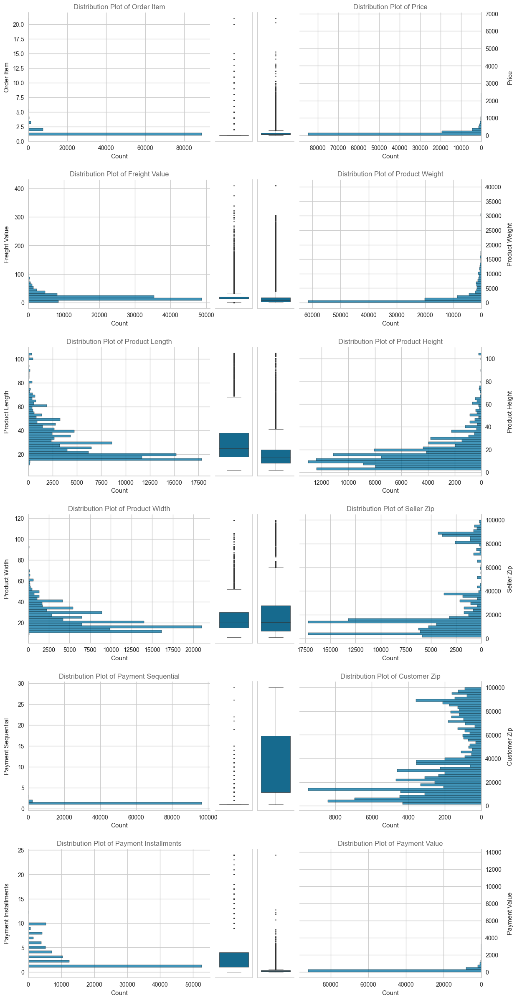

In [24]:
#Display Distribution Plot for Numerical Features in Order History and Customer Payments Dataframe
selection = np.array(list(order_history.drop('review_score',axis=1).describe().columns) +
                     list(customer_payments.describe().columns))
on_left, on_right = selection[np.r_[0,2,4,6,9,10]], selection[np.r_[1,3,5,7,8,11]]

fig, axes = plt.subplots(
    nrows=int(len(selection)/2),
    ncols=4,
    figsize=(14,int(5*len(selection)/2)),
    gridspec_kw={
        'height_ratios':[1]*int(len(selection)/2),
        'width_ratios':[5,1,1,5],
        'wspace':.05,
        'hspace':.3
    }
)

for n, nums in enumerate(selection):
    y_axis = order_history.groupby('order_id')[nums].max() if nums == 'order_item_id' else\
        order_history[nums] if n < 9 else\
            customer_payments.groupby('order_id')[nums].max() if nums == 'payment_sequential' else\
                customer_payments[nums]

    def create_histplot(on):
        return sns.histplot(
            y=y_axis,
            ax=axes[floor(n/2),0 if on == 'left' else 3],
            bins=50
        )

    def create_boxplot(on):
        return sns.boxplot(
            y=y_axis,
            ax=axes[floor(n/2),1 if on == 'left' else 2],
            linewidth=0.5,
            fliersize=1
        )

    def control_histplot(plot,on):
        sequence = ['top','right','left','bottom'] if on == 'left' else\
            ['top','left','right','bottom']
        plot.set_ylabel(' '.join(nums.split('_')[:2]).title())
        plot.yaxis.set_label_coords(-.1 if on == 'left' else 1.175,.5)
        plot.set_title(
            'Distribution Plot of '+' '.join(nums.split('_')[:2]).title(),
            size=12,
            color='dimgrey'
        )

        if on == 'right':
            plot.yaxis.tick_right()
            x_limits = plot.get_xlim()
            plot.set_xlim((x_limits[1],x_limits[0]))

        for i, loc in enumerate(sequence):
            plot.spines[loc].set_visible(False if i < 2 else True)
            plot.spines[loc].set_color('#CCCCCC')

    def control_boxplot(plot,on):
        sequence = ['left','top','bottom','right'] if on == 'left' else\
            ['right','top','bottom','left']
        plot.set_xlabel('Boxplot')
        plot.xaxis.set_visible(False)
        plot.yaxis.set_visible(False)

        for i, loc in enumerate(sequence):
            plot.spines[loc].set_visible(False if i < 2 else True)
            plot.spines[loc].set_color('#CCCCCC')

    if nums in on_left:
        control_histplot(plot=create_histplot(on='left'),on='left')
        control_boxplot(plot=create_boxplot(on='left'),on='left')

    if nums in on_right:
        control_histplot(plot=create_histplot(on='right'),on='right')
        control_boxplot(plot=create_boxplot(on='right'),on='right')

Insights:
- Based on visual inspection for numerical columns, as we can see most of numerical columns are indicate with Positive Skew Distribution. So it can be concluded, that the data in these columns are not normally distributed.

> **Visual Inspection of Categorical Columns**

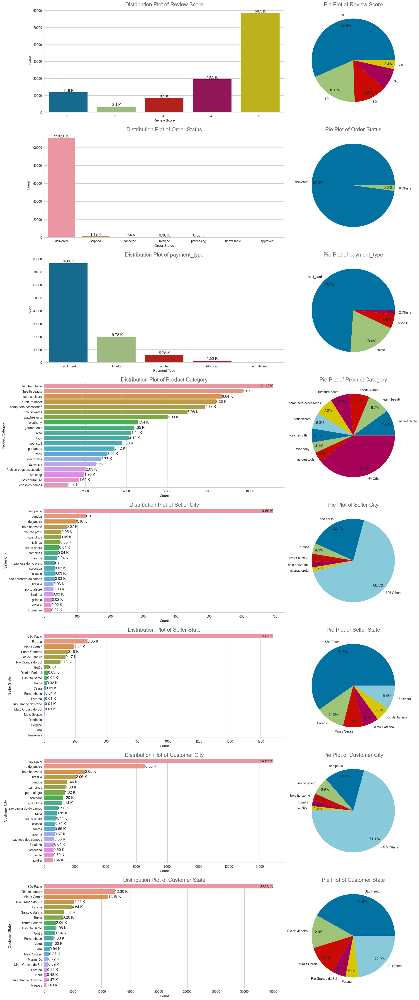

In [25]:
#Display Distribution and Pie Plot for Categorical Features in Order History and Customer Payments Dataframe
col_list = ['review_score','order_status','payment_type','product_category_name',
            'seller_city','seller_state','customer_city','customer_state']

fig, axes = plt.subplots(
        nrows=len(col_list),
        ncols=2,
        figsize=(21,7*len(col_list)),
        gridspec_kw={
            'width_ratios':[2,1],
            'wspace':.05,
            'hspace':.2
        }
    )

clause_dictionary = {
    0:[0,0,50,1000,'Review Score',0],
    1:[1,6,5,2000,'Order Status',0],
    2:[3,2,4,1500,'payment_type',1],
    3:[9,64,50,0,'Product Category',0],
    4:[5,606,50,0,'Seller City',0],
    5:[5,18,15,500,'Seller State',0],
    6:[5,4105,50,0,'Customer City',0],
    7:[5,22,50,0,'Customer State',0]
}

for i, col in enumerate(col_list):
    clause = clause_dictionary.setdefault(i)
    id_set = 'seller_id' if i >= 4 and i <=5 else 'customer_unique_id' if i > 5 else ''
    dataset = [order_history,customer_payments]
    count_aggregate = pd.DataFrame(
        dataset[clause[5]].groupby(['order_id','product_id'])[col].max().value_counts().sort_index() if i == 0 else\
            dataset[clause[5]][col].value_counts().sort_values(ascending=False) if i < 4 else\
                dataset[clause[5]].groupby(col)[id_set].nunique().sort_values(ascending=False)
    )

    barplot = sns.barplot(
        count_aggregate if i < 3 else count_aggregate.head(20),
        x=count_aggregate.index if i < 3 else col if i < 4 else id_set,
        y=col if i < 3 else count_aggregate.head(20).index,
        ax=axes[i,0]
    )

    for k, val in enumerate(count_aggregate[col if i < 4 else id_set]):
        if k < clause[2]:
            axes[i,0].annotate(
                f'{(val)/1000:,.2f} K' if i != 0 else f'{(val)/1000:,.1f} K',
                xy=(k,val+clause[3]) if i < 3 else (val+clause[3],k) if i != 5 else (val,k),
                ha='center' if i < 3 else 'left' if k > 0 else 'right',
                va='center'
            )

    sns.despine()
    axis_name = ' '.join(col.split('_')[:2]).title()
    barplot.set_xlabel(axis_name if i < 3 else 'Count'), barplot.set_ylabel('Count' if i < 3 else axis_name)
    barplot.set_title(
        f'Distribution Plot of {clause[4]}',
        size=17,
        color='dimgrey'
    )

    for loc in ['left','bottom']:
        barplot.spines[loc].set_color('#CCCCCC')

    axes[i,1].pie(
        x=list(count_aggregate[id_set][:clause[0]])+[sum(count_aggregate[id_set][clause[0]:])] if i >= 4 else\
            list(dataset[clause[5]]['review_score'].value_counts()) if i == 0 else\
                list(dataset[clause[5]][col].value_counts()[:clause[0]]) +\
                    [sum(dataset[clause[5]][col].value_counts()[clause[0]:])],
        labels=list(dataset[clause[5]]['review_score'].value_counts().index) if i == 0 else\
            list(count_aggregate.index[:clause[0]])+[f'{clause[1]} Others'] if i >= 4 else\
                list(dataset[clause[5]][col].value_counts()[:clause[0]].index) +\
                    [f'{clause[1]} Others'],
        autopct='%.1f%%',
        pctdistance=0.85,
        startangle=75 if i == 4 or i == 6 else 0
    )

    axes[i,1].set_title(
        f'Pie Plot of {clause[4]}',
        size=17,
        color='dimgrey'
    )

Insights:
- From Review_score's distribution and pie plot, It can be seen that 5 stars is the score with the most customers give to the products that they order in Olist with 56.6% from total reviews.
- In Order_status' distribution and pie plot, It can be seen that delivered is the most status that reported to the system in Olist with 97.8% from total orders.
- In Payment_types' distribution and pie plot, It can be seen that credit cards are the most common type of payment used by consumers in transactions on Olist with 73.9% compared to other payment types.
- In Product_category's distribution and pie plot, It can be seen that bed bath table, health beauty, and sport leisure is the 3 most purchased product categories in Olist e-commerce with 10%, 8.7%, and 7.8% from total. Meanwhile 64 others uncategorized product with 39.3% from total.
- Based on Seller_city and Seller_state, it can be seen that Sao Paulo is the most transaction happened in 1 city and 1 state with 22.4% and 59.7% compared to another cities and states. As well as the Customer_city and Customer_state, Sao Paulo is the city and state where the most of customers are come from with 15.6% and 41.9% from total.

> ### **Data Cleaning**

> **Missing Value of Order History**

Text(0.5, 1.0, 'Total Missing Value')

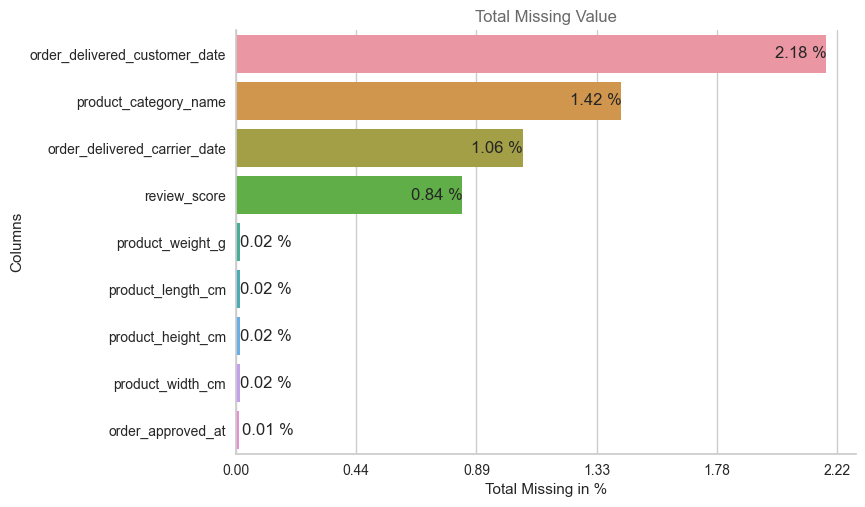

In [26]:
#Display The Total Missing Value Plot from Order History Dataframe
missing_info = pd.DataFrame(order_history.isnull().sum())
missing_info = missing_info[missing_info[0]!=0].sort_values(0,ascending=False)

barplot = sns.barplot(
    missing_info,
    x=0,
    y=missing_info.index,
)

for i, val in enumerate(missing_info[0]):
    plt.annotate(
        f'{100*(val/order_history.shape[0]):,.2f} %',
        xy=(val if i < 8 else val+10,i),
        ha='right' if i < 4 else 'left',
        va='center'
    )

sns.despine()
barplot.spines['left'].set_color('#CCCCCC'), barplot.spines['bottom'].set_color('#CCCCCC')
barplot.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x,y: f'{x/order_history.shape[0]*100:.2f}'))
plt.xlabel('Total Missing in %'), plt.ylabel('Columns')
plt.title(
    'Total Missing Value',
    size=12,
    color='dimgrey'
)

Insights:
- Based on total missing value plot above, it can be seen that order_delivered_customer_date is the most missing value data in Order History Dataframe with 2.18%, followed by product_category_name with 1.42%, order_delivered_carrier_date with 1.06%, and review_score with 0.84%. Each of these columns must be cleaned so that the model to be built is not biased.

Text(0.5, 1.0, 'Missingness Correlation of Order History\n')

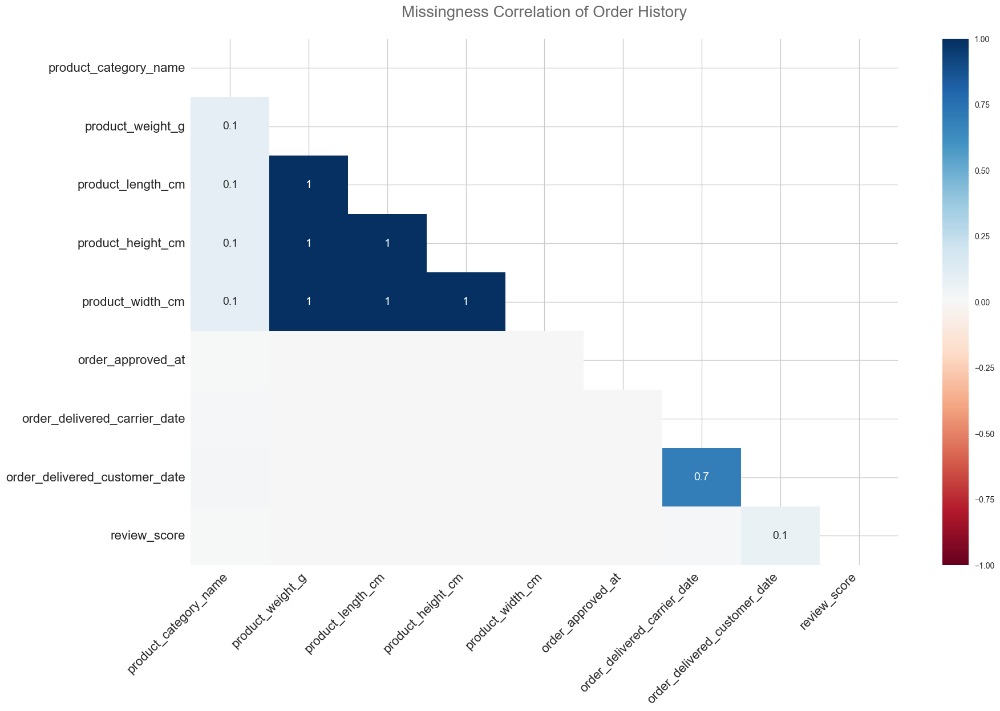

In [27]:
#Display The Missing No Heatmap from Order History Dataframe
missingno.heatmap(order_history)
plt.title(
    'Missingness Correlation of Order History\n',
    size=20,
    color='dimgrey'
)

Insights:
- Based on Missing No Heatmap above, it can be seen that product_length_cm, product_heigth_cm, product_width_cm have the strongest correlation with each other. The second strongest correlation is order_delivered_customer_date with order_delivered_carrier_date columns with value 0.7.

> **Order Approval Date Missing Value Imputing**

In [28]:
#Display order_approved_at missing value from Order History Dataframe
display(order_history[order_history['order_approved_at'].isnull()][[
    'order_id','product_id','seller_id','order_approved_at'
]].head())
order_history[order_history['order_approved_at'].isnull()].info(verbose=False)

,order_id,product_id,seller_id,order_approved_at
8204,12a95a3c06dbaec84bcfb0e2da5d228a,c6dd917a0be2a704582055949915ab32,7a67c85e85bb2ce8582c35f2203ad736,NaT
19005,2babbb4b15e6d2dfe95e2de765c97bce,c6dd917a0be2a704582055949915ab32,7a67c85e85bb2ce8582c35f2203ad736,NaT
20473,2eecb0d85f281280f79fa00f9cec1a95,4fd676d9c4723d475026e40aeae56957,5fd924b4836098a5be0ecf81ba054ce0,NaT
26393,3c0b8706b065f9919d0505d3b3343881,db8ed3d08891d16a2438a67ab3acb740,004c9cd9d87a3c30c522c48c4fc07416,NaT
36128,51eb2eebd5d76a24625b31c33dd41449,7868a64aa111bbb4f41f8e1146c0becb,cca3071e3e9bb7d12640c9fbe2301306,NaT


<class 'pandas.core.frame.DataFrame'>
Int64Index: 15 entries, 8204 to 98863
Columns: 26 entries, order_id to customer_state
dtypes: datetime64[ns](5), float64(7), int64(3), object(11)
memory usage: 3.2+ KB


In [29]:
#Dropping order_approved_at Features from Order History Dataframe
order_history.drop(
    index=order_history[order_history['order_approved_at'].isnull()].index,
    inplace=True
)

> **Product Metrics Missing Value Imputing**

In [30]:
#Display product_weight_g, product_length_cm, product_height_cm, and product_width_cm  missing value from Order History Dataframe
display(order_history[order_history['product_weight_g'].isnull()][[
    'product_weight_g','product_length_cm','product_height_cm','product_width_cm'
]].head())
order_history[order_history['product_weight_g'].isnull()].info(verbose=False)

,product_weight_g,product_length_cm,product_height_cm,product_width_cm
7098,NaN,NaN,NaN,NaN
9233,NaN,NaN,NaN,NaN
28715,NaN,NaN,NaN,NaN
28716,NaN,NaN,NaN,NaN
39299,NaN,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
Int64Index: 18 entries, 7098 to 103715
Columns: 26 entries, order_id to customer_state
dtypes: datetime64[ns](5), float64(7), int64(3), object(11)
memory usage: 3.8+ KB


In [31]:
#Display product_weight_g missing value with unique product_id
for i in order_history[order_history['product_weight_g'].isnull()]['product_id'].unique():
    display(products[products['product_id']==i][[
        'product_id','product_category_name','product_weight_g','product_length_cm','product_height_cm','product_width_cm'
    ]])

,product_id,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN


,product_id,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,baby,NaN,NaN,NaN,NaN


In [32]:
#Dropping product_weight_g Features from Order History Dataframe
order_history.drop(
    index=order_history[order_history['product_weight_g'].isnull()].index,
    inplace=True
)

> **Product Category Name Missing Value Imputing**

In [33]:
#Display product_category_name missing value with unique order_id and product_id
display(order_history[order_history['product_category_name'].isnull()][[
    'order_id','product_id','product_category_name'
]].head())
order_history[order_history['product_category_name'].isnull()].info(verbose=False)

,order_id,product_id,product_category_name
123,0046e1d57f4c07c8c92ab26be8c3dfc0,ff6caf9340512b8bf6d2a2a6df032cfa,NaN
125,00482f2670787292280e0a8153d82467,a9c404971d1a5b1cbc2e4070e02731fd,NaN
132,004f5d8f238e8908e6864b874eda3391,5a848e4ab52fd5445cdc07aab1c40e48,NaN
142,0057199db02d1a5ef41bacbf41f8f63b,41eee23c25f7a574dfaf8d5c151dbb12,NaN
171,006cb7cafc99b29548d4f412c7f9f493,e10758160da97891c2fdcbc35f0f031d,NaN


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1585 entries, 123 to 112501
Columns: 26 entries, order_id to customer_state
dtypes: datetime64[ns](5), float64(7), int64(3), object(11)
memory usage: 334.3+ KB


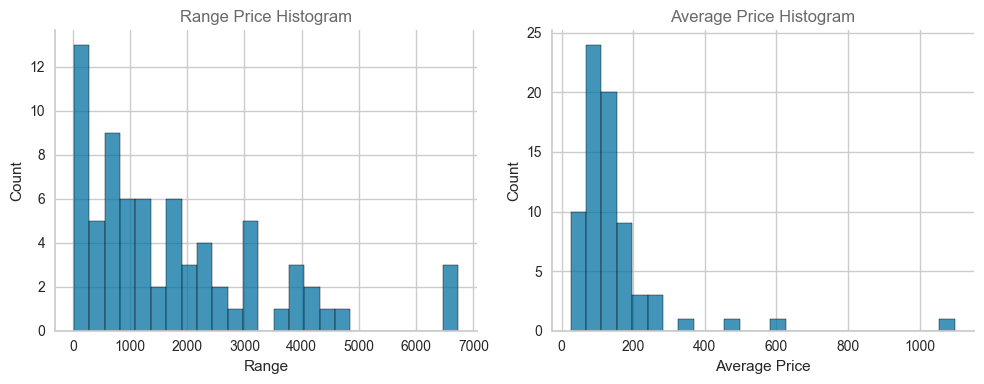

In [34]:
#Display Range and Average Price Histogram
products, minimal, maximal, rata = [], [], [], []

for prod in list(order_history['product_category_name'].dropna().unique()):
    products.append(prod)
    minimal.append(order_history[order_history['product_category_name']==prod]['price'].min())
    maximal.append(order_history[order_history['product_category_name']==prod]['price'].max())
    rata.append(order_history[order_history['product_category_name']==prod]['price'].mean())

prod = pd.DataFrame(
    data={
        'Product':products,
        'Minimal Price':minimal,
        'Maximal Price':maximal,
        'Average Price':rata
    }
)

prod['Range'] = prod['Maximal Price'] - prod['Minimal Price']
prod.sort_values(by='Range',ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

for i, cols in enumerate(['Range','Average Price']):
    sns.histplot(prod[cols], ax=axes[i], bins=25)
    sns.despine()
    axes[i].spines['bottom'].set_color('#CCCCCC'), axes[i].spines['left'].set_color('#CCCCCC')
    plt.tight_layout()
    axes[i].set_title(
        'Range Price Histogram' if i == 0 else 'Average Price Histogram',
        size=12,
        color='dimgrey'
    )

In [35]:
#Replace product_category_name missing value with value 'others'
order_history.loc[order_history['product_category_name'].isnull(),'product_category_name'] = 'others'

> **Review Score Missing Value Imputing**

In [36]:
#Display review_score missing value with unique order_id, product_id, and product_category_name
display(order_history[order_history['review_score'].isnull()][[
    'order_id','product_id','product_category_name','review_score'
]].head())
order_history[order_history['review_score'].isnull()].info(verbose=False)

,order_id,product_id,product_category_name,review_score
32,00143d0f86d6fbd9f9b38ab440ac16f5,e95ee6822b66ac6058e2e4aff656071a,sports leisure,NaN
33,00143d0f86d6fbd9f9b38ab440ac16f5,e95ee6822b66ac6058e2e4aff656071a,sports leisure,NaN
34,00143d0f86d6fbd9f9b38ab440ac16f5,e95ee6822b66ac6058e2e4aff656071a,sports leisure,NaN
89,00335b686d693c7d72deeb12f8e89227,87b08e712cc4c9fe70984c5a24b29e2f,toys,NaN
256,00a77f9cc25b05b2004752593d7b8888,33bd5538a16d23f0a39da1c9bfd20980,home confort,NaN


<class 'pandas.core.frame.DataFrame'>
Int64Index: 942 entries, 32 to 112584
Columns: 26 entries, order_id to customer_state
dtypes: datetime64[ns](5), float64(7), int64(3), object(11)
memory usage: 198.7+ KB


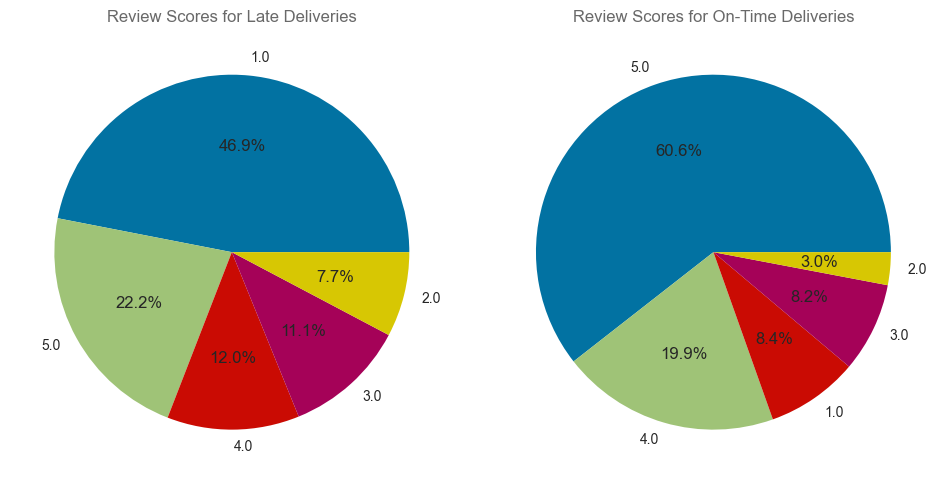

In [37]:
#Display 2 review_score Pie Plots for Late Deliveries and On-Time Deliveries
order_history['delivery_length'] = order_history['order_delivered_customer_date'] - order_history['order_purchase_timestamp']
order_history['faster_within'] = order_history['order_estimated_delivery_date'] - order_history['order_delivered_customer_date']

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

for i in range(2):
    data = order_history[order_history['faster_within'].dt.days < 0] if i == 0 else \
        order_history[order_history['faster_within'].dt.days >= 0]

    axes[i].pie(
        data['review_score'].value_counts(),
        labels=data['review_score'].value_counts().index,
        autopct='%1.1f%%'
    )
    prompt = 'Late Deliveries' if i == 0 else 'On-Time Deliveries'
    plt.tight_layout()
    axes[i].set_title(
        f'Review Scores for {prompt}',
        size=12,
        color='dimgrey'
    )

Insights:
- Based on two pie plots above, it can be seen that customers tend to give 1 star rating on late deliveries and give 5 star rating On-Time deliveries.

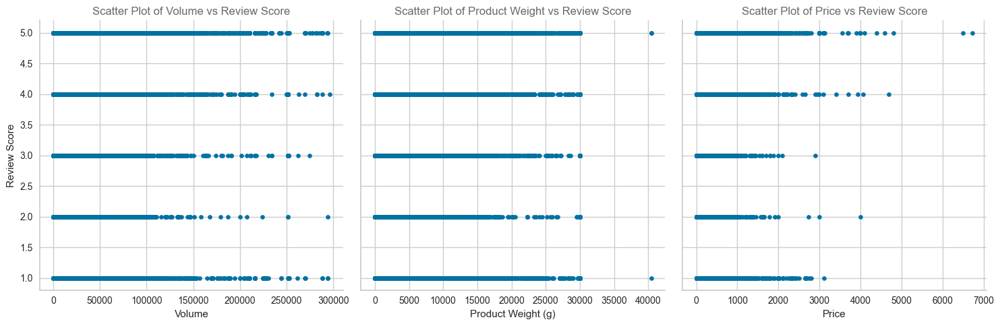

In [38]:
#Display Volume, Product Weight, and Price vs Review Score Scatter Plot
order_history['volume'] = order_history['product_height_cm'] * order_history['product_width_cm'] * order_history['product_length_cm']

fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(15,5),
    sharey=True
)

for i, col in enumerate(['volume','product_weight_g','price']):
    scatter = order_history.plot.scatter(
        x=col,
        y='review_score',
        ax=axes[i]
    )

    prompt = 'Volume' if i == 0 else 'Price' if i == 2 else 'Product Weight'
    axes[i].set_ylabel('Review Score')
    axes[i].set_xlabel('{}{}'.format(prompt,'' if i != 1 else ' (g)'))
    axes[i].set_title(
        f'Scatter Plot of {prompt} vs Review Score',
        size=12,
        color='dimgrey'
    )

    for i in ['left','bottom']:
        scatter.spines[i].set_color('#CCCCCC')

    sns.despine()
    plt.tight_layout()

Text(0.5, 1.0, 'Correlation Heatmap\n')

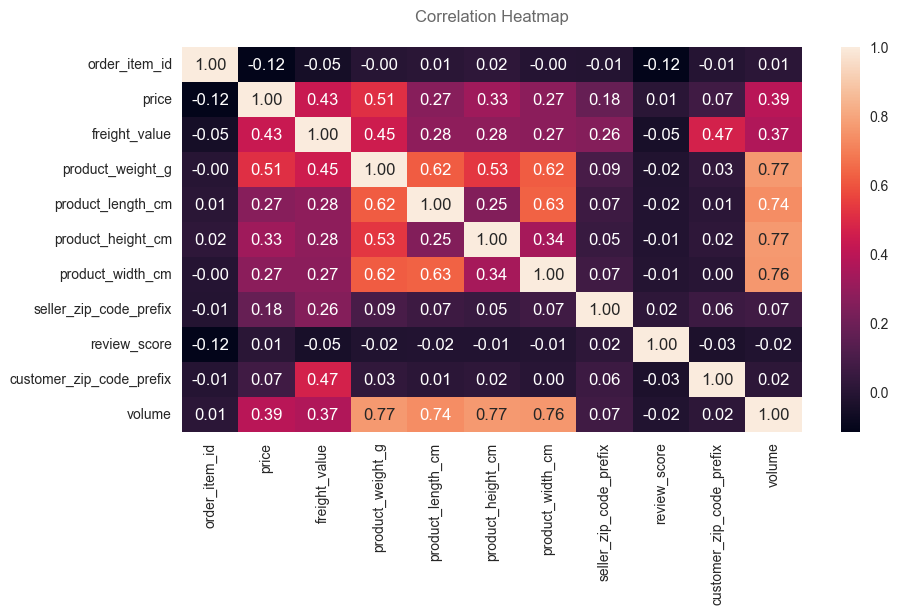

In [39]:
#Display a Correlation Heatmap from Features in Order History with Spearman Method
plt.figure(figsize=(10,5))
sns.heatmap(
    order_history.corr(numeric_only=True,method='spearman'),
    annot=True,
    fmt='.2f'
)
plt.title(
    'Correlation Heatmap\n',
    size=12,
    color='dimgrey'
)

In [40]:
#Display the p-value from kruskal test
product_category_score = order_history[
    (order_history['product_category_name'].isnull()==False) & (order_history['review_score'].isnull()==False)
]

group = [
    product_category_score[(product_category_score['product_category_name']==i)]['review_score']
    for i in product_category_score['product_category_name'].unique()
]

result = kruskal(*group)

clause = [
    ['below','above'],
    ['significant','insignificant'],
    [' at least two categories ',' ']
]

k = 0 if result.pvalue < 0.05 else 1

print(f'The p-value is {clause[0][k]} 0.05, indicating {clause[1][k]}',
      f'difference between{clause[2][k]}of the product',
      'for review score measurement.')

The p-value is below 0.05, indicating significant difference between at least two categories of the product for review score measurement.


In [41]:
#Change review_score datatype to float and replace review_score missing value with mean value
order_history['review_score'] = order_history['review_score'].astype('float')

category_score_dictionary = round(
    order_history.groupby(['product_category_name','product_id'])['review_score'].mean()
).to_dict()

def review_score_mapping(cols):
    try:
        return category_score_dictionary[(cols[0],cols[1])]
    except:
        return np.nan

review_null = order_history['review_score'].isnull()
order_history.loc[review_null,'review_score'] = order_history[review_null]\
    [['product_category_name','product_id']].apply(review_score_mapping,axis=1)

order_history.drop(
    index=order_history[order_history['review_score'].isnull()].index,
    inplace=True
)

> **Delivered Carrier and Customer Date Missing Value Imputing**

In [42]:
#Drop order_delivered_carrier_date that have smaller value than order_purchase_timestamp
display(order_history[order_history['order_delivered_carrier_date']<order_history['order_purchase_timestamp']][[
    'order_purchase_timestamp','order_delivered_carrier_date'
]].head())
order_history[order_history['order_delivered_carrier_date']<order_history['order_purchase_timestamp']].info(verbose=False)

order_history.drop(
    index=order_history[order_history['order_delivered_carrier_date']<order_history['order_purchase_timestamp']].index,
    inplace=True
)

,order_purchase_timestamp,order_delivered_carrier_date
344,2018-06-11 12:24:48,2018-06-11 12:05:00
575,2018-05-15 15:13:06,2018-05-15 14:58:00
1960,2018-08-08 13:18:36,2018-08-08 12:19:00
3516,2018-08-06 09:17:53,2018-08-06 08:44:00
3824,2018-06-27 11:16:44,2018-06-27 10:57:00


<class 'pandas.core.frame.DataFrame'>
Int64Index: 185 entries, 344 to 112564
Columns: 29 entries, order_id to volume
dtypes: datetime64[ns](5), float64(8), int64(3), object(11), timedelta64[ns](2)
memory usage: 43.4+ KB


In [43]:
#Display order_delivered_customer_date and order_delivered_carrier_date missing value
null_date = (order_history['order_delivered_customer_date'].isnull()) | (order_history['order_delivered_carrier_date'].isnull())

display(order_history[null_date].head())
order_history[null_date].info(verbose=False)

,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,delivery_length,faster_within,volume
79,002f19a65a2ddd70a090297872e6d64e,1,9eae06d51aaa383b2bed5547a19d581c,53.98,23.31,bed bath table,800.0,16.0,10.0,16.0,1835b56ce799e6a4dc4eddc053f04066,14940,ibitinga,São Paulo,shipped,2018-03-21 13:05:30,2018-03-21 13:15:27,2018-03-22 00:13:35,NaT,2018-04-16,3.0,7fa80efb1ef15ca4104627910c29791c,205d5aa158338f2b733a07326aae8c87,42804,camacari,Bahia,NaT,NaT,2560.0
84,00310b0c75bb13015ec4d82d341865a4,1,c8e7c2ef329fcda4a233e7e2f8bb8b7d,39.90,15.38,housewares,200.0,16.0,12.0,11.0,a2deecd5398f5df4987110c80a1972a3,5043,sao paulo,São Paulo,canceled,2018-08-15 14:29:08,2018-08-15 15:04:25,NaT,NaT,2018-08-29,1.0,0dad07848c618cc5a4679a1bfe1db8d2,ec979208947bbba310f2ad8e50963725,31160,belo horizonte,Minas Gerais,NaT,NaT,2112.0
260,00a99c50fdff7e36262caba33821875a,1,76d75f398634bf194ba99d7297e7d1fa,52.99,22.30,computers accessories,350.0,25.0,11.0,15.0,974cf2cb8f4b7add98709c30df02fe10,14802,araraquara,São Paulo,shipped,2018-08-17 16:25:04,2018-08-17 16:35:18,2018-08-18 09:07:00,NaT,2018-09-18,5.0,7a399396442d5601cbedfbd0a3cf1da4,60ec651482858c327c177cf9360cc0a2,45990,teixeira de freitas,Bahia,NaT,NaT,4125.0
270,00ae7a8b4936674ebb701d4a23719a79,1,66f09a6de4f2ef63aaf5349b60a0e0c0,27.90,9.26,auto,600.0,16.0,11.0,11.0,bf0d50a6410d487dc97d2baac0a8c0be,13408,piracicaba,São Paulo,canceled,2018-05-09 14:14:06,2018-05-09 15:51:32,NaT,NaT,2018-05-17,2.0,a7e8a3cb55d9c9a536992c6465a46a3f,f0b9f688a3b9151bc6b38f4b5b36ea44,6539,santana de parnaiba,São Paulo,NaT,NaT,1936.0
422,00ff0cf5583758e6964723e42f111bf4,1,bb1fe952bdc16ef8974d4ca11aec19b7,154.90,15.25,health beauty,417.0,16.0,15.0,14.0,b17b679f4f5ce2e03ce6968c62648246,14090,ribeirao preto,São Paulo,canceled,2017-04-10 00:45:56,2017-04-10 01:03:29,NaT,NaT,2017-05-04,1.0,e3626ed5d1f2e3a02d692ec948b25eeb,b9badb100ff8ecc16a403111209e3a06,88025,florianopolis,Santa Catarina,NaT,NaT,3360.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2433 entries, 79 to 112421
Columns: 29 entries, order_id to volume
dtypes: datetime64[ns](5), float64(8), int64(3), object(11), timedelta64[ns](2)
memory usage: 570.2+ KB


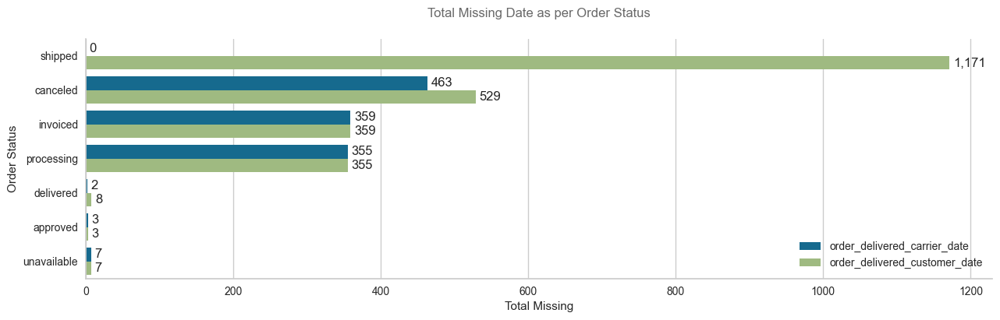

In [44]:
#Plotting Total Missing Date as per Order Status
total_list = []
status_list = []

for i in order_history[null_date]['order_status'].unique():
    count = order_history[order_history['order_status']==i][[
        'order_delivered_carrier_date','order_delivered_customer_date'
    ]].isnull().sum()

    for j in range(len(count)):
        total_list.append(count[j])
        status_list.append(i)

info_list = ['order_delivered_carrier_date','order_delivered_customer_date']*7

count_missing_df = pd.DataFrame(
    data=[
        total_list,
        status_list,
        info_list
    ]).transpose().rename(
        columns={
            0:'Total Missing',
            1:'Order Status',
            2:'Date Info'
        }
    )

plt.figure(figsize=(15,4))

barplot = sns.barplot(
    count_missing_df,
    x='Total Missing',
    y='Order Status',
    hue='Date Info'
)

for i, val in enumerate(count_missing_df['Total Missing']):
    plt.annotate(
        f'{val:,.0f}',
        xy=(val+5,(i/2)-0.05 if i%2 == 0 else (i/2)-0.125),
        ha='left',
        va='bottom'
    )

for i in ['left','bottom']:
    barplot.spines[i].set_color('#CCCCCC')

sns.despine()
plt.legend(loc=4),
plt.title(
    'Total Missing Date as per Order Status',
    size=12,
    color='dimgrey',
    pad=20
)

plt.show()

Insights:
- There is no missing value in the order_delivered_carrier_date column with shipped order status.

In [45]:
#Drop order_delivered_carrier_date and order_delivered_customer_date missing value
missing_delivery_date = order_history[
    (order_history['order_status']=='delivered') &
    (
        (order_history['order_delivered_carrier_date'].isnull()) |
        (order_history['order_delivered_customer_date'].isnull())
    )
][['order_id','order_delivered_carrier_date','order_delivered_customer_date']]

display(missing_delivery_date)
missing_delivery_date.info(verbose=False)

order_history.drop(
    index=missing_delivery_date.index,
    inplace=True
)

,order_id,order_delivered_carrier_date,order_delivered_customer_date
5841,0d3268bad9b086af767785e3f0fc0133,2018-07-03 09:28:00,NaT
14472,20edc82cf5400ce95e1afacc25798b31,2018-07-03 19:26:00,NaT
18554,2aa91108853cecb43c84a5dc5b277475,NaT,2017-11-20 19:44:47
19642,2d1e2d5bf4dc7227b3bfebb81328c15f,2017-11-30 18:12:23,NaT
19838,2d858f451373b04fb5c984a1cc2defaf,NaT,NaT
20393,2ebdfc4f15f23b91474edf87475f108e,2018-07-03 13:57:00,NaT
75303,ab7c89dc1bf4a1ead9d6ec1ec8968a84,2018-06-12 14:10:00,NaT
101642,e69f75a717d64fc5ecdfae42b2e8e086,2018-07-03 13:57:00,NaT
108192,f5dd62b788049ad9fc0526e3ad11a097,2018-06-25 08:05:00,NaT


<class 'pandas.core.frame.DataFrame'>
Int64Index: 9 entries, 5841 to 108192
Columns: 3 entries, order_id to order_delivered_customer_date
dtypes: datetime64[ns](2), object(1)
memory usage: 288.0+ bytes


> **Missing Value of Customer Payments**

In [46]:
#Display Features from Customer Payments with missing value
customer_payments.isnull().sum()

order_id                    0
customer_unique_id          0
order_purchase_timestamp    0
payment_sequential          1
payment_type                1
payment_installments        1
payment_value               1
dtype: int64

In [47]:
#Drop payment_sequential, payment_type, payment_installments, and payment_value missing value
customer_payments.dropna(axis=0,inplace=True)

> ### **Exploratory Data Analysis Part 2**

> **Historical Purchase Analysis**

In [48]:
#Make a new Dataframe named eda_df with a order_purchase_timestamp break value to 'year','month','month_name','year_month','date','day','dayofweek','dayofweek_name','hour' columns
eda_df = order_history.groupby('order_id')[[
    'order_id',
    'customer_unique_id','customer_zip_code_prefix','customer_city','customer_state',
    'seller_id','seller_zip_code_prefix','seller_city','seller_state',
    'order_purchase_timestamp'
]].head(1)
cols = ['year','month','month_name','year_month','date','day','dayofweek','dayofweek_name','hour']

for i, col in enumerate(cols):
    eda_df['order_purchase_'+col] = eda_df['order_purchase_timestamp'].apply(
        lambda x: x.year if i == 0 else x.month if i == 1 else x.strftime('%b') if i == 2 else\
            x.strftime('%Y%m') if i == 3 else x.strftime('%Y%m%d') if i == 4 else x.day if i == 5 else\
                x.dayofweek if i == 6 else x.strftime('%a') if i == 7 else x.hour
    )

eda_df['order_purchase_time_day'] = pd.cut(
    x=eda_df['order_purchase_hour'],
    bins=[-0.1, 6, 12, 18, 23],
    labels=['Dawn','Morning','Afternoon','Night']
)

display(eda_df.head())
eda_df.info(verbose=False)

,order_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day
0,00010242fe8c5a6d1ba2dd792cb16214,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,Rio de Janeiro,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,São Paulo,2017-09-13 08:59:02,2017,9,Sep,201709,20170913,13,2,Wed,8,Morning
1,00018f77f2f0320c557190d7a144bdd3,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,São Paulo,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,São Paulo,2017-04-26 10:53:06,2017,4,Apr,201704,20170426,26,2,Wed,10,Morning
2,000229ec398224ef6ca0657da4fc703e,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,Minas Gerais,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,Minas Gerais,2018-01-14 14:33:31,2018,1,Jan,201801,20180114,14,6,Sun,14,Afternoon
3,00024acbcdf0a6daa1e931b038114c75,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,São Paulo,9d7a1d34a5052409006425275ba1c2b4,14403,franca,São Paulo,2018-08-08 10:00:35,2018,8,Aug,201808,20180808,8,2,Wed,10,Morning
4,00042b26cf59d7ce69dfabb4e55b4fd9,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,São Paulo,df560393f3a51e74553ab94004ba5c87,87900,loanda,Paraná,2017-02-04 13:57:51,2017,2,Feb,201702,20170204,4,5,Sat,13,Afternoon


<class 'pandas.core.frame.DataFrame'>
Int64Index: 98317 entries, 0 to 112649
Columns: 20 entries, order_id to order_purchase_time_day
dtypes: category(1), datetime64[ns](1), int64(7), object(11)
memory usage: 15.1+ MB


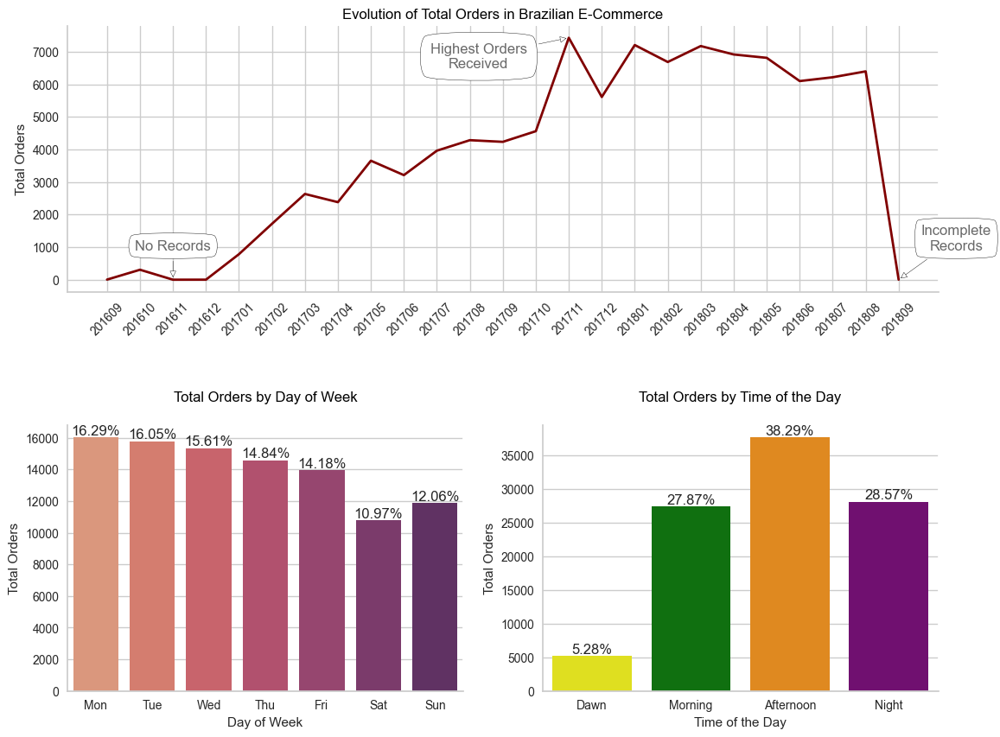

In [49]:
#Make an Evolution of Total Orders in Brazilian E-Commerce Plot
fig = plt.figure(constrained_layout=True, figsize=(13, 10))

# Axis definition
gs = GridSpec(2, 2, figure=fig, hspace=.5)
ax1 = fig.add_subplot(gs[0,:])
ax2 = fig.add_subplot(gs[1,0])
ax3 = fig.add_subplot(gs[1,1])

# Lineplot - Evolution of e-commerce orders along time
sns.lineplot(
    data=eda_df['order_purchase_year_month'].value_counts().append(
        pd.Series({'201611':0})
    ).sort_index(),
    ax=ax1,
    color='maroon',
    linewidth=2
)

ax1.annotate(
    f'Highest Orders\nReceived',
    xy=(14,7432),
    xytext=(-75,-25),
    textcoords='offset points',
    bbox=dict(
        boxstyle="round4",
        fc="w",
        pad=.8
    ),
    arrowprops=dict(
        arrowstyle='-|>',
        fc='w'
    ),
    color='dimgrey',
    ha='center'
)

ax1.annotate(
    f'Incomplete\nRecords',
    xy=(24,0),
    xytext=(48,25),
    textcoords='offset points',
    bbox=dict(
        boxstyle="round4",
        fc="w",
        pad=.5
    ),
    arrowprops=dict(
        arrowstyle='-|>',
        fc='w'
    ),
    color='dimgrey',
    ha='center'
)

ax1.annotate(
    f'No Records',
    xy=(2,0),
    xytext=(0,25),
    textcoords='offset points',
    bbox=dict(
        boxstyle="round4",
        fc="w",
        pad=.5
    ),
    arrowprops=dict(
        arrowstyle='-|>',
        fc='w'
    ),
    color='dimgrey',
    ha='center'
)

format_spines(ax1, right_border=False)

for tick in ax1.get_xticklabels():
    tick.set_rotation(45)

ax1.set_title(
    'Evolution of Total Orders in Brazilian E-Commerce',
    size=12,
    color='black'
)

ax1.set_ylabel('Total Orders')

# Barchart - Total of orders by day of week
single_countplot(
    eda_df,
    x='order_purchase_dayofweek',
    ax=ax2,
    order=False,
    palette='flare'
)

ax2.set_xlabel('Day of Week'), ax2.set_ylabel('Total Orders')
ax2.set_xticklabels(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])
ax2.set_title(
    'Total Orders by Day of Week',
    size=12,
    color='black',
    pad=20
)

# Barchart - Total of orders by time of the day
single_countplot(
    eda_df,
    x='order_purchase_time_day',
    ax=ax3,
    order=False,
    palette=['yellow','green','darkorange','purple']
)

ax3.set_title(
    'Total Orders by Time of the Day',
    size=12,
    color='black',
    pad=20
)

ax3.set_xlabel('Time of the Day')
ax3.set_ylabel('Total Orders')
plt.tight_layout()
plt.show()

Insights:
- There is no record on November 2016 and incomplete records on September 2018. The Highest orders received in 1 month is on November 2017.
- Based on total orders by the day of week, Monday and Tuesday are the most transaction happened in a week with 16.29% and 16.05% from total.
- In total orders by time of the day, it can be seen that afternoon is the most transaction happened in a day with 38.29% from total. This may happen because more customers have free time during the lunch breaks. The second most is during night while customers have more free time after all day work.

> **Sales Performance Between 2017 and 2018 (Q1-Q2)**

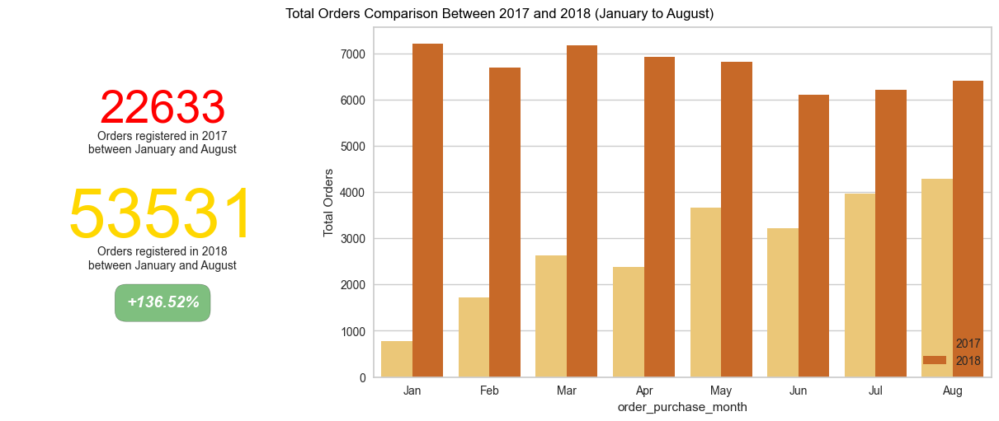

In [50]:
#Make a Total Orders Comparison Between 2017 and 2018 (January to August) Plot
fig = plt.figure(constrained_layout=True, figsize=(12, 5))

# Axis definition
gs = GridSpec(1, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])

# Annotation - Grown on e-commerce orders between 2017 and 2018
df_orders_compare = eda_df.query('order_purchase_year in (2017, 2018) & order_purchase_month <= 8')
year_orders = df_orders_compare['order_purchase_year'].value_counts()
growth = round(100*((year_orders[2018]-year_orders[2017])/year_orders[2017]),2)
ax1.text(
    x=0.5,
    y=0.73,
    s=f'{year_orders[2017]}',
    fontsize=40,
    color='red',
    ha='center'
)

ax1.text(
    x=0.5,
    y=0.64,
    s='Orders registered in 2017\nbetween January and August',
    fontsize=10,
    ha='center'
)

ax1.text(
    x=0.5,
    y=0.40,
    s=f'{year_orders[2018]}',
    fontsize=60,
    color='gold',
    ha='center'
)

ax1.text(
    x=0.5,
    y=0.31,
    s='Orders registered in 2018\nbetween January and August',
    fontsize=10,
    ha='center'
)

signal = '+' if growth > 0 else '-'
ax1.text(
    x=0.5,
    y=0.20,
    s=f'{signal}{growth}%',
    fontsize=14,
    ha='center',
    color='white',
    style='italic',
    weight='bold',
    bbox=dict(
        facecolor='green',
        alpha=0.5,
        pad=10,
        boxstyle='round, pad=.7'
    )
)

ax1.axis('off')

# Bar chart - Comparison between monthly sales between 2017 and 2018
sns.countplot(
    data=df_orders_compare,
    x='order_purchase_month',
    hue='order_purchase_year',
    ax=ax2,
    palette='YlOrBr'
)

ax2.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'])
ax2.set_ylabel('Total Orders')
plt.suptitle(
    'Total Orders Comparison Between 2017 and 2018 (January to August)',
    size=12,
    color='black'
)

plt.legend(loc='lower right')
plt.show()

Insights:
- Based on Comparison plot above, it can be seen that there was an increase in orders of 136.52% between January and August in 2017 to January and August in 2018. This might happen because many new customers are transacting on Olist in 2018. Therefore, this case should be investigated further in modelling.

> **Order Tracking and Reporting**

In [51]:
# Filtered orders only from January 2017
eda_df = eda_df[
    (eda_df['order_purchase_year_month'].astype(int) >= 201701) &
    (eda_df['order_purchase_year_month'].astype(int) <= 201808)
]

# Using the API to bring the region to the data
r = requests.get('https://servicodados.ibge.gov.br/api/v1/localidades/mesorregioes')
content = [c['UF'] for c in json.loads(r.text)]
br_info = pd.DataFrame(content).rename(
    columns={
        'sigla':'state_code',
        'nome':'state_name',
        'regiao':'region'
    }
)

def english_region(cols):
    region_dict = {
        'Norte':'North',
        'Nordeste':'Northeast',
        'Sudeste':'Southeast',
        'Sul':'South',
        'Centro-Oeste':'Midwest'
    }
    return region_dict.setdefault(cols)

br_info['region'] = br_info['region'].apply(lambda x: x['nome'])
br_info['region'] = br_info['region'].apply(english_region)
br_info.drop_duplicates(inplace=True)

# Threting geolocations outside brazilian map

#Brazils most Northern spot is at 5 deg 16′ 27.8″ N latitude.;
geo_prep = geo[geo.geolocation_lat <= 5.27438888]
#it’s most Western spot is at 73 deg, 58′ 58.19″W Long.
geo_prep = geo_prep[geo_prep.geolocation_lng >= -73.98283055]
#It’s most southern spot is at 33 deg, 45′ 04.21″ S Latitude.
geo_prep = geo_prep[geo_prep.geolocation_lat >= -33.75116944]
#It’s most Eastern spot is 34 deg, 47′ 35.33″ W Long.
geo_prep = geo_prep[geo_prep.geolocation_lng <=  -34.79314722]
geo_group = geo_prep.groupby(
    'geolocation_zip_code_prefix', as_index=False
).mean()

eda_df = eda_df.merge(
    br_info[['state_name','region']],
    how='left',
    left_on='customer_state',
    right_on='state_name'
).drop('state_name',axis=1)

eda_df = eda_df.merge(
    geo_group,
    how='left',
    left_on='customer_zip_code_prefix',
    right_on='geolocation_zip_code_prefix'
).drop(
    'geolocation_zip_code_prefix',axis=1
).dropna(axis=0)

eda_df.drop(
    index=eda_df[eda_df['order_purchase_year_month']=='201809'].index,
    inplace=True
)

# Grouping data by region
df_regions_group = eda_df.groupby(
    ['order_purchase_year_month','region'],
    as_index=False
).agg({
    'customer_unique_id':'count'
}).sort_values(by='order_purchase_year_month')

df_regions_group.columns = ['month','region','order_count']
df_regions_group.reset_index(drop=True, inplace=True)

# Grouping data by city
df_cities_group = eda_df.groupby(
    'customer_city',
    as_index=False
).count().loc[:,['customer_city','order_id']]

df_cities_group = df_cities_group.sort_values(
    'order_id',
    ascending=False
).reset_index(drop=True)

# Grouping data by state
df_states_group = eda_df.groupby(
    'customer_state',
    as_index=False
).count().loc[:,['customer_state','order_id']]

df_states_group = df_states_group.sort_values(
    'order_id',
    ascending=False
).reset_index(drop=True)

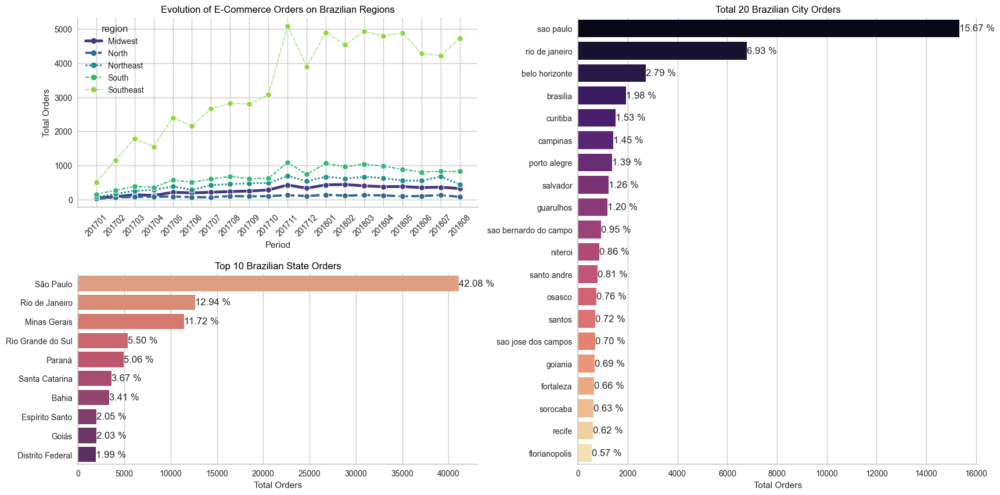

In [52]:
# Creating and preparing figure and axis
fig = plt.figure(constrained_layout=True, figsize=(20, 10))
gs = GridSpec(2, 2, figure=fig, wspace=.25, hspace=.35)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[:, 1])

# Count of orders by region
sns.lineplot(
    data=df_regions_group,
    x='month',
    y='order_count',
    ax=ax1,
    hue='region',
    size='region',
    style='region',
    palette='viridis',
    markers=['o'] * 5
)

format_spines(ax1,right_border=False)
ax1.set_xlabel('Period'), ax1.set_ylabel('Total Orders')
ax1.set_title(
    'Evolution of E-Commerce Orders on Brazilian Regions',
    size=12,
    color='black'
)

for tick in ax1.get_xticklabels():
    tick.set_rotation(45)

plt.tight_layout()

# Top cities with more customers orders in Brazil
sns.barplot(
    data=df_states_group.head(10),
    x='order_id',
    y='customer_state',
    ax=ax2,
    palette='flare'
)

for i, val in enumerate(df_states_group.head(10)['order_id']):
    ax2.annotate(
        '{:.2f} %'.format(100*(val/sum(df_states_group['order_id']))),
        xy=(val,i),
        ha='left',
        va='center'
    )

format_spines(ax2,right_border=False)
ax2.set_xlabel('Total Orders'), ax2.set_ylabel('')
ax2.set_title(
    'Top 10 Brazilian State Orders',
    size=12,
    color='black'
)

# Total orders by state
sns.barplot(
    data=df_cities_group.head(20),
    x='order_id',
    y='customer_city',
    ax=ax3,
    palette='magma'
)

for i, val in enumerate(df_cities_group.head(20)['order_id']):
    ax3.annotate(
        '{:.2f} %'.format(100*(val/sum(df_cities_group['order_id']))),
        xy=(val,i),
        ha='left',
        va='center'
    )

format_spines(ax3,right_border=False)
ax3.set_title('Total 20 Brazilian City Orders', size=12, color='black')
ax3.set_xlabel('Total Orders'), ax3.set_ylabel('')
plt.show()

Insights:
- Based on Evolution of E-Commerce Orders on Brazilian Regions plot, it can be seen that Brazil is divided into 5 major regions, where the South East is the region with the fastest evolution of e-commerce orders from January 2017 to August 2018. Meanwhile Sao Paulo and Rio de Janeiro from South East region are also in the 1st and 2nd place for top orders in each states and cities.

In [53]:
# Zipping locations
lats = list(eda_df['geolocation_lat'].values)
longs = list(eda_df['geolocation_lng'].values)
locations = list(zip(lats, longs))

# Creating a mapa using folium
map1 = folium.Map(location=[-15, -50], zoom_start=4.0)

# Plugin: FastMarkerCluster
FastMarkerCluster(data=locations).add_to(map1)

map1

In [54]:
# Grouping geolocation data for plotting a heatmap
heat_data = eda_df.groupby(
    ['geolocation_lat','geolocation_lng'],
    as_index=False
).count().iloc[:, :3]

# Creating a mapa using folium
map1 = folium.Map(
    location=[-15, -50],
    zoom_start=4.0,
    tiles='cartodbdark_matter'
)

# Plugin: HeatMap
HeatMap(
    name='Heatmap',
    data=heat_data,
    radius=10,
    max_zoom=13
).add_to(map1)

map1

In [55]:
#Display Heatmap with Time Changing
epoch_list = []
time_index = eda_df['order_purchase_year_month'].sort_values().unique()

for epoch in time_index:
    data_temp = eda_df.query('order_purchase_year_month == @epoch')
    data_temp = data_temp.groupby(
        ['geolocation_lat','geolocation_lng'],
        as_index=False
    ).count()

    data_temp = data_temp.sort_values(
        'order_id', ascending=False
    ).iloc[:, :3]

    epoch_list.append(data_temp.values.tolist())

# Creating a mapa using folium
map2 = folium.Map(
    location=[-15, -50],
    zoom_start=4.0,
    tiles='cartodbdark_matter'
)

# Plugin: HeatMapWithTime
HeatMapWithTime(
    name='Evolution of Orders in a Geolocation Perspective',
    data=epoch_list,
    radius=10,
    index=list(time_index)
).add_to(map2)

map2

Insights:
- Based on 3 plot map above, it can be seen that the evolution of e-commerce orders from January 2017 to August 2018 in South East Region of Brazil is growing so fast. This indicates that, more and more customers are switching to online shopping from conventional shopping. By shopping online, customers don't have to bother coming to the store directly and the prices they get tend to be cheaper than shopping directly to the store.

> **Seller Geospatial Visualization**

In [56]:
#Display Seller State and Code with seller_id count of unique
count_sellers_states = order_history.groupby('seller_state')[['seller_id']].nunique()\
    .sort_values('seller_id',ascending=False).reset_index()

def state_codes(cols):
    for key, val in state_disctionary.items():
        if val == cols[0]:
            return key

count_sellers_states['state_code'] = count_sellers_states[['seller_state']].apply(state_codes,axis=1)
count_sellers_states.head()

,seller_state,seller_id,state_code
0,São Paulo,1844,SP
1,Paraná,347,PR
2,Minas Gerais,244,MG
3,Santa Catarina,190,SC
4,Rio de Janeiro,171,RJ


In [57]:
#Display Seller latitude and longitude based on State, city, and count of seller_id
count_sellers_city = order_history.groupby(['seller_state','seller_city'])[['seller_id']].nunique()\
    .sort_values('seller_id',ascending=False).reset_index()

top_sellers_city = count_sellers_city.groupby('seller_state').head(1)
seller_map = geo.drop('geolocation_zip_code_prefix',axis=1).copy().groupby('geolocation_city').mean()

def geo_mapping(cols):
    try:
        return seller_map.loc[cols[0]]
    except:
        return np.nan

for i in [['geolocation_lat','seller_lat'],['geolocation_lng','seller_lng']]:
    top_sellers_city[i[1]] = top_sellers_city[['seller_city']].apply(geo_mapping,axis=1)[i[0]]

top_sellers_city.dropna(axis=0, inplace=True)
top_sellers_city.head()

,seller_state,seller_city,seller_id,seller_lat,seller_lng
0,São Paulo,sao paulo,692,-23.570860,-46.633242
1,Paraná,curitiba,123,-25.453054,-49.274996
2,Rio de Janeiro,rio de janeiro,93,-22.914910,-43.312883
3,Minas Gerais,belo horizonte,66,-19.908772,-43.957549
14,Distrito Federal,brasilia,28,-15.811073,-47.971705


In [58]:
#Input Brazilian Sellers' Map
map_brazil = folium.Map(
     location=[-14.235004,-51.92528],
     zoom_start=4.0,
     tiles="openstreetmap",
     control_scale=True
)

with open('Brasil.json', 'rb') as b:
    brazil_states = json.load(b)

for i in range(len(top_sellers_city)):
    rank = list(
        count_sellers_city[
            count_sellers_city['seller_city']==top_sellers_city.iloc[i].loc['seller_city']
        ].index.values
    ).pop()+1

    folium.Marker(
         [top_sellers_city.iloc[i]['seller_lat'],top_sellers_city.iloc[i]['seller_lng']],
         tooltip=(
              'Ranked #'+ str(rank)+', City: '+(top_sellers_city.iloc[i]['seller_city'].title())
              +' - '+(top_sellers_city.iloc[i]['seller_id']).astype('str')+' Sellers'
         ),
         icon=folium.Icon(color='blue'),
    ).add_to(map_brazil)

tiles_type = ['cartodbpositron', 'openstreetmap', 'stamenterrain']

for tile in tiles_type:
    folium.TileLayer(tile).add_to(map_brazil)

choropleth=folium.Choropleth(
     geo_data=brazil_states,
     data=count_sellers_states,
     columns=['state_code','seller_id'],
     key_on='feature.properties.UF',
     fill_color='Greys',
     nan_fill_color='White',
     legend_name='Top Sellers in Brazil',
     fill_opacity=1,
     line_opacity=1,
     smooth_factor=1,
     bins=100
).add_to(map_brazil)

state_json_index = []

for i in range(len(brazil_states['features'])):
    state_json_index.append(brazil_states['features'][i]['properties']['ESTADO'])

state_df = pd.DataFrame(data={
    'seller_state':state_json_index
})

state_df = state_df.merge(
    count_sellers_states.drop('state_code',axis=1),
    how='left',
    on='seller_state',
)

state_df.loc[state_df['seller_id'].isnull(),'seller_id'] = 0
state_df['seller_id'] = state_df['seller_id'].astype('int')
tooltip_text = []

for i in range(len(state_df)):
    tooltip_text.append(str(state_df['seller_id'][i])+' Sellers')

for idx in range(len(state_df)):
    brazil_states['features'][idx]['properties']['tooltip1'] = tooltip_text[idx]

style_function = "font-size: 14px; font-weight: bold"
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
         fields=['UF','ESTADO','tooltip1'],
         aliases=['States Code: ','States Name: ','Total: '],
         style= style_function,
         labels= True
    ))

title= '''<h3 align="center" style="font-size:16px"><b>{}</b></h3>'''.format(
     "Top Sellers in Brazil by States from January 2017"
)

map_brazil.get_root().html.add_child(folium.Element(title))

map_brazil

Insights:
- Based on folium map above, It can be seen that the sellers' coordinate points tend to spread evenly to the South East Region of Brazil.

> **Customer Geospatial Visualization**

In [59]:
#Display Customer State and Code with customer_unique_id count of
count_customers_states = order_history.groupby('customer_state')[['customer_unique_id']].nunique()\
    .sort_values('customer_unique_id',ascending=False).reset_index()

def state_codes(cols):
    for key, val in state_disctionary.items():
        if val == cols[0]:
            return key

count_customers_states['state_code'] = count_customers_states[['customer_state']].apply(state_codes,axis=1)
count_customers_states.head()

,customer_state,customer_unique_id,state_code
0,São Paulo,39861,SP
1,Rio de Janeiro,12253,RJ
2,Minas Gerais,11140,MG
3,Rio Grande do Sul,5225,RS
4,Paraná,4821,PR


In [60]:
#Display Customer latitude and longitude based on State, city, and count of customer_unique_id
count_customers_city = order_history.groupby(['customer_state','customer_city'])[['customer_unique_id']].nunique()\
    .sort_values('customer_unique_id',ascending=False).reset_index()

top_customers_city = count_customers_city.groupby('customer_state').head(1)
customer_map = geo.drop('geolocation_zip_code_prefix',axis=1).copy().groupby('geolocation_city').mean()

def geo_mapping(cols):
    try:
        return customer_map.loc[cols[0]]
    except:
        return np.nan

for i in [['geolocation_lat','customer_lat'],['geolocation_lng','customer_lng']]:
    top_customers_city[i[1]] = top_customers_city[['customer_city']].apply(geo_mapping,axis=1)[i[0]]

top_customers_city.dropna(axis=0, inplace=True)
top_customers_city.head()

,customer_state,customer_city,customer_unique_id,customer_lat,customer_lng
0,São Paulo,sao paulo,14821,-23.570860,-46.633242
1,Rio de Janeiro,rio de janeiro,6551,-22.914910,-43.312883
2,Minas Gerais,belo horizonte,2645,-19.908772,-43.957549
3,Distrito Federal,brasilia,2051,-15.811073,-47.971705
4,Paraná,curitiba,1450,-25.453054,-49.274996


In [61]:
#Input Brazilian Customers' Map
map_brazil = folium.Map(
     location=[-14.235004,-51.92528],
     zoom_start=4.0,
     tiles="openstreetmap",
     control_scale=True
)

with open('Brasil.json', 'rb') as b:
    brazil_states = json.load(b)

for i in range(len(top_customers_city)):
    rank = list(
        count_customers_city[
            count_customers_city['customer_city']==top_customers_city.iloc[i].loc['customer_city']
        ].index.values
    ).pop()+1

    folium.Marker(
         [top_customers_city.iloc[i]['customer_lat'],top_customers_city.iloc[i]['customer_lng']],
         tooltip=(
              'Ranked #'+ str(rank)+', City: '+(top_customers_city.iloc[i]['customer_city'].title())
              +' - '+(top_customers_city.iloc[i]['customer_unique_id']).astype('str')+' Customers'
         ),
         icon=folium.Icon(color='blue'),
    ).add_to(map_brazil)

tiles_type = ['cartodbpositron', 'openstreetmap', 'stamenterrain']

for tile in tiles_type:
    folium.TileLayer(tile).add_to(map_brazil)

choropleth=folium.Choropleth(
     geo_data= brazil_states,
     data= count_customers_states,
     columns= ['state_code','customer_unique_id'],
     key_on= 'feature.properties.UF',
     fill_color='Greys',
     nan_fill_color='White',
     legend_name='Top Sellers in Brazil',
     fill_opacity=1,
     line_opacity=1,
     smooth_factor=1,
     bins=100
).add_to(map_brazil)

state_json_index = []

for i in range(len(brazil_states['features'])):
    state_json_index.append(brazil_states['features'][i]['properties']['ESTADO'])

state_df = pd.DataFrame(data={
    'customer_state':state_json_index
})

state_df = state_df.merge(
    count_customers_states.drop('state_code',axis=1),
    how='left',
    on='customer_state',
)

state_df.loc[state_df['customer_unique_id'].isnull(),'customer_unique_id'] = 0
state_df['customer_unique_id'] = state_df['customer_unique_id'].astype('int')
tooltip_text = []

for i in range(len(state_df)):
    tooltip_text.append(str(state_df['customer_unique_id'][i])+' Customers')

for idx in range(len(state_df)):
    brazil_states['features'][idx]['properties']['tooltip1'] = tooltip_text[idx]

style_function = "font-size: 14px; font-weight: bold"
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
         fields=['UF','ESTADO','tooltip1'],
         aliases=['States Code: ','States Name: ','Total: '],
         style= style_function,
         labels= True
    ))

title= '''<h3 align="center" style="font-size:16px"><b>{}</b></h3>'''.format(
     "Total Customers in Brazil by States from January 2017"
)

map_brazil.get_root().html.add_child(folium.Element(title))

map_brazil

Insights:
- Based on folium map above, It can be seen that the customers' coordinate points tend to spread evenly to the All Region of Brazil.

> **The Economic Significance of E-commerce**

In [62]:
#Calculating price per order and freight per order
price_dict = order_history.groupby('order_id')['price'].sum().to_dict()
freight_dict = order_history.groupby('order_id')['freight_value'].sum().to_dict()

def price_sum(cols):
    return price_dict.setdefault(cols[0])

def freight_sum(cols):
    return freight_dict.setdefault(cols[0])

eda_df['price'] = eda_df[['order_id']].apply(price_sum,axis=1)
eda_df['freight_value'] = eda_df[['order_id']].apply(freight_sum,axis=1)

# Total Orders by Month
order_count_month = pd.DataFrame(
    eda_df.groupby('order_purchase_year_month'
)['order_id'].count())

# Grouping data
df_month_aggreg = eda_df.groupby(
    ['order_purchase_year','order_purchase_year_month'],
    as_index=False
).agg({
    'order_id':'count',
    'price':'sum',
    'freight_value':'sum'
})

# Adding new columns for analysis
df_month_aggreg['price_per_order'] = df_month_aggreg['price']/df_month_aggreg['order_id']
df_month_aggreg['freight_per_order'] = df_month_aggreg['freight_value']/df_month_aggreg['order_id']
df_month_aggreg.head()

,order_purchase_year,order_purchase_year_month,order_id,price,freight_value,price_per_order,freight_per_order
0,2017,201701,784,118198.10,16794.88,150.762883,21.422041
1,2017,201702,1715,245342.89,38595.32,143.057079,22.504560
2,2017,201703,2627,373235.21,57370.02,142.076593,21.838607
3,2017,201704,2376,358796.02,52196.13,151.008426,21.968068
4,2017,201705,3645,502999.55,79754.66,137.997133,21.880565


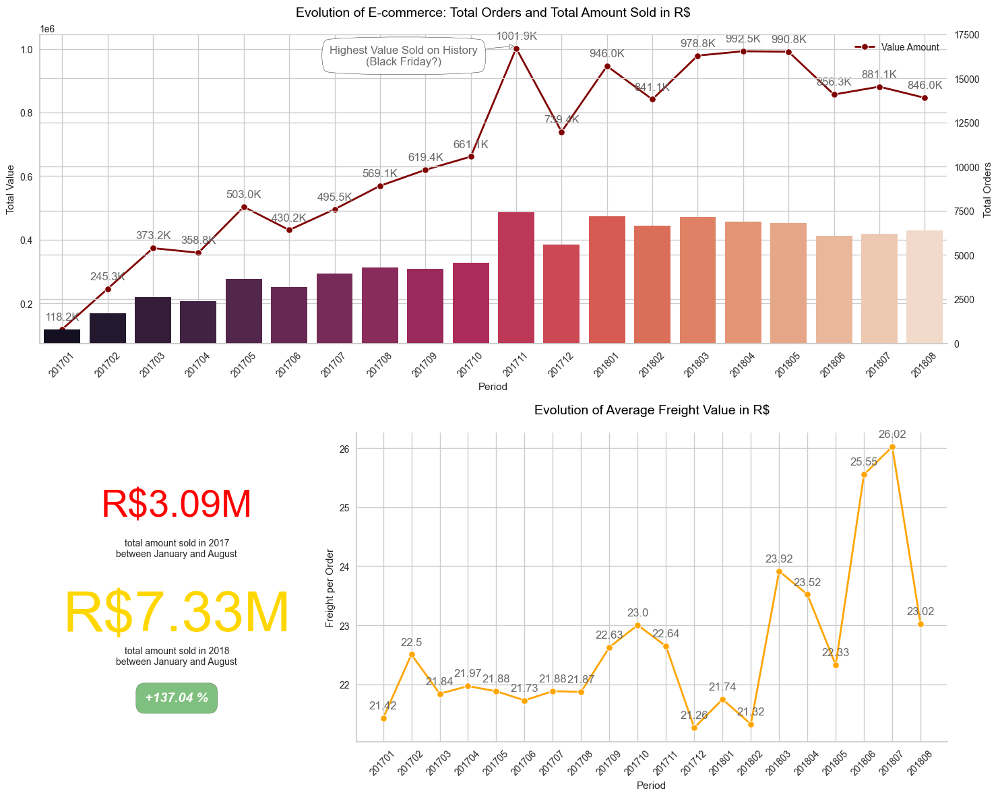

In [63]:
# Creating figure
fig = plt.figure(constrained_layout=True, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0,:])
ax2 = fig.add_subplot(gs[1,0])
ax3 = fig.add_subplot(gs[1,1:])

# Plot 1 - Evolution of total orders and total sales on e-commerce
sns.lineplot(
    data=df_month_aggreg,
    x='order_purchase_year_month',
    y='price',
    ax=ax1,
    linewidth=2,
    color='maroon',
    marker='o',
    label='Value Amount'
)

ax1.set_xlabel('Period')
ax1.set_ylabel('Total Value')
ax1_twx = ax1.twinx()
sns.barplot(
    order_count_month,
    x=order_count_month.index,
    y=order_count_month['order_id'],
    ax=ax1_twx,
    palette='rocket'
)

ax1_twx.set_ylabel('Total Orders')
ax1_twx.set_yticks(np.arange(0, 20000, 2500))
format_spines(ax1,right_border=False)
format_spines(ax1_twx,right_border=False)

# Customizing the first plot
for tick in ax1.get_xticklabels():
    tick.set_rotation(45)

for x, y in df_month_aggreg.price.items():
    ax1.annotate(
        str(round(y/1000,1))+'K',
        xy=(x,y),
        xytext=(0,10),
        textcoords='offset points',
        ha='center',
        color='dimgrey'
    )

ax1.annotate(
    f'Highest Value Sold on History\n(Black Friday?)',
    xy=(10,1009000),
    xytext=(-120,-20),
    textcoords='offset points',
    bbox=dict(boxstyle="round4",fc="w",pad=.8),
    arrowprops=dict(arrowstyle='-|>',fc='w'),
    color='dimgrey',
    ha='center'
)

ax1.set_title(
    'Evolution of E-commerce: Total Orders and Total Amount Sold in R$',
    size=14,
    color='black',
    pad=20
)

# Plot 2 - Big Numbers of Sales Evolution
month_comparison = sorted(df_orders_compare['order_purchase_year_month'].unique())
df_sales_compare = df_month_aggreg.query('order_purchase_year_month in (@month_comparison)')
sold_2017 = df_sales_compare.query('order_purchase_year == 2017')['price'].sum()
sold_2018 = df_sales_compare.query('order_purchase_year == 2018')['price'].sum()
growth = (sold_2018-sold_2017)/sold_2017
ax2.axis('off')
ax2.text(
    x=0.50,
    y=0.73,
    s='R$' + str(round(sold_2017/1000000, 2)) + 'M',
    fontsize=40,
    color='red',
    ha='center'
)

ax2.text(
    x=0.50,
    y=0.60,
    s='total amount sold in 2017\nbetween January and August',
    fontsize=10,
    ha='center'
)

ax2.text(
    x=0.50,
    y=0.36,
    s='R$' + str(round(sold_2018/1000000, 2)) + 'M',
    fontsize=60,
    color='gold',
    ha='center'
)

ax2.text(
    x=0.50,
    y=0.25,
    s='total amount sold in 2018\nbetween January and August',
    fontsize=10,
    ha='center'
)

signal = '+' if growth > 0 else '-'
ax2.text(
    x=0.50,
    y=0.13,
    s=f'{signal}{str(round(100 * growth, 2))} %',
    fontsize=14,
    ha='center',
    color='white',
    style='italic',
    weight='bold',
    bbox=dict(
        facecolor='green',
        alpha=0.5,
        pad=10,
        boxstyle='round, pad=.7'
    )
)

# Plot 3 - Evolution of mean freight value paid by the customers
sns.lineplot(
    data=df_month_aggreg,
    x='order_purchase_year_month',
    y='freight_per_order',
    linewidth=2,
    color='orange',
    marker='o',
    ax=ax3
)

format_spines(ax3, right_border=False)

for tick in ax3.get_xticklabels():
    tick.set_rotation(45)

for x, y in df_month_aggreg.freight_per_order.items():
    ax3.annotate(
        round(y, 2),
        xy=(x, y),
        textcoords='offset points',
        xytext=(0, 10),
        ha='center',
        color='dimgrey'
    )

ax3.set_xlabel('Period')
ax3.set_ylabel('Freight per Order')
ax3.set_title(
    'Evolution of Average Freight Value in R$',
    size=14,
    color='black',
    pad=20
)

plt.tight_layout()
plt.show()

Insights:
- Highest value sold in history is on November 2017. It's possible that this can be happen when the blackfriday event is held, where each store probably gives a massive discount that only happens for 1 day. The value is 1001.9K just for 1 month.
- The total amount between January and August in 2017 to January and August in 2018 is also increased 137.04%. Where Evolution of Average Freight Value tend to be stable from January 2017 to May 2018. A sharp increase occurred in the July 2018. This might be happened because many new customer come to use Olist as their daily e-commerce to do shopping.

> **Demographic Transactions**

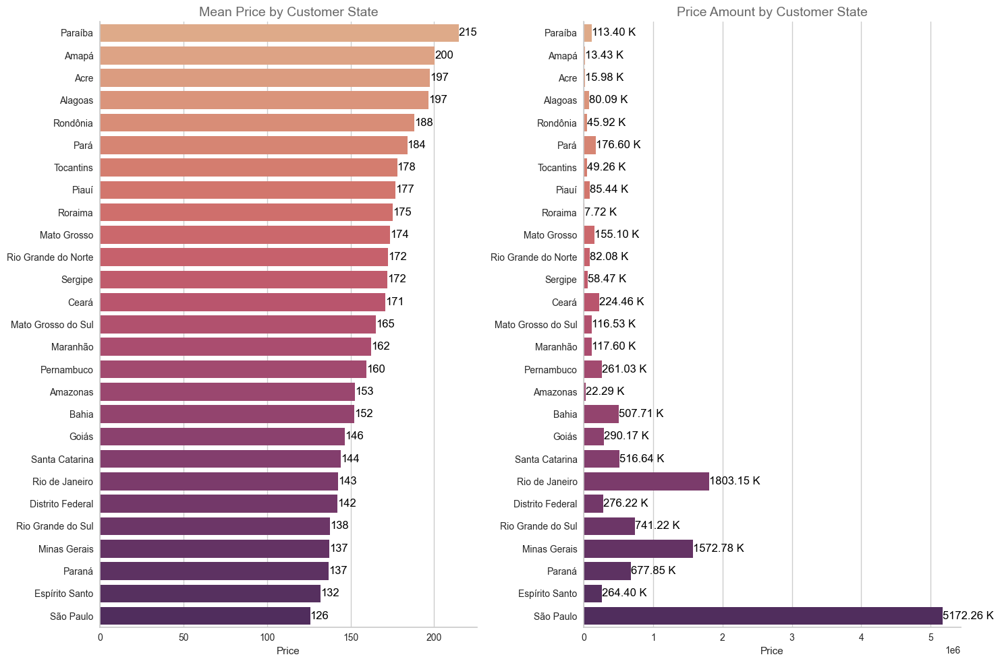

In [64]:
#Display Mean and Amount Price by Customer State
mean_sum_analysis(
    eda_df,
    group_col='customer_state',
    value_col='price',
    palette='flare',
    figsize=(15, 10),
)

Insights:
- Based on 2 plot above, it can be seen that the biggest mean price by customer state is Paraiba with R$215, but the amount price tend to be low with just R$113.40K. Inversely proportional to Sao Paulo where the mean price is lowest, but had the biggest amount price comparing to another states with R$5172.26K. This indicates that the most buying and selling online transaction activities occur in this state.

> **Delivery Performance**

In [65]:
#Make Order Data Dataframe
order_date_df = order_history.groupby('order_id')[
    'order_id',
    'order_purchase_timestamp',
    'order_delivered_customer_date',
    'order_estimated_delivery_date',
    'customer_state'
].head(1)

order_date_df['freight_value'] = order_date_df[['order_id']].apply(freight_sum,axis=1)
order_date_df.drop(
    index=order_date_df[order_date_df['order_delivered_customer_date'].isnull()].index,
    inplace=True
)

# Calculating working days between purchasing, delivering and estimated delivery
purchasing = order_date_df['order_purchase_timestamp']
delivered = order_date_df['order_delivered_customer_date']
estimated = order_date_df['order_estimated_delivery_date']
order_date_df['time_to_delivery'] = calc_working_days(purchasing, delivered, convert=True)
order_date_df['diff_estimated_delivery'] = calc_working_days(estimated, delivered, convert=True)

# Grouping data by state
states_avg_grouped = order_date_df.groupby(
    'customer_state',
    as_index=False
).mean()

states_freight_paid = states_avg_grouped.loc[:,['customer_state','freight_value']]
states_time_to_delivery = states_avg_grouped.loc[:,['customer_state','time_to_delivery']]
states_estimated_delivery = states_avg_grouped.loc[:,['customer_state','diff_estimated_delivery']]

# Sorting data
states_freight_paid = states_freight_paid.sort_values('freight_value',ascending=False)
states_time_to_delivery = states_time_to_delivery.sort_values('time_to_delivery',ascending=False)
states_estimated_delivery = states_estimated_delivery.sort_values('diff_estimated_delivery')

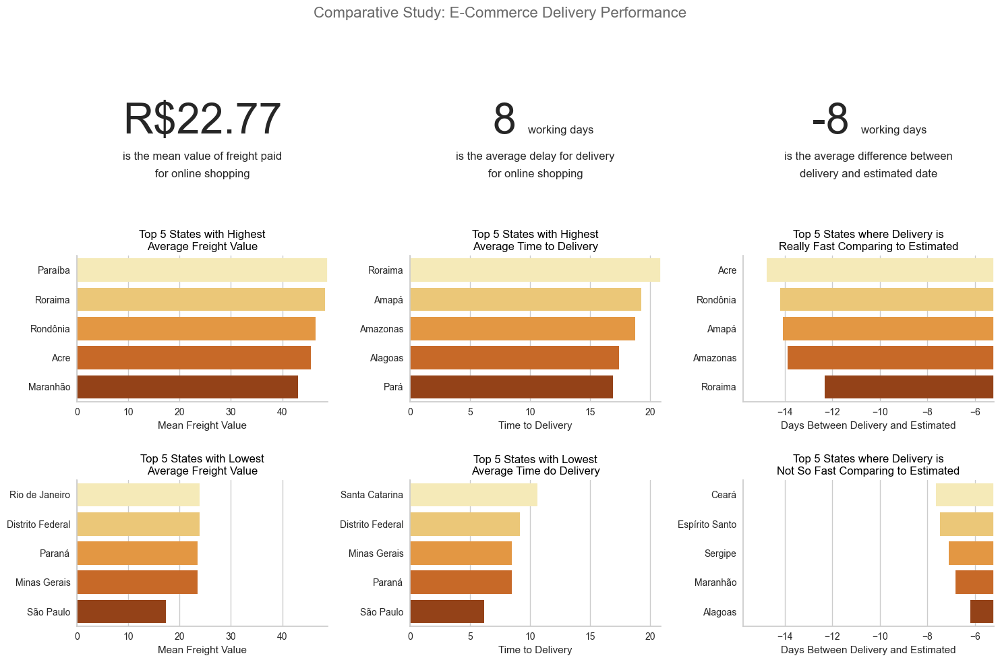

In [66]:
#Display E-Commerce Delivery Performance
fig, axs = plt.subplots(3, 3, figsize=(15, 10))

# Plot Pack 01 - Freight value paid on states
sns.barplot(
    data=states_freight_paid.head(),
    x='freight_value',
    y='customer_state',
    ax=axs[1,0],
    palette='YlOrBr'
)

axs[1,0].set_title(
    'Top 5 States with Highest\nAverage Freight Value',
    size=12,
    color='black'
)

sns.barplot(
    data=states_freight_paid.tail(),
    x='freight_value',
    y='customer_state',
    ax=axs[2,0],
    palette='YlOrBr'
)

axs[2,0].set_title(
    '\nTop 5 States with Lowest\nAverage Freight Value',
    size=12,
    color='black'
)

for ax in axs[1,0], axs[2,0]:
    ax.set_xlabel('Mean Freight Value')
    ax.set_xlim(0, states_freight_paid['freight_value'].max())
    format_spines(ax, right_border=False)
    ax.set_ylabel('')

# Annotations
axs[0,0].text(
    x=0.50,
    y=0.30,
    s=f'R${round(order_date_df.freight_value.mean(), 2)}',
    fontsize=45,
    ha='center'
)

axs[0,0].text(
    x=0.50,
    y=0.12,
    s='is the mean value of freight paid',
    fontsize=12,
    ha='center'
)

axs[0,0].text(
    x=0.50, y=0.00,
    s='for online shopping',
    fontsize=12,
    ha='center'
)

axs[0,0].axis('off')

# Plot Pack 02 - Time to delivery on states
sns.barplot(
    data=states_time_to_delivery.head(),
    x='time_to_delivery',
    y='customer_state',
    ax=axs[1,1],
    palette='YlOrBr'
)

axs[1,1].set_title(
    'Top 5 States with Highest\nAverage Time to Delivery',
    size=12,
    color='black'
)

sns.barplot(
    data=states_time_to_delivery.tail(),
    x='time_to_delivery',
    y='customer_state',
    ax=axs[2,1],
    palette='YlOrBr'
)

axs[2,1].set_title(
    '\nTop 5 States with Lowest\nAverage Time do Delivery',
    size=12,
    color='black'
)

for ax in axs[1,1], axs[2,1]:
    ax.set_xlabel('Time to Delivery')
    ax.set_xlim(0, states_time_to_delivery['time_to_delivery'].max())
    format_spines(ax, right_border=False)
    ax.set_ylabel('')

# Annotations
axs[0,1].text(
    x=0.375,
    y=0.30,
    s=f'{int(order_date_df.time_to_delivery.mean())}',
    fontsize=45,
    ha='center'
)

axs[0,1].text(
    x=0.60,
    y=0.30,
    s='working days',
    fontsize=12,
    ha='center'
)

axs[0,1].text(
    x=0.50,
    y=0.12,
    s='is the average delay for delivery',
    fontsize=12,
    ha='center'
)

axs[0,1].text(
    x=0.50,
    y=0.00,
    s='for online shopping',
    fontsize=12,
    ha='center'
)

axs[0,1].axis('off')

# Plot Pack 03 - Differnece between delivered and estimated on states
sns.barplot(
    data=states_estimated_delivery.head(),
    x='diff_estimated_delivery',
    y='customer_state',
    ax=axs[1,2],
    palette='YlOrBr'
)

axs[1,2].set_title(
    'Top 5 States where Delivery is\nReally Fast Comparing to Estimated',
    size=12,
    color='black'
)

sns.barplot(
    data=states_estimated_delivery.tail(),
    x='diff_estimated_delivery',
    y='customer_state',
    ax=axs[2,2],
    palette='YlOrBr'
)
axs[2,2].set_title(
    '\nTop 5 States where Delivery is\nNot So Fast Comparing to Estimated',
    size=12,
    color='black'
)

for ax in axs[1,2], axs[2,2]:
    ax.set_xlabel('Days Between Delivery and Estimated')
    ax.set_xlim(states_estimated_delivery['diff_estimated_delivery'].min()-1,
                states_estimated_delivery['diff_estimated_delivery'].max()+1)
    format_spines(ax, right_border=False)
    ax.set_ylabel('')

# Annotations
axs[0,2].text(
    x=0.35,
    y=0.30,
    s=f'{int(order_date_df.diff_estimated_delivery.mean())}',
    fontsize=45,
    ha='center'
)

axs[0,2].text(
    x=0.60,
    y=0.30,
    s='working days',
    fontsize=12,
    ha='center'
)

axs[0,2].text(
    x=0.50,
    y=0.12,
    s='is the average difference between',
    fontsize=12,
    ha='center'
)

axs[0,2].text(
    x=0.50,
    y=0.00,
    s='delivery and estimated date',
    fontsize=12,
    ha='center'
)

axs[0,2].axis('off')

plt.suptitle(
    'Comparative Study: E-Commerce Delivery Performance',
    size=16,
    color='dimgrey'
)
plt.tight_layout()
plt.show()

Insights:
- The mean value of freight paid is R$22.77. But, there are still many states that must paid more for freight value above R$40. The top 5 are Paraiba, Roraima, Rondonia, Acre, and Maranhao.
- Even Roraima State is also in top 2 of 5 states with highest average time to delivery. This needs to be discussed further between the Olist team, so the freight value can be adjusted and each customer gets the best delivery service at the right price.

> **Customer Payments Analysis**

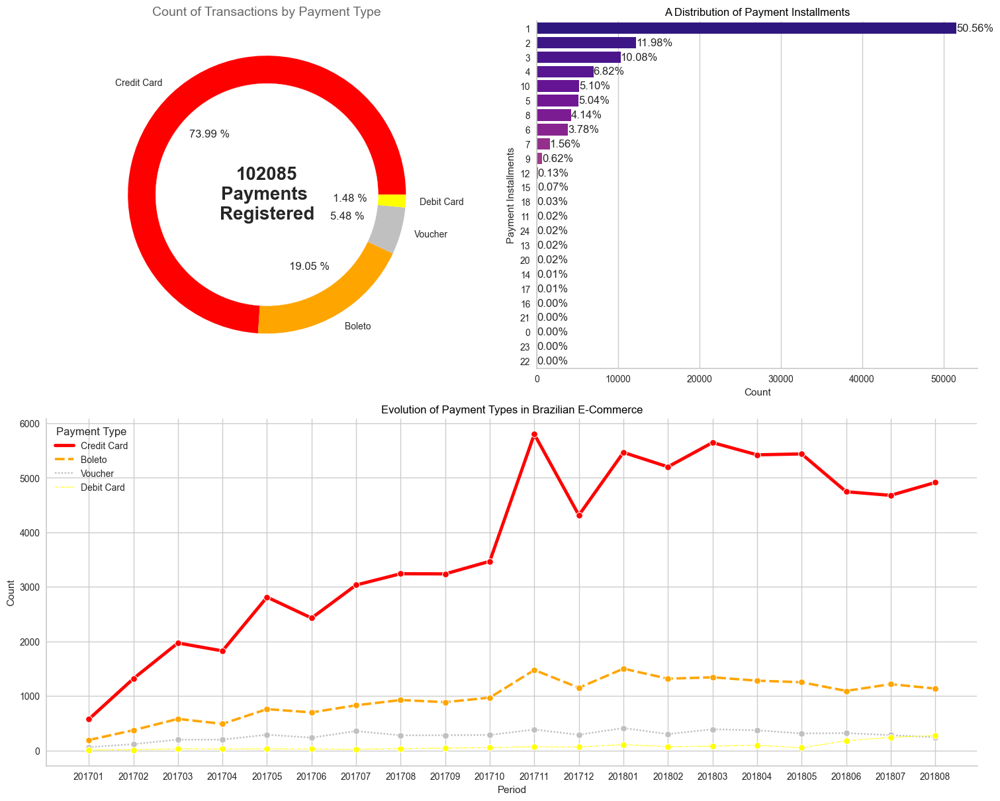

In [67]:
# Grouping data
def edit_payment_type(cols):
    return ' '.join(cols.split('_')).title()

df_orders_pay = eda_df.merge(customer_payments, how='left', on='order_id')
df_orders_pay['payment_type'] = df_orders_pay['payment_type'].apply(edit_payment_type)
df_orders_pay['payment_installments'] = df_orders_pay['payment_installments'].astype(int)
df_orders_pay.rename(columns={'payment_type':'Payment Type'}, inplace=True)

# Creating figure
fig = plt.figure(constrained_layout=True, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

# Plot 1 - Payment types in a donut chart
colors = ['red', 'orange', 'silver', 'yellow', 'grey']
label_names = df_orders_pay['Payment Type'].value_counts().index
donut_plot(
    df_orders_pay,
    col='Payment Type',
    ax=ax1,
    label_names=label_names,
    colors=colors,
    title='Count of Transactions by Payment Type',
    text=f'{len(df_orders_pay)}\nPayments \nRegistered'
)

# Plot 2 - Payment installments
single_countplot(
    df_orders_pay,
    y='payment_installments',
    ax=ax2
)

ax2.set_xlabel('Count'), ax2.set_ylabel('Payment Installments')
ax2.set_title(
    'A Distribution of Payment Installments',
    color='black',
    size=12
)

# Plot 3 - Evolution of payment types
payment_evl = df_orders_pay.groupby(
    ['order_purchase_year_month','Payment Type'],
    as_index=False
).count()

payment_evl = payment_evl.loc[:,['order_purchase_year_month','Payment Type','order_id']]
payment_evl = payment_evl.sort_values(
    ['order_purchase_year_month','order_id'],
    ascending=[True, False]
)

sns.lineplot(
    data=payment_evl,
    x='order_purchase_year_month',
    y='order_id',
    ax=ax3, hue='Payment Type',
    style='Payment Type',
    size='Payment Type',
    palette=colors,
    marker='o'
)

format_spines(ax3, right_border=False)
ax3.set_xlabel('Period'), ax3.set_ylabel('Count')
ax3.set_title(
    'Evolution of Payment Types in Brazilian E-Commerce',
    size=12,
    color='black'
)

plt.show()

Insights:
- Based on 3 plot above, it can be seen that credit card is the most preferred payment choice by customers with 73.99% from total. The evolution of payment types with credit card is also increasing rapidly from January 2017 to May 2018. Many customers also preffered to take 1 month payment installments. This indicates that payment with a credit card, customers do not need to immediately pay in full for the products they buy. They can pay it with installments they preffered and can be paid at the end of the periods.
- The most payment installments that customer preffered is 1. It indicates that many customers buy products that are not too expensive and are still able to be paid at the end of the first month.

> ### **Customer Segmentation**

> **Aggregate Payment Value in Order Payments**

In [68]:
#Aggregating Payment Value from Order Payments
print('\n'+(' Order Payments DataFrame ').center(151,'-'))
display(order_payments.head())
print('\n'+(' Group By Order_ID as : aggregated_df').center(151,'-'))
aggregated_df = order_payments.groupby('order_id')['payment_value'].sum().reset_index()
display(aggregated_df.head())


--------------------------------------------------------------- Order Payments DataFrame --------------------------------------------------------------


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45



--------------------------------------------------------- Group By Order_ID as : aggregated_df---------------------------------------------------------


,order_id,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,72.19
1,00018f77f2f0320c557190d7a144bdd3,259.83
2,000229ec398224ef6ca0657da4fc703e,216.87
3,00024acbcdf0a6daa1e931b038114c75,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,218.04


> **Join Customer to Orders**

After getting the total payment value, then:

In [69]:
#Merge Orders and Customers Dataframe on customer_id
print('\n'+(' Orders DataFrame ').center(151,'-'))
display(orders.head())
print('\n'+(' Customers DataFrame ').center(151,'-'))
display(customer.head())
print('\n'+(' Left Join on order_id as : rfm_table ').center(151,'-'))
rfm_table = pd.merge(orders, customer,on='customer_id',how='left')
display(rfm_table.head())


------------------------------------------------------------------- Orders DataFrame ------------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00



----------------------------------------------------------------- Customers DataFrame -----------------------------------------------------------------


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP



--------------------------------------------------------- Left Join on order_id as : rfm_table --------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


> **Join aggregated_df to rfm_table**

In [70]:
#Merge rfm_table and aggregated_df to rfm_table Dataframe on order_id
print('\n'+(' rfm_table ').center(151,'-'))
display(rfm_table.head())
print('\n'+(' aggregated_df ').center(151,'-'))
display(aggregated_df.head())
print('\n'+(' Join as : rfm_table ').center(151,'-'))
rfm_table = pd.merge(rfm_table, aggregated_df,on='order_id',how='left')
display(rfm_table.head())


---------------------------------------------------------------------- rfm_table ----------------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP



-------------------------------------------------------------------- aggregated_df --------------------------------------------------------------------


,order_id,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,72.19
1,00018f77f2f0320c557190d7a144bdd3,259.83
2,000229ec398224ef6ca0657da4fc703e,216.87
3,00024acbcdf0a6daa1e931b038114c75,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,218.04



----------------------------------------------------------------- Join as : rfm_table -----------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,179.12
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,72.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,28.62


> **RFM Analysis** <br>

RFM analysis is a data driven customer behavior segmentation technique. RFM stands for recency, frequency, and monetary value. The idea is to segment customers based on when their last purchase was, how often they’ve purchased in the past, and how much they’ve spent overall. All three of these measures have proven to be effective predictors of a customer's willingness to engage in marketing messages and offers.


Important column for RFM analysis:
1. **R**ecency - `order_purchase_timestamp`
2. **F**requency - `customer_unique_id`
3. **M**ontetary - `payment_value`

In [71]:
#Display Important Column for RFM Analysis from rfm_table
print('\n'+(' Importances ').center(151,'-'))
rfm_table = rfm_table[['order_purchase_timestamp','customer_unique_id','payment_value']]
display(rfm_table.head())


--------------------------------------------------------------------- Importances ---------------------------------------------------------------------


,order_purchase_timestamp,customer_unique_id,payment_value
0,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,38.71
1,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46
2,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12
3,2017-11-18 19:28:06,7c142cf63193a1473d2e66489a9ae977,72.20
4,2018-02-13 21:18:39,72632f0f9dd73dfee390c9b22eb56dd6,28.62


In [72]:
#Change order_purchase_timestamp format data to datetime
rfm_table['order_purchase_timestamp'] = pd.to_datetime(rfm_table['order_purchase_timestamp'])

#Make final_rfm_table
final_rfm_table = rfm_table.groupby('customer_unique_id').agg({
    'order_purchase_timestamp': 'max', #Get a max value from order_purchase_timestamp for Recency
    'payment_value': 'sum', #Sum up the payment value total per customer for Monetary
    'customer_unique_id': 'count' #Count of the total distinct of customer for Frequency
}).rename(columns={'customer_unique_id': 'frequency','payment_value':'monetary'}).reset_index()

# Aggregate the recency value to be an integer instead of a datetime
final_rfm_table['recency'] = (rfm_table['order_purchase_timestamp'].max() - final_rfm_table['order_purchase_timestamp']).dt.days
final_rfm_table.drop('order_purchase_timestamp', axis=1, inplace=True)
print('\n'+(' Final RFM Table ').center(151,'-'))
display(final_rfm_table.head())


------------------------------------------------------------------- Final RFM Table -------------------------------------------------------------------


,customer_unique_id,monetary,frequency,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,160
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,163
2,0000f46a3911fa3c0805444483337064,86.22,1,585
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,1,369
4,0004aac84e0df4da2b147fca70cf8255,196.89,1,336


> **RFM Descriptive Statistics**


================================================================ Descriptive Statistics ===============================================================


,count,mean,std,min,25%,50%,75%,max
monetary,96096.0,166.592492,231.428332,0.0,63.12,108.0,183.53,13664.08
frequency,96096.0,1.034809,0.214384,1.0,1.00,1.0,1.00,17.00
recency,96096.0,287.735691,153.414676,0.0,163.00,268.0,397.00,772.00



==================================================================== Normality Test ===================================================================


,Statistic,P-Value,Normally Distributed
monetary,0.258960,< 0.05,False
frequency,0.533529,< 0.05,False
recency,0.059898,< 0.05,False



=============================================================== Distribution & Outliers ===============================================================


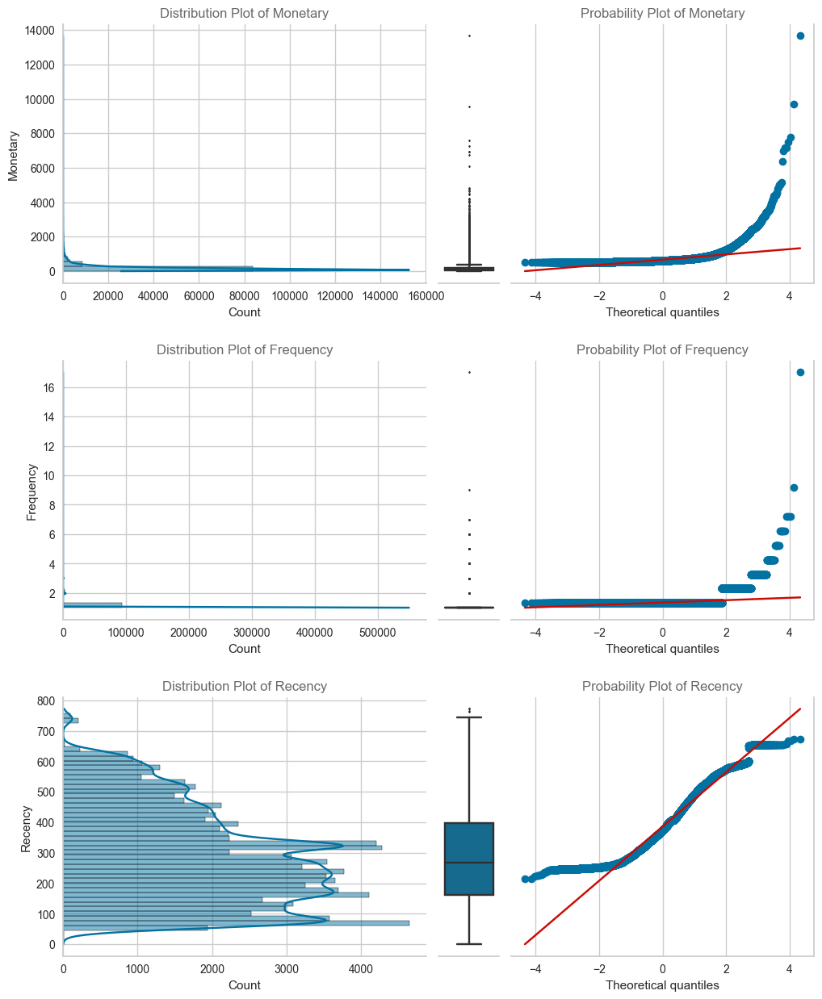

In [73]:
#Display Descriptive Statistics, Normality Test, Distribution & Outliers Plot from final_rfm_table
print('\n'+(' Descriptive Statistics ').center(151,'='))
display(final_rfm_table.describe().T)

print('\n'+' Normality Test '.center(151,'='))
cols, stats_val, p_val, result = [], [], [], []

for i in final_rfm_table.describe().columns:
    stat, pvalue = stats.kstest(
        final_rfm_table[i],
        np.random.normal(
            final_rfm_table[i].mean(),
            final_rfm_table[i].std(),
            size=len(final_rfm_table[i])
        )
    )

    cols.append(i)
    stats_val.append(stat)
    p_val.append('> 0.05' if pvalue > 0.05 else '< 0.05')
    result.append(True if pvalue > 0.05 else False)

display(pd.DataFrame(
    data={
        'Statistic':stats_val,
        'P-Value':p_val,
        'Normally Distributed':result
    },
    index=cols
))

print('\n'+(' Distribution & Outliers ').center(151,'='))
fig, axes = plt.subplots(
    nrows=3,
    ncols=3,
    figsize=(12, 15),
    gridspec_kw={
        'width_ratios':[6,1,5],
        'wspace':.05,
        'hspace':.3
    }
)

for i, col in enumerate(final_rfm_table.columns[-3:]):

    #Distribution plot
    sns.histplot(
        data=final_rfm_table,
        y=col,
        bins=50,
        kde=True,
        ax=axes[i,0]
    )

    axes[i,0].set_xlabel('Count')
    axes[i,0].set_ylabel(col.title())
    axes[i,0].set_title(
        'Distribution Plot of {}'.format(col.title()),
        color='dimgrey'
    )

    for n, loc in enumerate(['top','right','left','bottom']):
        axes[i,0].spines[loc].set_visible(False if n < 2 else True)
        axes[i,0].spines[loc].set_color('#CCCCCC')

    #Box plot
    sns.boxplot(
        final_rfm_table[col],
        fliersize=1,
        ax=axes[i,1]
    )

    axes[i,1].set_xlabel('Boxplot')
    axes[i,1].set_ylabel('')
    axes[i,1].xaxis.set_visible(False)
    axes[i,1].yaxis.set_visible(False)

    for n, loc in enumerate(['top','left','right','bottom']):
        axes[i,1].spines[loc].set_visible(False if n < 3 else True)
        axes[i,1].spines[loc].set_color('#CCCCCC')

    probplot(
        x=final_rfm_table[col],
        plot=axes[i,2]
    )

    axes[i,2].yaxis.set_visible(False)
    axes[i,2].set_title(
        'Probability Plot of {}'.format(col.title()),
        color='dimgrey'
    )

    for n, loc in enumerate(['top','left','bottom','right']):
        axes[i,2].spines[loc].set_visible(False if n < 2 else True)
        axes[i,2].spines[loc].set_color('#CCCCCC')

plt.tight_layout()
plt.show()

Insights:
- From 3 plots above, it can be seen that Recency, Frequency, and Monetary value are not normally distributed. Especially for Frequency, where the minimum value, the quarter, the half, and the three quarters is 1, but the maximum value is 17.

> **RFM Intra-Relationship**

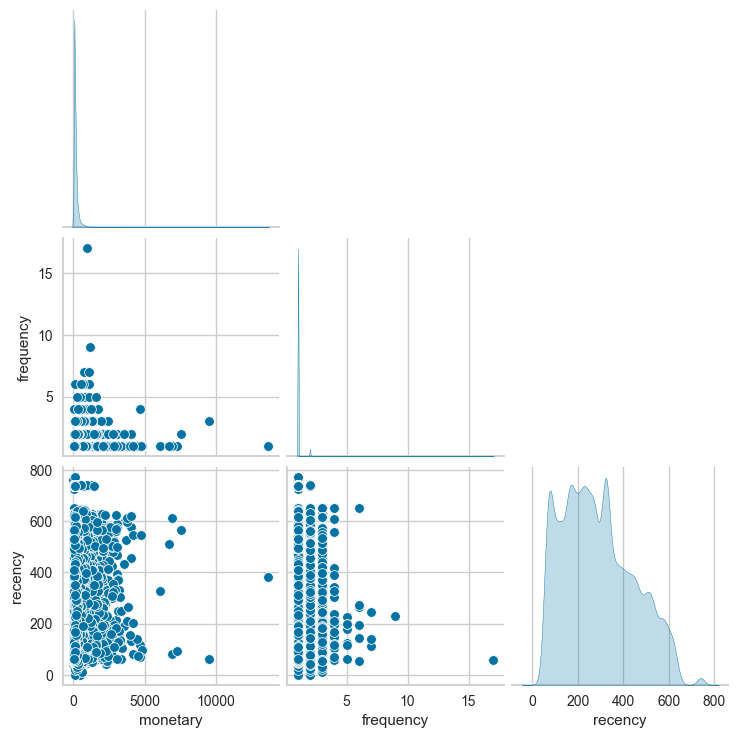

In [74]:
#Display Internal Relationship Plot from final_rfm_table
sns.pairplot(
    data=final_rfm_table,
    diag_kind='kde',
    corner=True
)

Based on the intra-relationship, it shows that monetary and recency relation varies, while the relationship with frequency shows more centered in the lower value. Recency and Frequency relationship needs to be highlighted too, with their relationship shows vary on recency but very right-skewed on the frequency, meaning frequency have tendency of lower value with so little of high value.

> **RFM Score Analysis**

In [75]:
#Labeling and Segmenting Olist Customer with RFM Score
rfm_score = final_rfm_table.copy()
rfm_score['recency_score']  = pd.qcut(
    rfm_score['recency'],
    q=4,
    labels=[1, 2, 3, 4]
)

rfm_score['frequency_score']= final_rfm_table['frequency'].apply(lambda x: '1' if x == 1 else '2')
rfm_score['monetary_score'] = pd.qcut(
    rfm_score['monetary'],
    q=4,
    labels=[1, 2, 3, 4]
)

print('\n' + (' Label & Segmenting ').center(151, '=') + '\n')
display(rfm_score.head())
print('\n' + (' Segmenting Dictionary ').center(151, '=') + '\n')


================================================================== Label & Segmenting =================================================================



,customer_unique_id,monetary,frequency,recency,recency_score,frequency_score,monetary_score
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,160,1,1,3
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,163,1,1,1
2,0000f46a3911fa3c0805444483337064,86.22,1,585,4,1,2
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,1,369,3,1,1
4,0004aac84e0df4da2b147fca70cf8255,196.89,1,336,3,1,4



================================================================ Segmenting Dictionary ================================================================



Segment   | Score              | Definition
-----------|--------------------|--------------
GOLD       | 424, 324, 414, 214, 314, 224, 124, 114 | Customer with the most spending
FRESHER    | 113, 112, 111 | Recently joined
LOYAL      | 323, 423, 223, 421, 422, 321, 322 | Builds trust (buy more & spend more)
AVERAGE    | 213, 211, 212, 222, 221, 121, 123, 122 | Average customer
GONERS     | 413, 412, 311, 313, 411, 312 | One time buyer, gone by now

The table above are the analysis based of domain knowledge, where we seperate segments of customer with certain parts of the RFM analysis. It can be

In [76]:
#Make Our Own Definition of Segmentation
def segment(x):
    if x in ['424', '324', '414', '214', '314', '224', '124', '114']:
        return 'GOLD'
    elif x in ['113', '112', '111']:
        return 'FRESHER'
    elif x in ['323', '423', '223', '421', '422', '321', '322']:
        return 'LOYAL'
    elif x in ['213', '211', '212', '222', '221', '121', '123', '122']:
        return 'AVERAGE'
    elif x in ['413', '412', '311', '313', '411', '312']:
        return 'GONERS'

rfm_score['score'] = rfm_score[['recency_score','frequency_score','monetary_score']].apply(lambda x: str(x[0])+str(x[1])+str(x[2]),axis=1)
rfm_score['segments'] = rfm_score['score'].apply(segment)
rfm_score.head()

,customer_unique_id,monetary,frequency,recency,recency_score,frequency_score,monetary_score,score,segments
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,160,1,1,3,113,FRESHER
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,163,1,1,1,111,FRESHER
2,0000f46a3911fa3c0805444483337064,86.22,1,585,4,1,2,412,GONERS
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,1,369,3,1,1,311,GONERS
4,0004aac84e0df4da2b147fca70cf8255,196.89,1,336,3,1,4,314,GOLD


In [77]:
#Display a Descriptive Statistics From rfm_score result and Group by Segment
rfm_score_descriptive = rfm_score.groupby('segments').describe()
rfm_score_descriptive = rfm_score_descriptive[rfm_score_descriptive.columns[np.r_[3:8,11:16,19:24]]]
rfm_score_descriptive['count'] = rfm_score.groupby('segments')['segments'].value_counts().values
rfm_score_descriptive[('ratio','(%)')] = rfm_score_descriptive['count'].apply(lambda x: round(x/rfm_score_descriptive['count'].sum()*100,2))
rfm_score_descriptive.apply(lambda row: row.map('{:.2f}'.format),axis=1)

monetary                                   frequency              \
              min     25%     50%     75%       max       min   25%   50%   
segments                                                                    
AVERAGE     13.36   53.31   83.41  124.31    183.53      1.00  1.00  1.00   
FRESHER      0.00   52.94   83.79  123.22    183.53      1.00  1.00  1.00   
GOLD       183.54  217.54  279.15  415.94  13664.08      1.00  1.00  1.00   
GONERS       0.00   53.71   81.11  119.50    183.53      1.00  1.00  1.00   
LOYAL       36.74  108.34  132.12  157.31    183.00      2.00  2.00  2.00   

                      recency                                     count  ratio  
           75%    max     min     25%     50%     75%     max              (%)  
segments                                                                        
AVERAGE   1.00   3.00   16.00  188.00  216.00  241.00  268.00  18062.00  18.80  
FRESHER   1.00   1.00    0.00   75.00  105.00  134.00  163.00  17612.00  18.33  
GOLD      1.00  17.00    0.00  162.00  265.00  394.00  743.00  24021.00  25.00  
GONERS    1.00   1.00  269.00  325.00  397.00  495.00  772.00  35670.00  37.12  
LOYAL     2.00   6.00  164.00  259.50  339.00  449.00  740.00    731.00   0.76

Text(0.5, 0.98, 'Grid of Customer Segments')

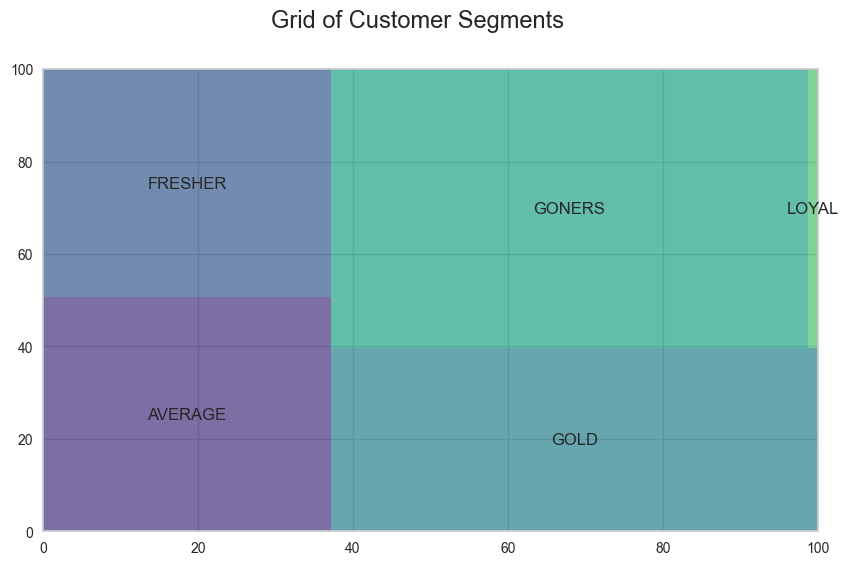

In [78]:
#Display a Grid of Customer Segments
plt.figure(figsize=(10, 6))
squarify.plot(
    sizes=rfm_score_descriptive['count'],
    label=rfm_score_descriptive['count'].index,
    color=sns.color_palette(palette='viridis'),
    alpha=0.7
)

plt.suptitle(
    'Grid of Customer Segments', fontsize=17
)

Insights:
- From Grid of Customer Segements above, it can be seen that Loyal Customer is the smallest segment compared to other segments, while the largest segment is Gold and Goners Customers. The Olist must plan a strategy on how to maintain Gold Customers and how to make Goners Customers to return and do shopping again at Olist.
- Meanwhile, for Fresher Customers, Olist must plan something like provide attractive promos for them so they still remain using Olist's services and can become Gold Customers.

## Modelling for Cluster
After entering RFM analysis we continue to the first modelling step we use, which is clustering

> **Cluster Labeling Using K-Means**
Now based on the previous analysis on the RFM table, Recency and Monetary may produce a better cluster since they have various values. while frequency was heavily on a single value, Including the Frequency may alter the clustering result, hence we remove frequency in the cluster and move on with Monetary and Recency

Firstly we will do binning and scalling on the data

In [79]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import KBinsDiscretizer, RobustScaler

skewed_preprocess = Pipeline([
    ('binning',KBinsDiscretizer(n_bins=30,encode='ordinal')),
    ('scaling',RobustScaler(quantile_range=(0,100)))
])

transform = ColumnTransformer([
    ('skewed',skewed_preprocess,['recency','monetary']),
],remainder='passthrough')

transform_val = transform.fit_transform(final_rfm_table.drop(['customer_unique_id','frequency'],axis=1))

transformed_rfm = pd.DataFrame(data={
    'recency':transform_val[:,0],
    'monetary':transform_val[:,1]
})

transformed_rfm = transformed_rfm.astype(float)

We will check to decide the best optimal cluster with Elbow and Silhouette

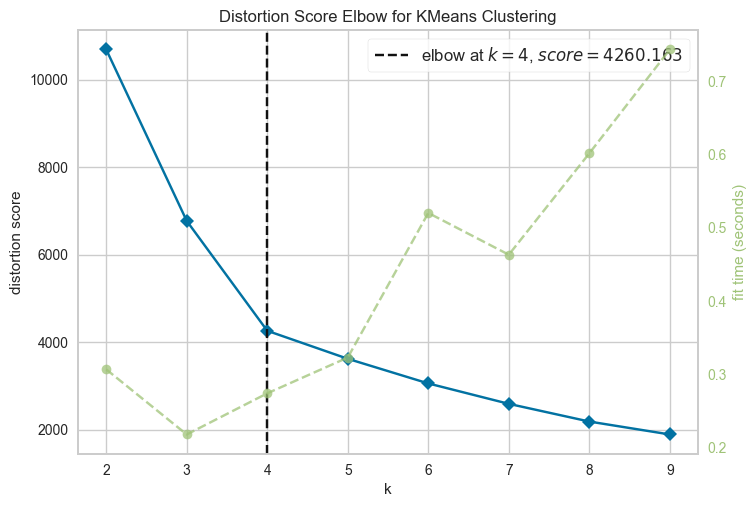

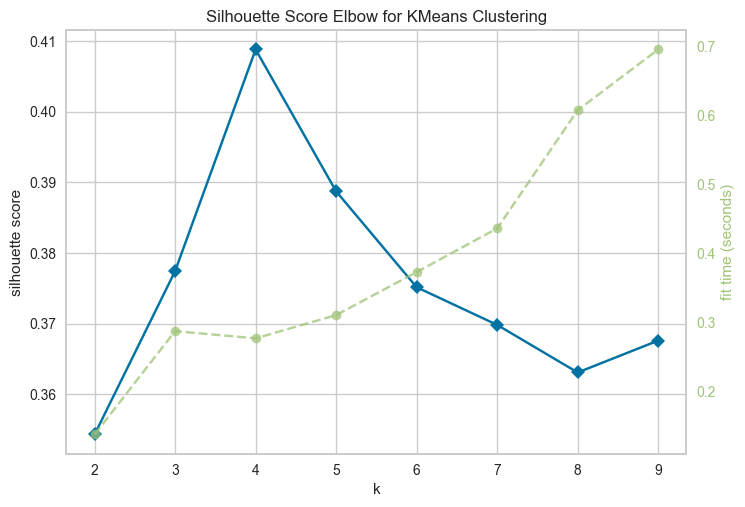

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [80]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score

elbow = KElbowVisualizer(
    KMeans(random_state=1995),
    k=(2,10)
)

elbow.fit(transformed_rfm)
elbow.show()

elbow = KElbowVisualizer(
    KMeans(random_state=1995),
    k=(2,10),
    metric='silhouette',
    locate_elbow=False
)

elbow.fit(transformed_rfm)
elbow.show()

Insights:
- Based on Distortion Score for KMEans Clustering, the results obtained elbow at k = 4 with score = 4260.163. This indicates that the optimal or the best number of clusters for this analysis is 4.
- Based on Silhouette Score for KMEans Clustering, it can be seen that the optimal silhouette score is 0.41 while k = 4. Silhouette Score ranges is from -1 to 1. A larger positive value indicates that the data points are well placed within their cluster and are closer to their cluster than to other clusters.

In [81]:
cluster = KMeans(n_clusters=4,random_state=1995)
cluster.fit(transformed_rfm)
transformed_rfm['cluster'] = cluster.labels_
final_rfm_table['segments'] = rfm_score['segments']
final_rfm_table['cluster'] = cluster.labels_
final_rfm_table.head()

,customer_unique_id,monetary,frequency,recency,segments,cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,160,FRESHER,2
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,163,FRESHER,3
2,0000f46a3911fa3c0805444483337064,86.22,1,585,GONERS,1
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,1,369,GONERS,1
4,0004aac84e0df4da2b147fca70cf8255,196.89,1,336,GOLD,0


After running KMeans clustering, the resulted cluster will be appended on the RFM table

> **Clustering Analysis**

In [82]:
#Aggregatte Descriptive for final_rfm_table
agg_descriptive = final_rfm_table.groupby('cluster').describe()
agg_descriptive = agg_descriptive[agg_descriptive.columns[np.r_[3:8,11:16,19:24]]]
agg_descriptive['count'] = final_rfm_table.groupby(
    'cluster',
    as_index=False
)['cluster'].value_counts()['count']
agg_descriptive[('ratio','(%)')] = agg_descriptive['count'].apply(lambda x: round(x/agg_descriptive['count'].sum()*100,2))

agg_descriptive.apply(lambda row: row.map('{:.2f}'.format),axis=1)

monetary                                   frequency              \
             min     25%     50%     75%       max       min   25%   50%   
cluster                                                                    
0         108.00  139.39  183.91  281.91  13664.08      1.00  1.00  1.00   
1           0.00   44.24   63.79   82.98    107.98      1.00  1.00  1.00   
2         108.00  139.16  182.84  276.58   9553.02      1.00  1.00  1.00   
3           0.00   43.71   62.65   83.14    107.99      1.00  1.00  1.00   

                     recency                                     count  ratio  
          75%    max     min     25%     50%     75%     max              (%)  
cluster                                                                        
0        1.00   6.00  268.00  325.00  394.00  495.00  772.00  23652.00  24.61  
1        1.00   4.00  268.00  325.00  398.00  494.00  772.00  24641.00  25.64  
2        1.00  17.00    0.00  105.00  163.00  214.00  267.00  24414.00  25.41  
3        1.00   3.00    0.00  104.00  163.00  216.00  267.00  23389.00  24.34

Based on the descriptive statistics, Monetary and Recency have a high variation compared to Frequency, hence similar to during the RFM analysis, we drop the Frequency

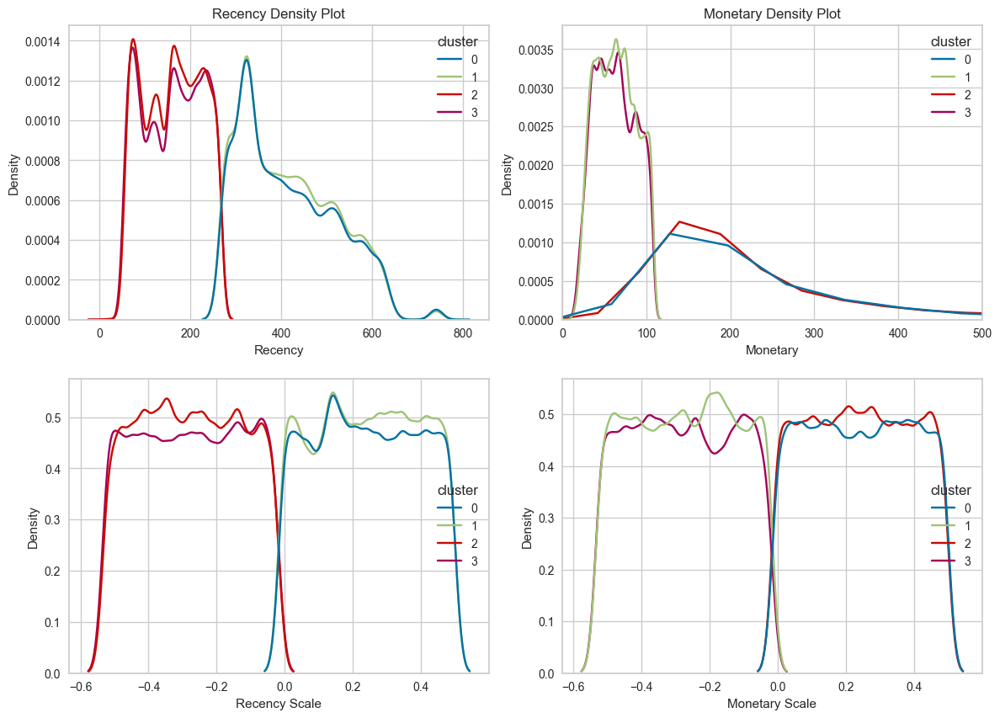

In [83]:
#Display Recency and Monetary Density Plot
fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(14,10),
    gridspec_kw={
        'wspace':.175,
    }
)

for i, col in enumerate(['recency','monetary']*2):
    sns.kdeplot(
        data=final_rfm_table if i < 2 else transformed_rfm,
        x=col,
        ax=axes[0 if i < 2 else 1,i%2],
        hue='cluster',
        palette=sns.color_palette()
    )

    axes[0 if i < 2 else 1,i%2].set_title('{}'.format(col.title()+' Density Plot' if i < 2 else ''))
    axes[0 if i < 2 else 1,i%2].set_xlabel(col.title() if i < 2 else col.title()+' Scale')

axes[0,1].set_xlim([0,500])
plt.show()

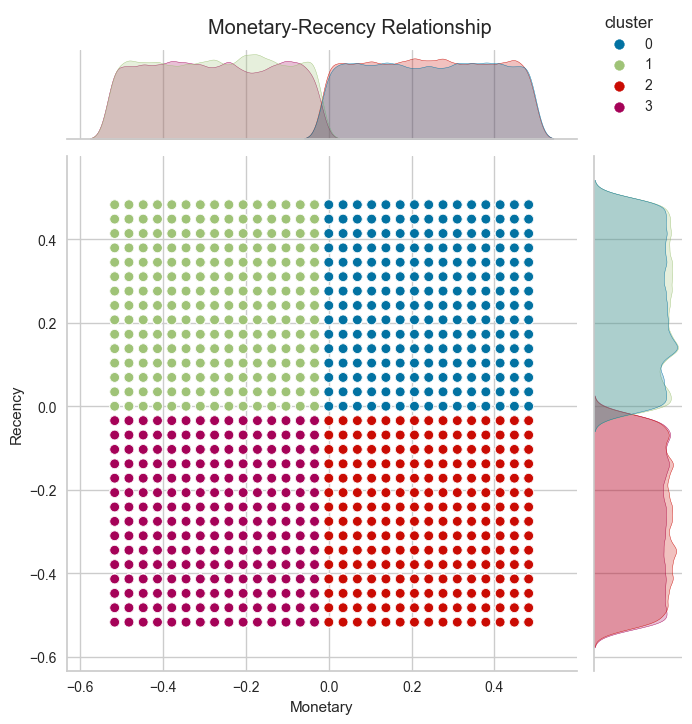

In [84]:
#Display Monetary and Recency Relationship Plot
joint = sns.jointplot(
    transformed_rfm,
    x='monetary',
    y='recency',
    hue='cluster',
    palette=sns.color_palette(),
    height=7
)

joint.fig.suptitle('Monetary-Recency Relationship',y=1.02)
joint.ax_joint.get_legend().set_bbox_to_anchor((1.175,1.3))
plt.xlabel('Monetary'), plt.ylabel('Recency')
plt.show()

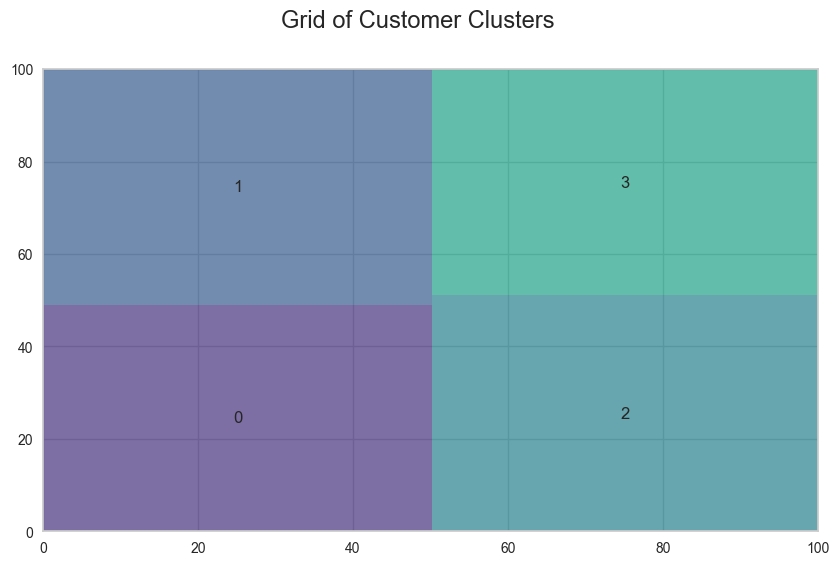

In [85]:
#Display a Grid of Customer Clusters
plt.figure(figsize=(10, 6))
squarify.plot(
    sizes=agg_descriptive['count'],
    label=agg_descriptive['count'].index,
    color=sns.color_palette('viridis'),
    alpha=0.7
)

plt.suptitle(
    'Grid of Customer Clusters', fontsize=17
)

plt.show()

Based on the result of the clustering, we can conclude:

1. Class 2 : High Monetary & Low Recency
- Recent and high spending customer
- Still fresh with high trust to spend more
- This type of customer is the customer we want to retain it is our best customer

2. Class 0 : High Monetary & High Recency
- One of our old customer
- But have the trust to spend high
- Type of customer that goes through our e-commerce when they want to buy high value products

3. Class 3 : Low Monetary & Low Recency
- Fresh customers
- Spends not as much as class 0 and class 2
- Type of customer that loves shopping and buying small things

4. Class 1 : Low Monetary & High Recency
- Customers that are trying out our e-commerce
- Had a low spending
- The type of customer that tries our e-commerce and may end up not liking it

> ### **Data Preparation**
This data preparation was meant to connect the clustering with our main dataset, but the first step is aggregating the main dataset so it will have `unique_customer_id` without duplicates

> **Order History and Customer Geolocation Table Joining**

The first approach we merge the main dataset with Geolocation features, this will help to represent `city`, `zip_code`, and `state` with a more precise pinpoint.

In [86]:
#Display Order History & Geolocation Dataframe Along With Total Duplicates of Primary Key
customer_geo = geo.copy().rename(
    columns={
        'geolocation_zip_code_prefix':'customer_zip_code_prefix',
        'geolocation_lat':'customer_lat',
        'geolocation_lng':'customer_lng'
    }
).drop(['geolocation_city','geolocation_state'],axis=1)\
    .drop_duplicates('customer_zip_code_prefix',keep='first')

for i in zip([order_history,customer_geo],['Order History','Geolocation']):
    print('\n'+(' '+i[1]+' DataFrame ').center(151,'-'))
    display(i[0].head())
    duplicates = i[0]['customer_zip_code_prefix'].duplicated().sum()
    print('Total duplicates of primary key from',i[1],f'DataFrame is {duplicates}.')


--------------------------------------------------------------- Order History DataFrame ---------------------------------------------------------------


,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,delivery_length,faster_within,volume
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,São Paulo,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,Rio de Janeiro,7 days 14:44:46,8 days 00:16:12,3528.0
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,São Paulo,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,São Paulo,16 days 05:11:18,2 days 07:55:36,60000.0
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,Minas Gerais,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,Minas Gerais,7 days 22:45:45,13 days 10:40:44,14157.0
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,São Paulo,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,São Paulo,6 days 03:32:04,5 days 10:27:21,2400.0
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,Paraná,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,São Paulo,25 days 02:44:40,15 days 07:17:29,42000.0


Total duplicates of primary key from Order History DataFrame is 97254.

---------------------------------------------------------------- Geolocation DataFrame ----------------------------------------------------------------


,customer_zip_code_prefix,customer_lat,customer_lng
0,1037,-23.545621,-46.639292
1,1046,-23.546081,-46.644820
3,1041,-23.544392,-46.639499
4,1035,-23.541578,-46.641607
5,1012,-23.547762,-46.635361


Total duplicates of primary key from Geolocation DataFrame is 0.


In [87]:
#Merging Orders History & Customer Geo Dataframe Based on customer_zip_code_prefix
customer_order_history = order_history.merge(
    customer_geo,
    how='left',
    on='customer_zip_code_prefix'
)
display(customer_order_history.head())
customer_order_history.info(verbose=False)

,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,delivery_length,faster_within,volume,customer_lat,customer_lng
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,São Paulo,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,Rio de Janeiro,7 days 14:44:46,8 days 00:16:12,3528.0,-21.758076,-41.312633
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,São Paulo,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,São Paulo,16 days 05:11:18,2 days 07:55:36,60000.0,-20.212393,-50.941471
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,Minas Gerais,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,Minas Gerais,7 days 22:45:45,13 days 10:40:44,14157.0,-19.860439,-44.597972
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,São Paulo,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,São Paulo,6 days 03:32:04,5 days 10:27:21,2400.0,-23.144923,-46.539830
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,Paraná,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,São Paulo,25 days 02:44:40,15 days 07:17:29,42000.0,-23.249008,-46.824961


<class 'pandas.core.frame.DataFrame'>
Int64Index: 112216 entries, 0 to 112215
Columns: 31 entries, order_id to customer_lng
dtypes: datetime64[ns](5), float64(10), int64(3), object(11), timedelta64[ns](2)
memory usage: 27.4+ MB


> **Customer Order History and Seller Geolocation Table Joining**

In [88]:
#Display Order History & Geolocation Dataframe Along With Total Duplicates of Primary Key
seller_geo = geo.copy().rename(
    columns={
        'geolocation_zip_code_prefix':'seller_zip_code_prefix',
        'geolocation_lat':'seller_lat',
        'geolocation_lng':'seller_lng'
    }
).drop(['geolocation_city','geolocation_state'],axis=1)\
    .drop_duplicates('seller_zip_code_prefix',keep='first')

for i in zip([customer_order_history,seller_geo],['Customer Order History','Geolocation']):
    print('\n'+(' '+i[1]+' DataFrame ').center(151,'-'))
    display(i[0].head())
    duplicates = i[0]['seller_zip_code_prefix'].duplicated().sum()
    print('Total duplicates of primary key from',i[1],f'DataFrame is {duplicates}.')


----------------------------------------------------------- Customer Order History DataFrame ----------------------------------------------------------


,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,delivery_length,faster_within,volume,customer_lat,customer_lng
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,São Paulo,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,Rio de Janeiro,7 days 14:44:46,8 days 00:16:12,3528.0,-21.758076,-41.312633
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,São Paulo,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,São Paulo,16 days 05:11:18,2 days 07:55:36,60000.0,-20.212393,-50.941471
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,Minas Gerais,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,Minas Gerais,7 days 22:45:45,13 days 10:40:44,14157.0,-19.860439,-44.597972
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,São Paulo,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,São Paulo,6 days 03:32:04,5 days 10:27:21,2400.0,-23.144923,-46.539830
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,Paraná,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,São Paulo,25 days 02:44:40,15 days 07:17:29,42000.0,-23.249008,-46.824961


Total duplicates of primary key from Customer Order History DataFrame is 109974.

---------------------------------------------------------------- Geolocation DataFrame ----------------------------------------------------------------


,seller_zip_code_prefix,seller_lat,seller_lng
0,1037,-23.545621,-46.639292
1,1046,-23.546081,-46.644820
3,1041,-23.544392,-46.639499
4,1035,-23.541578,-46.641607
5,1012,-23.547762,-46.635361


Total duplicates of primary key from Geolocation DataFrame is 0.


In [89]:
#Merging Customer Order History & Seller Geo Dataframe Based on seller_zip_code_prefix
customer_order_history = customer_order_history.merge(
    seller_geo,
    how='left',
    on='seller_zip_code_prefix'
)
display(customer_order_history.head())
customer_order_history.info(verbose=False)

,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,delivery_length,faster_within,volume,customer_lat,customer_lng,seller_lat,seller_lng
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,São Paulo,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,Rio de Janeiro,7 days 14:44:46,8 days 00:16:12,3528.0,-21.758076,-41.312633,-22.498183,-44.123614
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,São Paulo,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,São Paulo,16 days 05:11:18,2 days 07:55:36,60000.0,-20.212393,-50.941471,-23.566258,-46.518417
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,Minas Gerais,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,Minas Gerais,7 days 22:45:45,13 days 10:40:44,14157.0,-19.860439,-44.597972,-22.264094,-46.158564
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,São Paulo,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,São Paulo,6 days 03:32:04,5 days 10:27:21,2400.0,-23.144923,-46.539830,-20.548228,-47.395897
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,Paraná,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,São Paulo,25 days 02:44:40,15 days 07:17:29,42000.0,-23.249008,-46.824961,-22.931427,-53.133759


<class 'pandas.core.frame.DataFrame'>
Int64Index: 112216 entries, 0 to 112215
Columns: 33 entries, order_id to seller_lng
dtypes: datetime64[ns](5), float64(12), int64(3), object(11), timedelta64[ns](2)
memory usage: 29.1+ MB


> **Missing Values Handling**

In [90]:
#Display Total Missing Value from Each Features on customer_order_history Dataframe
print('Total null value in each columns:')
customer_order_history.isna().sum().sort_values(ascending=False).head(10)

Total null value in each columns:


faster_within                    2424
delivery_length                  2424
order_delivered_customer_date    2424
order_delivered_carrier_date     1187
customer_lng                      302
customer_lat                      302
seller_lng                        253
seller_lat                        253
volume                              0
customer_state                      0
dtype: int64

In [91]:
#Drop The Missing Value from Each Features on customer_order_history Dataframe
customer_order_history = customer_order_history.dropna()
print('Total null value in each columns:')
customer_order_history.isna().sum().sort_values(ascending=False).head(10)

Total null value in each columns:


order_id                        0
order_delivered_carrier_date    0
seller_lat                      0
customer_lng                    0
customer_lat                    0
volume                          0
faster_within                   0
delivery_length                 0
customer_state                  0
customer_city                   0
dtype: int64

> **Dropping Unnecessary Columns**

In [92]:
#Drop The Unnecessary Columns From customer_order_history Dataframe and Make New Dataframe Called unique_df
unique_df = customer_order_history.drop(
    columns=[
        'order_id','order_item_id','product_id',
        'seller_id','seller_city','seller_state',
        'order_status','customer_id','seller_zip_code_prefix',
        'customer_zip_code_prefix','customer_city','customer_state',
        'delivery_length','faster_within'
    ]
)

# Pindah Unique Customer kedepan
column_name = 'customer_unique_id'
column = unique_df[column_name]
unique_df = unique_df.drop(column_name, axis=1)
unique_df.insert(0, column_name, column)

display(unique_df.head())

,customer_unique_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,volume,customer_lat,customer_lng,seller_lat,seller_lng
0,871766c5855e863f6eccc05f988b23cb,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,3528.0,-21.758076,-41.312633,-22.498183,-44.123614
1,eb28e67c4c0b83846050ddfb8a35d051,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,60000.0,-20.212393,-50.941471,-23.566258,-46.518417
2,3818d81c6709e39d06b2738a8d3a2474,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,14157.0,-19.860439,-44.597972,-22.264094,-46.158564
3,af861d436cfc08b2c2ddefd0ba074622,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,2400.0,-23.144923,-46.539830,-20.548228,-47.395897
4,64b576fb70d441e8f1b2d7d446e483c5,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,42000.0,-23.249008,-46.824961,-22.931427,-53.133759


> **Timedelta Feature Engineering**

In [93]:
#Aggregate The Datetime Features with Timedelta Feature Engineering
unique_df['approved_time_seconds'] = (unique_df['order_approved_at'] - unique_df['order_purchase_timestamp']).dt.total_seconds()
unique_df['purchase_to_carrier'] = (unique_df['order_delivered_carrier_date'] - unique_df['order_purchase_timestamp']).dt.days
unique_df['carrier_to_customer'] = (unique_df['order_delivered_customer_date'] - unique_df['order_delivered_carrier_date']).dt.days
unique_df['delivery_length'] = (unique_df['order_delivered_customer_date'] - unique_df['order_purchase_timestamp']).dt.days
unique_df['estimated'] = (unique_df['order_estimated_delivery_date'] - unique_df['order_purchase_timestamp']).dt.days
unique_df['delivery_speed'] = unique_df['estimated'] - unique_df['delivery_length']

unique_df = unique_df.drop(
    columns=[
        'order_approved_at','order_purchase_timestamp','order_delivered_carrier_date',
        'order_delivered_customer_date','order_estimated_delivery_date','estimated','delivery_length'
    ]
)

unique_df.head()

,customer_unique_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score,volume,customer_lat,customer_lng,seller_lat,seller_lng,approved_time_seconds,purchase_to_carrier,carrier_to_customer,delivery_speed
0,871766c5855e863f6eccc05f988b23cb,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,5.0,3528.0,-21.758076,-41.312633,-22.498183,-44.123614,2793.0,6,1,8
1,eb28e67c4c0b83846050ddfb8a35d051,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,4.0,60000.0,-20.212393,-50.941471,-23.566258,-46.518417,727.0,8,8,2
2,3818d81c6709e39d06b2738a8d3a2474,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5.0,14157.0,-19.860439,-44.597972,-22.264094,-46.158564,899.0,1,6,14
3,af861d436cfc08b2c2ddefd0ba074622,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,4.0,2400.0,-23.144923,-46.539830,-20.548228,-47.395897,583.0,2,4,5
4,64b576fb70d441e8f1b2d7d446e483c5,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,5.0,42000.0,-23.249008,-46.824961,-22.931427,-53.133759,742.0,11,13,15


> **Geographic Distances**

In [94]:
# Calculate the delivery distance
from geopy.distance import distance

# Calculate the delivery distance
def calculate_distance(row):
    customer_coords = (row['customer_lat'], row['customer_lng'])
    seller_coords = (row['seller_lat'], row['seller_lng'])
    return distance(customer_coords, seller_coords).km

# Apply the calculate_distance function to each row of the DataFrame
unique_df['delivery_distance'] = unique_df.apply(calculate_distance, axis=1)

# Drop the 'customer_lat', 'customer_lng', 'seller_lat', and 'seller_lng' columns
columns_to_drop = ['customer_lat', 'customer_lng', 'seller_lat', 'seller_lng']
unique_df = unique_df.drop(columns_to_drop, axis=1)

unique_df.head()

,customer_unique_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score,volume,approved_time_seconds,purchase_to_carrier,carrier_to_customer,delivery_speed,delivery_distance
0,871766c5855e863f6eccc05f988b23cb,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,5.0,3528.0,2793.0,6,1,8,301.356848
1,eb28e67c4c0b83846050ddfb8a35d051,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,4.0,60000.0,727.0,8,8,2,588.848102
2,3818d81c6709e39d06b2738a8d3a2474,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5.0,14157.0,899.0,1,6,14,311.645874
3,af861d436cfc08b2c2ddefd0ba074622,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,4.0,2400.0,583.0,2,4,5,300.834561
4,64b576fb70d441e8f1b2d7d446e483c5,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,5.0,42000.0,742.0,11,13,15,647.268094


> **Dimensional Calculation**

In [95]:
#Aggregating The Dimensional Features to Get Volume of The Product
unique_df['volume'] = unique_df['product_height_cm']*unique_df['product_length_cm']*unique_df['product_width_cm']
unique_df = unique_df.drop(columns=['product_length_cm','product_height_cm','product_width_cm'])
unique_df.head()

,customer_unique_id,price,freight_value,product_category_name,product_weight_g,review_score,volume,approved_time_seconds,purchase_to_carrier,carrier_to_customer,delivery_speed,delivery_distance
0,871766c5855e863f6eccc05f988b23cb,58.90,13.29,cool stuff,650.0,5.0,3528.0,2793.0,6,1,8,301.356848
1,eb28e67c4c0b83846050ddfb8a35d051,239.90,19.93,pet shop,30000.0,4.0,60000.0,727.0,8,8,2,588.848102
2,3818d81c6709e39d06b2738a8d3a2474,199.00,17.87,furniture decor,3050.0,5.0,14157.0,899.0,1,6,14,311.645874
3,af861d436cfc08b2c2ddefd0ba074622,12.99,12.79,perfumery,200.0,4.0,2400.0,583.0,2,4,5,300.834561
4,64b576fb70d441e8f1b2d7d446e483c5,199.90,18.14,garden tools,3750.0,5.0,42000.0,742.0,11,13,15,647.268094


In [96]:
#Check The Normality Distribution From Numerical Columns
num_cols = ['review_score','approved_time_seconds','purchase_to_carrier','carrier_to_customer','delivery_speed','delivery_distance']
cols, stats_val, p_val, result = [], [], [], []

for i in unique_df[num_cols].columns:
    stat, pvalue = stats.kstest(
        unique_df[i],
        np.random.normal(
            unique_df[i].mean(),
            unique_df[i].std(),
            size=len(unique_df[i])
        )
    )

    cols.append(i)
    stats_val.append(stat)
    p_val.append('> 0.05' if pvalue > 0.05 else '< 0.05')
    result.append(True if pvalue > 0.05 else False)

display(pd.DataFrame(
    data={
        'Statistic':stats_val,
        'P-Value':p_val,
        'Normally Distributed':result
    },
    index=cols
))

,Statistic,P-Value,Normally Distributed
review_score,0.325392,< 0.05,False
approved_time_seconds,0.326600,< 0.05,False
purchase_to_carrier,0.220464,< 0.05,False
carrier_to_customer,0.169977,< 0.05,False
delivery_speed,0.104168,< 0.05,False
delivery_distance,0.157282,< 0.05,False


Insights:
- Based on Normality Distribution Check above, it can be seen that each features on Numerical Columns are not normally distributed.

> **Columns Aggregating Based on Customer Unique ID**

In [97]:
#Display Aggregating columns Based on Customer Unique ID
unique_df = unique_df.groupby('customer_unique_id').agg({
    'price':'sum',
    'freight_value':'sum',
    'product_category_name':'nunique',
    'product_weight_g':'sum',
    'review_score':'median',
    'volume':'sum',
    'approved_time_seconds':'median',
    'purchase_to_carrier':'median',
    'carrier_to_customer':'median',
    'delivery_speed':'median',
    'delivery_distance':'median'
}).reset_index()

unique_df = unique_df.rename(columns={
    'price':'total_price',
    'freight_value':'total_freight',
    'product_category_name':'total_items',
    'product_weight_g':'total_weight',
    'volume':'total_volume'
})
display(unique_df.head())
unique_df.info(verbose=False)

,customer_unique_id,total_price,total_freight,total_items,total_weight,review_score,total_volume,approved_time_seconds,purchase_to_carrier,carrier_to_customer,delivery_speed,delivery_distance
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90,12.00,1,1500.0,5.0,7616.0,891.0,1.0,4.0,4.0,109.120106
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,8.29,1,375.0,4.0,5148.0,26057.0,2.0,1.0,4.0,22.848294
2,0000f46a3911fa3c0805444483337064,69.00,17.22,1,1500.0,3.0,43750.0,0.0,2.0,23.0,2.0,515.751377
3,0000f6ccb0745a6a4b88665a16c9f078,25.99,17.63,1,150.0,4.0,1045.0,1176.0,0.0,19.0,11.0,2468.972600
4,0004aac84e0df4da2b147fca70cf8255,180.00,16.89,1,6050.0,5.0,528.0,1270.0,2.0,11.0,7.0,154.139035


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92600 entries, 0 to 92599
Columns: 12 entries, customer_unique_id to delivery_distance
dtypes: float64(10), int64(1), object(1)
memory usage: 8.5+ MB


> **Join Customer Order History and RFM Table**

In [98]:
#Display Information From Unique Customer Detail and Clustering RFM Dataframe
print('\n'+(' Unique Customer Detail ').center(151,'-'))
display(unique_df.head())
unique_df.info(verbose=False)
print('\n'+(' Clustering RFM ').center(151,'-'))
display(final_rfm_table.head())
final_rfm_table.info(verbose=False)


---------------------------------------------------------------- Unique Customer Detail ---------------------------------------------------------------


,customer_unique_id,total_price,total_freight,total_items,total_weight,review_score,total_volume,approved_time_seconds,purchase_to_carrier,carrier_to_customer,delivery_speed,delivery_distance
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90,12.00,1,1500.0,5.0,7616.0,891.0,1.0,4.0,4.0,109.120106
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,8.29,1,375.0,4.0,5148.0,26057.0,2.0,1.0,4.0,22.848294
2,0000f46a3911fa3c0805444483337064,69.00,17.22,1,1500.0,3.0,43750.0,0.0,2.0,23.0,2.0,515.751377
3,0000f6ccb0745a6a4b88665a16c9f078,25.99,17.63,1,150.0,4.0,1045.0,1176.0,0.0,19.0,11.0,2468.972600
4,0004aac84e0df4da2b147fca70cf8255,180.00,16.89,1,6050.0,5.0,528.0,1270.0,2.0,11.0,7.0,154.139035


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92600 entries, 0 to 92599
Columns: 12 entries, customer_unique_id to delivery_distance
dtypes: float64(10), int64(1), object(1)
memory usage: 8.5+ MB

-------------------------------------------------------------------- Clustering RFM -------------------------------------------------------------------


,customer_unique_id,monetary,frequency,recency,segments,cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,160,FRESHER,2
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,163,FRESHER,3
2,0000f46a3911fa3c0805444483337064,86.22,1,585,GONERS,1
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,1,369,GONERS,1
4,0004aac84e0df4da2b147fca70cf8255,196.89,1,336,GOLD,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96096 entries, 0 to 96095
Columns: 6 entries, customer_unique_id to cluster
dtypes: float64(1), int32(1), int64(2), object(2)
memory usage: 4.0+ MB


In [99]:
#Merge unique_df and 'customer_unique_id','cluster' Columns from final_rfm_table Dataframe Based on customer_unique_id
df = unique_df.merge(
    final_rfm_table[['customer_unique_id','cluster']],
    how='left',
    on='customer_unique_id'
).set_index('customer_unique_id')
display(df.head())
df.info(verbose=False)

,total_price,total_freight,total_items,total_weight,review_score,total_volume,approved_time_seconds,purchase_to_carrier,carrier_to_customer,delivery_speed,delivery_distance,cluster
customer_unique_id,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,129.90,12.00,1,1500.0,5.0,7616.0,891.0,1.0,4.0,4.0,109.120106,2
0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,8.29,1,375.0,4.0,5148.0,26057.0,2.0,1.0,4.0,22.848294,3
0000f46a3911fa3c0805444483337064,69.00,17.22,1,1500.0,3.0,43750.0,0.0,2.0,23.0,2.0,515.751377,1
0000f6ccb0745a6a4b88665a16c9f078,25.99,17.63,1,150.0,4.0,1045.0,1176.0,0.0,19.0,11.0,2468.972600,1
0004aac84e0df4da2b147fca70cf8255,180.00,16.89,1,6050.0,5.0,528.0,1270.0,2.0,11.0,7.0,154.139035,0


<class 'pandas.core.frame.DataFrame'>
Index: 92600 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Columns: 12 entries, total_price to cluster
dtypes: float64(10), int32(1), int64(1)
memory usage: 8.8+ MB


> **Dataframe Transformation**

In [100]:
#Transform The Dataframe with Binning and Scaling
skewed_cols = list(df.drop(['total_items','review_score','cluster'],axis=1).columns)

skewed_preprocess = Pipeline([
    ('binning',KBinsDiscretizer(n_bins=30,encode='ordinal')),
    ('scaling',RobustScaler(quantile_range=(0,100)))
])

transformer = ColumnTransformer([
    ('skewed',skewed_preprocess,skewed_cols)
],remainder='passthrough')

In [101]:
#Splitting The Data to Train and Test
from sklearn.model_selection import train_test_split

np.random.seed(1995)
X_train, X_test, y_train, y_test = train_test_split(
    df.drop('cluster',axis=1).astype(float),
    df['cluster'],
    stratify=df['cluster'],
    test_size=0.2,
    random_state=1995
)

X_train = pd.DataFrame(transformer.fit_transform(X_train))
X_test = pd.DataFrame(transformer.transform(X_test))
feature_names = list(transformer.transformers_[0][1].get_feature_names_out())+['total_items','review_score']
X_train.columns = feature_names
X_test.columns = feature_names

> **Data Formatting**

In [102]:
#Display Attribute Information of The Training and Test Dataset Data Type
for i, dataset in enumerate([X_train,X_test]):
    items = [[col, dataset[col].dtype] for col in dataset]
    print('\nAttribute Information of Encoded {}'.format('Training Dataset' if i == 0 else 'Test Dataset'))
    display(pd.DataFrame(data=items,columns=['Features','Data Type']))
    dataset.info(verbose=False)


Attribute Information of Encoded Training Dataset


,Features,Data Type
0,total_price,float64
1,total_freight,float64
2,total_weight,float64
3,total_volume,float64
4,approved_time_seconds,float64
5,purchase_to_carrier,float64
6,carrier_to_customer,float64
7,delivery_speed,float64
8,delivery_distance,float64
9,total_items,float64


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74080 entries, 0 to 74079
Columns: 11 entries, total_price to review_score
dtypes: float64(11)
memory usage: 6.2 MB

Attribute Information of Encoded Test Dataset


,Features,Data Type
0,total_price,float64
1,total_freight,float64
2,total_weight,float64
3,total_volume,float64
4,approved_time_seconds,float64
5,purchase_to_carrier,float64
6,carrier_to_customer,float64
7,delivery_speed,float64
8,delivery_distance,float64
9,total_items,float64


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18520 entries, 0 to 18519
Columns: 11 entries, total_price to review_score
dtypes: float64(11)
memory usage: 1.6 MB


In [103]:
#Formatting The Training and Test Data Type to float16 and int8
for i, dataset in enumerate([X_train,X_test]):
    before = [dataset[j].dtype for j in dataset.columns]
    dataset[list(dataset.columns)[:-2]] = dataset[list(dataset.columns)[:-2]].astype('float16')
    dataset[list(dataset.columns)[-2:]] = dataset[list(dataset.columns)[-2:]].astype('int8')
    items = [[col, before[k], dataset[col].dtype] for k, col in enumerate(dataset)]
    print('\nAttribute Information of Encoded {}'.format('Training Dataset'if i == 0 else 'Test Dataset'))
    display(pd.DataFrame(data=items,columns=['Features','Before','After']))
    dataset.info(verbose=False)


Attribute Information of Encoded Training Dataset


,Features,Before,After
0,total_price,float64,float16
1,total_freight,float64,float16
2,total_weight,float64,float16
3,total_volume,float64,float16
4,approved_time_seconds,float64,float16
5,purchase_to_carrier,float64,float16
6,carrier_to_customer,float64,float16
7,delivery_speed,float64,float16
8,delivery_distance,float64,float16
9,total_items,float64,int8


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74080 entries, 0 to 74079
Columns: 11 entries, total_price to review_score
dtypes: float16(9), int8(2)
memory usage: 1.4 MB

Attribute Information of Encoded Test Dataset


,Features,Before,After
0,total_price,float64,float16
1,total_freight,float64,float16
2,total_weight,float64,float16
3,total_volume,float64,float16
4,approved_time_seconds,float64,float16
5,purchase_to_carrier,float64,float16
6,carrier_to_customer,float64,float16
7,delivery_speed,float64,float16
8,delivery_distance,float64,float16
9,total_items,float64,int8


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18520 entries, 0 to 18519
Columns: 11 entries, total_price to review_score
dtypes: float16(9), int8(2)
memory usage: 361.8 KB


## 4. Model Benchmarking

> **Algorithm**

In [104]:
# Importing Classification Algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier

# Evaluation Metrics
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score, roc_auc_score, confusion_matrix
from sklearn.metrics import make_scorer

# Pre-processing
from sklearn.model_selection import StratifiedKFold, cross_val_score

In [105]:
# Random State untuk di assign
r = 1995

# Random State untuk di assign
logit = LogisticRegression(random_state=r)
ada = AdaBoostClassifier(random_state=r)
gb = GradientBoostingClassifier(random_state=r)
xgb = XGBClassifier()
lgbm = LGBMClassifier(random_state=r)
mlp = MLPClassifier(random_state=r)

> **Cross-Validation**

In [106]:
# buat list of models yang akan di iterasikan untuk menjalankan cross-val
model = [logit,ada,gb,xgb,lgbm,mlp]

# buat list kosong untuk menampung hasil yang nanti akan di compile kedalam dataframe
f1 = []
f1_std = []
acc_scr = []
pre = []
rec = []

# SK-fold dengan 5 split
skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=r)

# iterasi dari variable model
for alg in model:
    # pipeline dengan transformer
    estimator = Pipeline([('model',alg)])

    model_f1 = cross_val_score(estimator, X_train,y_train,cv=skfold,scoring='f1_macro',n_jobs=-1)
    model_acc = cross_val_score(estimator, X_train,y_train,cv=skfold,scoring='accuracy',n_jobs=-1)
    model_pre = cross_val_score(estimator, X_train,y_train,cv=skfold,scoring='precision_macro',n_jobs=-1)
    model_rec = cross_val_score(estimator, X_train,y_train,cv=skfold,scoring='recall_macro',n_jobs=-1)

    # memasukkan kedalam list kosong
    f1.append(model_f1.mean())
    f1_std.append(model_f1.std())
    acc_scr.append(model_acc.mean())
    pre.append(model_pre.mean())
    rec.append(model_rec.mean())

# hasil akan di masukkan kedalam dataframe agar lebih jelas
model_comparison = pd.DataFrame({'model':['Logistic Regression','Ada Boost','Gradient Boosting','Extreme Gradient Boost','LightGBM','Multilayer Perceptron Classifier'],

'F1-Score': f1,'Std-F1': f1_std,'Precision':pre,'Recall':rec, 'Accuracy':acc_scr})

# tampilkan hasilnya
model_comparison.set_index('model').sort_values(by='F1-Score',ascending=False)

,F1-Score,Std-F1,Precision,Recall,Accuracy
model,,,,,
Extreme Gradient Boost,0.764609,0.004490,0.766772,0.764744,0.765254
LightGBM,0.754716,0.003965,0.757571,0.754938,0.755535
Gradient Boosting,0.720162,0.001689,0.723147,0.720486,0.721409
Multilayer Perceptron Classifier,0.699555,0.004864,0.702795,0.700491,0.700405
Logistic Regression,0.617743,0.004297,0.618251,0.617800,0.618413
Ada Boost,0.604207,0.006116,0.612379,0.609027,0.608194


From Cross Validation table score above, it turned out that Extreme Gradient Boosting is the most perfomed model based on F1-Score. But, keep in mind that the performance of Light Gradient Boosting Machine is more stabilized based on the F1-Score Standard Deviation, let alone the F1-Score itself is quite similar with the Extreme Gradient Boosting.

Based on this Cross Validation:

1. Extreme Gradient Boosting and Light Gradient Boosting might be our candidate models.
2. From the judgement of F1-Score Standard Deviation, Light Gradient Boosting outperformed Gradient Boosting Machine.

> **Test Set**

In [107]:
# Model
model = [logit,ada,gb,xgb,lgbm,mlp]
# list kosong untuk menampung metrics
pre = []
rec = []
f1S = []
acc = []

# for loop pada model
for alg in model:

    estimator = Pipeline([
    ('model',alg)
    ])

    # fit data
    estimator.fit(X_train,y_train)

    # eval metrics
    y_pred = estimator.predict(X_test)

    pre_score = precision_score(y_test,y_pred, average='macro')
    rec_score = recall_score(y_test,y_pred, average='macro')
    f1_sscore = f1_score(y_test,y_pred, average='macro')
    acc_score = accuracy_score(y_test,y_pred)

    # masukkan kedalam list kosong
    pre.append(pre_score)
    rec.append(rec_score)
    f1S.append(f1_sscore)
    acc.append(acc_score)

# buatkan dataframenya
model_test_comparison = pd.DataFrame({'model':['Logistic Regression','Ada Boost','Gradient Boosting','Extreme Gradient Boost','LightGBM','Multilayer Perceptron Classifier'],

'F1-Score': f1S, 'Precision': pre,'Recall': rec,'Accuracy':acc})

# tampilkan hasilnya
model_test_comparison.sort_values(by='F1-Score',ascending=False)

,model,F1-Score,Precision,Recall,Accuracy
3,Extreme Gradient Boost,0.772811,0.775265,0.772920,0.773488
4,LightGBM,0.762692,0.766208,0.762973,0.763607
2,Gradient Boosting,0.723044,0.727255,0.723487,0.724460
5,Multilayer Perceptron Classifier,0.707346,0.717182,0.708793,0.710421
1,Ada Boost,0.628854,0.628915,0.629148,0.629158
0,Logistic Regression,0.624174,0.624886,0.624248,0.624946


From the result of the test set above, we conclude that the models could absolutely perform well with no indication of overfitting nor underfitting. The result are sorted descendedly with Extreme Gradient Boosting at top chart.

> **Train & Test Comparison**

In [108]:
from IPython.display import display_html

# Style Using HTML untuk display side-by-side
train_styler = model_comparison.style.set_table_attributes("style='display:inline'").set_caption('Cross-Val Result')
test_styler = model_test_comparison.style.set_table_attributes("style='display:inline'").set_caption('Test Set Result')
test_t_styler = model_test_comparison.T.style.set_table_attributes("style='display:inline'").set_caption('df2_t')

display_html(train_styler._repr_html_()+test_styler._repr_html_(), raw=True)

Cross-Val Result 
 
 
   
 model 
 F1-Score 
 Std-F1 
 Precision 
 Recall 
 Accuracy 
 
 
 
 
 0 
 Logistic Regression 
 0.617743 
 0.004297 
 0.618251 
 0.617800 
 0.618413 
 
 
 1 
 Ada Boost 
 0.604207 
 0.006116 
 0.612379 
 0.609027 
 0.608194 
 
 
 2 
 Gradient Boosting 
 0.720162 
 0.001689 
 0.723147 
 0.720486 
 0.721409 
 
 
 3 
 Extreme Gradient Boost 
 0.764609 
 0.004490 
 0.766772 
 0.764744 
 0.765254 
 
 
 4 
 LightGBM 
 0.754716 
 0.003965 
 0.757571 
 0.754938 
 0.755535 
 
 
 5 
 Multilayer Perceptron Classifier 
 0.699555 
 0.004864 
 0.702795 
 0.700491 
 0.700405 
 
 
 

 
 Test Set Result 
 
 
   
 model 
 F1-Score 
 Precision 
 Recall 
 Accuracy 
 
 
 
 
 0 
 Logistic Regression 
 0.624174 
 0.624886 
 0.624248 
 0.624946 
 
 
 1 
 Ada Boost 
 0.628854 
 0.628915 
 0.629148 
 0.629158 
 
 
 2 
 Gradient Boosting 
 0.723044 
 0.727255 
 0.723487 
 0.724460 
 
 
 3 
 Extreme Gradient Boost 
 0.772811 
 0.775265 
 0.772920 
 0.773488 
 
 
 4 
 LightGBM 
 0.762692 
 0.766208 
 0.762973 
 0.763607 
 
 
 5 
 Multilayer Perceptron Classifier 
 0.707346 
 0.717182 
 0.708793 
 0.710421

So based on the cross-validation and test result, it was shown that XGboost are the model with the higest F1-Score with the score of 0.764609, and followed by LightGBM with the score of 0.754716, but in this moment, we decided that we took LightGBM as our model based on:
1. Fast and Lighter computing with a competitive result.
2. GOSS feature : GOSS (Gradient Based One Side Sampling) is a novel sampling method which down samples the instances on basis of gradients.
3. EFB feature : EFB (Exclusive Feature Bundling) is a near-lossless method to reduce the number of effective features.
4. We imply that LGBM is more stable.

> ### **Imbalanced Data: Resampling**

In [109]:
# Resampling
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, classification_report

# Pipeline
from imblearn.pipeline import Pipeline # note: Untuk data imbalance harus menggunakan pipeline dari imblearn (Untuk memasukkan resampling)

In [110]:
class imbalance_val_score:
    def __init__(self,estimator):
        self.estimator = estimator
        self.methods = ['1','2','3','4','5']

    def imbalance_validation(self,X_trainval,y_trainval):
        f1_scores, pr_scores, re_scores, acc_scores = [], [], [], []
        result_scores = [f1_scores, pr_scores, re_scores, acc_scores]

        for method in self.methods:
            f1_method, pr_method, re_method, acc_method = [], [], [], []
            method_scores = [f1_method, pr_method, re_method, acc_method]

            for train, validation in skfold.split(X_trainval,y_trainval):
                X_train, y_train = X_trainval.iloc[train], y_trainval.iloc[train]
                X_val, y_val = X_trainval.iloc[validation], y_trainval.iloc[validation]
                scores = (self.method(self.estimator,X_train,y_train,X_val,y_val,method).method_score())

                for i in zip(method_scores,scores):
                    i[0].append(i[1])

            for i in zip(result_scores,method_scores):
                i[0].append(i[1])

        return f1_scores, pr_scores, re_scores, acc_scores

    def imbalance_test_score(self,X_trainval,y_trainval,X_test,y_test):
        f1_scores, pr_scores, re_scores, acc_scores = [], [], [], []
        result_scores = [f1_scores, pr_scores, re_scores, acc_scores]

        for method in self.methods:
            scores = (self.method(self.estimator,X_trainval,y_trainval,X_test,y_test,method).method_score())

            for i in zip(result_scores,scores):
                i[0].append(i[1])

        return f1_scores, pr_scores, re_scores, acc_scores

    def imbalance_classification_report(self,X_trainval,y_trainval,X_test,y_test):
        reports = []

        for method in self.methods:
            reports.append(self.method(self.estimator,X_trainval,y_trainval,X_test,y_test,method).method_report())

        return reports

    class method:
        def __init__(self,estimator,X_train,y_train,X_test,y_test,method):
            self.X_train, self.y_train = X_train, y_train
            self.X_test, self.y_test = X_test, y_test
            self.estimator, self.method = estimator, method

        def method_score(self):
            X_resampled, y_resampled = self.selection(self.X_train,self.y_train,self.method).get_samples()
            scores = (self.calculate(self.estimator,X_resampled,y_resampled).get_results(X_test,y_test))
            return scores

        def method_report(self):
            X_resampled, y_resampled = self.selection(self.X_train,self.y_train,self.method).get_samples()
            report = self.calculate(self.estimator,X_resampled,y_resampled).get_report(X_test,y_test)
            return report

        class selection:
            def __init__(self,X_train,y_train,method):
                self.X_train, self.y_train = X_train, y_train
                self.method = method

            def get_samples(self):
                if self.method in ['1','2','3']:
                    method_dict = {'1':RandomOverSampler,'2':RandomUnderSampler,'3':SMOTE}
                    X_resampled, y_resampled = (method_dict.setdefault(self.method)\
                                                (random_state=1995).fit_resample(self.X_train, self.y_train))
                elif self.method == '4':
                    X_resampled, y_resampled = NearMiss().fit_resample(self.X_train,self.y_train)
                else:
                    X_resampled, y_resampled = self.X_train, self.y_train
                return X_resampled, y_resampled

        class calculate:
            def __init__(self,estimator,X_train,y_train):
                self.estimator = estimator.fit(X_train,y_train)

            def get_results(self,X_test,y_test):
                f1score = f1_score(y_test,self.estimator.predict(X_test),average='macro')
                pr_score = precision_score(y_test,self.estimator.predict(X_test),average='macro')
                re_score = recall_score(y_test,self.estimator.predict(X_test),average='macro')
                acc_score = accuracy_score(y_test,self.estimator.predict(X_test))

                return [f1score, pr_score, re_score, acc_score]

            def get_report(self,X_test,y_test):
                return classification_report(y_test,self.estimator.predict(X_test))

In [111]:
estimator = lgbm
sampling_score = imbalance_val_score(estimator).imbalance_validation(X_train,y_train)

f1_scores, pr_scores, re_scores, acc_scores = [], [], [], []
for i,var in enumerate([f1_scores, pr_scores, re_scores, acc_scores]):
    for val in sampling_score[i]:
        var.append(val)

sampling_comparison = pd.DataFrame({
    ('Over Sampling','F1 Score'):f1_scores[0],('Over Sampling','Precision'):pr_scores[0],
    ('Over Sampling','Recall'):re_scores[0],('Over Sampling','Accuracy'):acc_scores[0],
    ('Under Sampling','F1 Score'):f1_scores[1],('Under Sampling','Precision'):pr_scores[1],
    ('Under Sampling','Recall'):re_scores[1],('Under Sampling','Accuracy'):acc_scores[1],
    ('SMOTE','F1 Score'):f1_scores[2],('SMOTE','Precision'):pr_scores[2],
    ('SMOTE','Recall'):re_scores[2],('SMOTE','Accuracy'):acc_scores[2],
    ('Near Miss','F1 Score'):f1_scores[3],('Near Miss','Precision'):pr_scores[3],
    ('Near Miss','Recall'):re_scores[3],('Near Miss','Accuracy'):acc_scores[3],
    ('Normal Sampling','F1 Score'):f1_scores[4],('Normal Sampling','Precision'):pr_scores[4],
    ('Normal Sampling','Recall'):re_scores[4],('Normal Sampling','Accuracy'):acc_scores[4]
})

for function in [lambda x: x.mean(),lambda x: x.std()]:
    sampling_comparison = sampling_comparison.append(sampling_comparison.apply(function,axis=0),ignore_index=True)

sampling_comparison = sampling_comparison.rename(index={0:'Fold 1',1:'Fold 2',2:'Fold 3',3:'Fold 4',4:'Fold 5',5:'Average',6:'STD'})
sampling_comparison.apply(lambda x: round(x*100,2)).transpose()

Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Average  \
Over Sampling   F1 Score    75.68   76.18   76.19   75.94   75.95    75.99   
                Precision   76.00   76.47   76.52   76.19   76.21    76.28   
                Recall      75.73   76.22   76.23   75.97   75.99    76.03   
                Accuracy    75.76   76.25   76.27   76.01   76.02    76.06   
Under Sampling  F1 Score    76.06   76.15   76.24   75.85   76.27    76.11   
                Precision   76.38   76.42   76.57   76.12   76.56    76.41   
                Recall      76.11   76.19   76.29   75.89   76.31    76.16   
                Accuracy    76.14   76.22   76.32   75.93   76.34    76.19   
SMOTE           F1 Score    76.14   75.94   76.10   76.11   75.99    76.06   
                Precision   76.48   76.22   76.43   76.39   76.26    76.36   
                Recall      76.18   75.98   76.13   76.14   76.02    76.09   
                Accuracy    76.23   76.02   76.18   76.19   76.06    76.14   
Near Miss       F1 Score    75.58   76.21   75.94   75.84   75.70    75.85   
                Precision   75.82   76.48   76.22   76.07   75.95    76.11   
                Recall      75.62   76.25   75.98   75.88   75.74    75.90   
                Accuracy    75.64   76.28   76.01   75.91   75.77    75.92   
Normal Sampling F1 Score    76.02   76.10   76.13   75.99   75.99    76.05   
                Precision   76.37   76.44   76.50   76.29   76.29    76.38   
                Recall      76.05   76.13   76.16   76.01   76.02    76.07   
                Accuracy    76.11   76.19   76.22   76.07   76.08    76.13   

                            STD  
Over Sampling   F1 Score   0.19  
                Precision  0.19  
                Recall     0.18  
                Accuracy   0.19  
Under Sampling  F1 Score   0.15  
                Precision  0.16  
                Recall     0.15  
                Accuracy   0.15  
SMOTE           F1 Score   0.08  
                Precision  0.10  
                Recall     0.08  
                Accuracy   0.08  
Near Miss       F1 Score   0.21  
                Precision  0.23  
                Recall     0.21  
                Accuracy   0.22  
Normal Sampling F1 Score   0.06  
                Precision  0.08  
                Recall     0.06  
                Accuracy   0.06

In [112]:
testing_score = imbalance_val_score(estimator).imbalance_test_score(X_train,y_train,X_test,y_test)
testing_comparison = pd.DataFrame(testing_score).apply(lambda x: round(x*100,2)).transpose()
testing_comparison.rename(index={0:'Over Sampling',1:'Under Sampling',2:'SMOTE',3:'Near Miss',4:'Normal Sampling'},
                          columns={0:'F1 Score',1:'Precision',2:'Recall',3:'Accuracy'})

,F1 Score,Precision,Recall,Accuracy
Over Sampling,76.28,76.56,76.32,76.35
Under Sampling,76.28,76.57,76.33,76.36
SMOTE,76.29,76.61,76.32,76.37
Near Miss,76.13,76.37,76.17,76.20
Normal Sampling,76.27,76.62,76.30,76.36


Due to our balanced targets, doing resampling is not approriate because of well-balanced target class on our dataset. In addition, the score from normal sampling itselft is quite similar with all resampling methods as shown above.

In [113]:
reports = imbalance_val_score(estimator).imbalance_classification_report(X_train,y_train,X_test,y_test)

for report,j in zip(reports,['Over Sampling','Under Sampling','SMOTE','Near Miss','Normal Sampling']):
    print(j.center(55,'='),'\n'+report+('=').center(55,'='),'\n')

=====================Over Sampling===================== 
              precision    recall  f1-score   support

           0       0.72      0.76      0.74      4517
           1       0.77      0.86      0.81      4729
           2       0.75      0.71      0.73      4731
           3       0.82      0.73      0.78      4543

    accuracy                           0.76     18520
   macro avg       0.77      0.76      0.76     18520
weighted avg       0.77      0.76      0.76     18520

=====================Under Sampling==================== 
              precision    recall  f1-score   support

           0       0.72      0.76      0.74      4517
           1       0.77      0.86      0.81      4729
           2       0.76      0.70      0.73      4731
           3       0.82      0.73      0.78      4543

    accuracy                           0.76     18520
   macro avg       0.77      0.76      0.76     18520
weighted avg       0.77      0.76      0.76     18520

================

> ### **Hyperparameter Tuning**

We use Bayesian Optimization for the following reasons:

1. Larger Scale: By using Bayesian optimization tuning, the range of each parameter is broader, which increases the chances of finding hidden layers that may go undetected when manually setting parameters forcibly, such as in GridSearchCV. Additionally, GridSearch can be time-consuming when combined with numerous parameters, lengthy parameter arguments, and a large number of cross-validation folds. Therefore, Bayesian Optimization is chosen based on these factors.

1. Why not RandomizedCV? Bayesian optimization is actually a more efficient and effective form compared to RandomizedSearch. In RandomizedSearch, we randomly search for optimal hyperparameters and then make adjustments and repeat the search. This process can be time-consuming. Bayesian optimization, on the other hand, automatically performs adjustments from each trial it generates, optimizing subsequent trials.

1. Fast Search: The speed of Bayesian optimization depends on the number of trials we choose to run. Whether we run 100, 500, or even 1000 trials is up to us. However, when referring to "fast search" here, it means that the choice of trials we run is under our control. If we want a faster run, we can set it to 100-200 trials, but the probability of finding the optimal solution may be lower compared to running 500-1000 trials. Nevertheless, because Bayesian search is an automated version of Random Search, it can still be considered efficient.

In [114]:
# Tuning
import optuna

skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=r)

# buat function untuk melakukan trial
def objective(trial):
    # definisikan hyperparameter dari LightGBM
    model_param = {
        'learning_rate': trial.suggest_categorical('learning_rate', [0.001, 0.01, 0.1, 1, 10, 100]),
        'num_leaves': trial.suggest_categorical('num_leaves', [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]),
        'max_depth': trial.suggest_categorical('max_depth', [-1, 5, 10, 20, 50, 100, 200, 500, 1000, 2000]),
        'n_estimators': trial.suggest_categorical('n_estimators', [50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600]),
        'min_child_samples': trial.suggest_categorical('min_child_samples', [1, 5, 10, 20, 30, 40, 50, 60, 70, 80]),
        'subsample': trial.suggest_categorical('subsample', [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]),
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]),
        'reg_alpha': trial.suggest_categorical('reg_alpha', [0.0, 0.01, 0.1, 1, 10, 100]),
        'reg_lambda': trial.suggest_categorical('reg_lambda', [0.0, 0.01, 0.1, 1, 10, 100]),
    }

    # memasukkan kedalam model
    model = LGBMClassifier(**model_param) # ** untuk membuka dictionary

    # buatlah pipeline untuk fungsi ini
    pipeline = Pipeline([
        ('model', model)
    ])

    # evaluasi performance menggunakan cross-val
    scores = cross_val_score(pipeline,X_train,y_train,cv=skfold,scoring='f1_macro',n_jobs=-1)
    # dari cros-val return mean dari 5 fold
    return np.mean(scores)

In [115]:
# membuat study dengan optuna, dimana tujuan untuk memaksimalkan nilai f-1 dengan pendekatan bayesian
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler())

# memanggil function objective diatas dan menggunakan trial 50
study.optimize(objective, n_trials=50)

[I 2023-07-05 19:26:03,601] A new study created in memory with name: no-name-12e362b9-c590-4efc-a388-c90fef37f048
[I 2023-07-05 19:26:40,142] Trial 0 finished with value: 0.28655660031613783 and parameters: {'learning_rate': 10, 'num_leaves': 8, 'max_depth': 2000, 'n_estimators': 1400, 'min_child_samples': 60, 'subsample': 0.1, 'colsample_bytree': 0.4, 'reg_alpha': 10, 'reg_lambda': 0.1}. Best is trial 0 with value: 0.28655660031613783.
[I 2023-07-05 19:26:43,752] Trial 1 finished with value: 0.5624490975930374 and parameters: {'learning_rate': 0.01, 'num_leaves': 8, 'max_depth': -1, 'n_estimators': 100, 'min_child_samples': 1, 'subsample': 0.7, 'colsample_bytree': 0.2, 'reg_alpha': 0.01, 'reg_lambda': 10}. Best is trial 1 with value: 0.5624490975930374.
[I 2023-07-05 19:27:31,535] Trial 2 finished with value: 0.350891332380042 and parameters: {'learning_rate': 10, 'num_leaves': 8, 'max_depth': 500, 'n_estimators': 1600, 'min_child_samples': 1, 'subsample': 0.7, 'colsample_bytree': 0.9

Default parameters for LightGBM:
1. learning_rate: 0.1,
1. num_leaves: 31,
1. max_depth: -1,
1. n_estimators: 100,
1. min_child_samples: 20,
1. subsample: 1.0,
1. colsample_bytree: 1.0,
1. reg_alpha: 0.0,
1. reg_lambda: 0.0

In [116]:
# masukkan best parameter dari study kedalam variable best_params
best_params = study.best_params
best_params

{'learning_rate': 0.1,
 'num_leaves': 32,
 'max_depth': 200,
 'n_estimators': 800,
 'min_child_samples': 40,
 'subsample': 0.2,
 'colsample_bytree': 1.0,
 'reg_alpha': 0.01,
 'reg_lambda': 10}

In [117]:
print('\n'+(' Tuned ').center(151,'-'))
# buat model LGBM dengan best parameternya
model = LGBMClassifier(**best_params) # ** untuk membuka dictionary
# buat pipeline best bs
best_bs = Pipeline([
    ('model', model)
])

# fit pada data train
best_bs.fit(X_train, y_train)


------------------------------------------------------------------------ Tuned ------------------------------------------------------------------------


Pipeline(steps=[('model',
                 LGBMClassifier(max_depth=200, min_child_samples=40,
                                n_estimators=800, num_leaves=32, reg_alpha=0.01,
                                reg_lambda=10, subsample=0.2))])

In [118]:
print('\n'+(' Not Tuned ').center(151,'-'))
# buat tanpa tuning
estimator = Pipeline([('model',lgbm)])

# fit pada data train
estimator.fit(X_train,y_train)


---------------------------------------------------------------------- Not Tuned ----------------------------------------------------------------------


Pipeline(steps=[('model', LGBMClassifier(random_state=1995))])

In [119]:
# predict dengan tuning dan default
y_pred_default = estimator.predict(X_test)
y_pred_tuned = best_bs.predict(X_test)

# Classification report before & after tuning
report_default = classification_report(y_test, y_pred_default)
report_tuned = classification_report(y_test, y_pred_tuned)

print('Classification Report Default : \n', report_default)
print('Classification Report Tuned : \n', report_tuned)

Classification Report Default : 
               precision    recall  f1-score   support

           0       0.72      0.74      0.73      4517
           1       0.76      0.87      0.81      4729
           2       0.75      0.72      0.73      4731
           3       0.83      0.72      0.77      4543

    accuracy                           0.76     18520
   macro avg       0.77      0.76      0.76     18520
weighted avg       0.77      0.76      0.76     18520

Classification Report Tuned : 
               precision    recall  f1-score   support

           0       0.74      0.76      0.75      4517
           1       0.79      0.86      0.82      4729
           2       0.77      0.74      0.75      4731
           3       0.84      0.76      0.80      4543

    accuracy                           0.78     18520
   macro avg       0.78      0.78      0.78     18520
weighted avg       0.78      0.78      0.78     18520



Based on the tuning result, overall the performance of tuning the hyperparameter are significant, shown by:
1. Class 0 : 
- Increase in Precision about 2%
- Increase in Recall about 2%
- Increase in F1-Score about 2%

2. Class 1:
- Increase in Precision about 3%
- Decrease in Recall about 1%
- Increase in F1-Score about 1%

3. In class 2:
- Increase in Precision about 2%
- Increase in Recall about 2%
- Increase in F1-Score about 2%

4. In Class 3:
- Decrease in Precision about 1%
- Increase in recall about 4%
- Increase in F1-Score about 3%

4. Accuracy increased about 2%

Keep in mind those that decreased are a normal thing, due to maximizing the F1-Score which resulted in a Trade-Off.

> # Feature Importance

In [122]:
import shap
shap.initjs()

In [123]:
df_scaled = pd.DataFrame(
    data=transformer.fit_transform(df),
    columns=list(transformer.transformers_[0][1].get_feature_names_out())+['total_items','review_score','cluster']
)

X = df_scaled.drop('cluster',axis=1)
y = df_scaled['cluster']

exp_model = best_bs.named_steps['model']
exp_model.fit(X,y.astype(str))

LGBMClassifier(max_depth=200, min_child_samples=40, n_estimators=800,
               num_leaves=32, reg_alpha=0.01, reg_lambda=10, subsample=0.2)

In [124]:
explainer = shap.TreeExplainer(exp_model)
expected_val = explainer.expected_value
shap_val = explainer.shap_values(X)

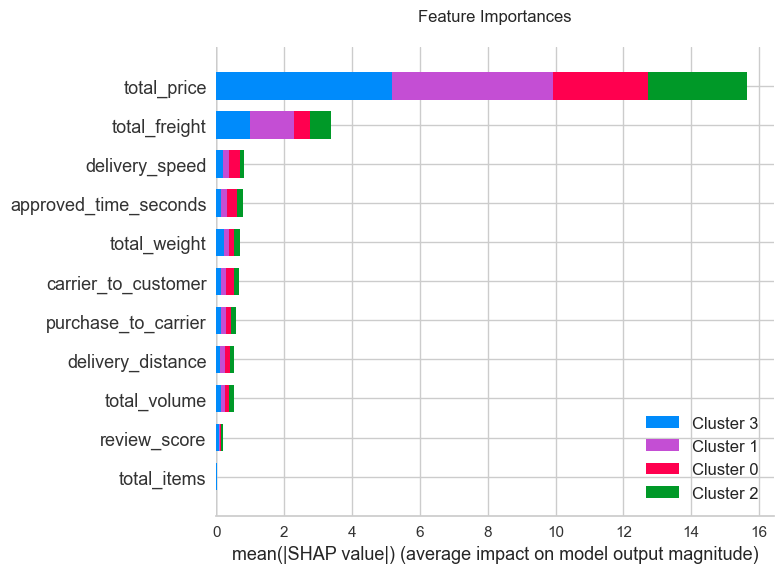

In [125]:
plt.title('Feature Importances\n')
shap.summary_plot(
    shap_values=shap_val,
    features=X.values,
    plot_type='bar',
    class_names=['Cluster 0','Cluster 1','Cluster 2','Cluster 3'],
    feature_names=X.columns
)

Based on feature importances quantified by SHAP value or Shapley, the two most important features are total_price and total_freight. Meanwhile, other features seem to have insignificant impacts on model output as shown above. This result does not imply the correlation nor the relationship of the features to the output, merely the significance power of the features to the output itself.

> ## **Explainable Plot** (EDA 3)

> Cluster Characterization Based on SHAP Values

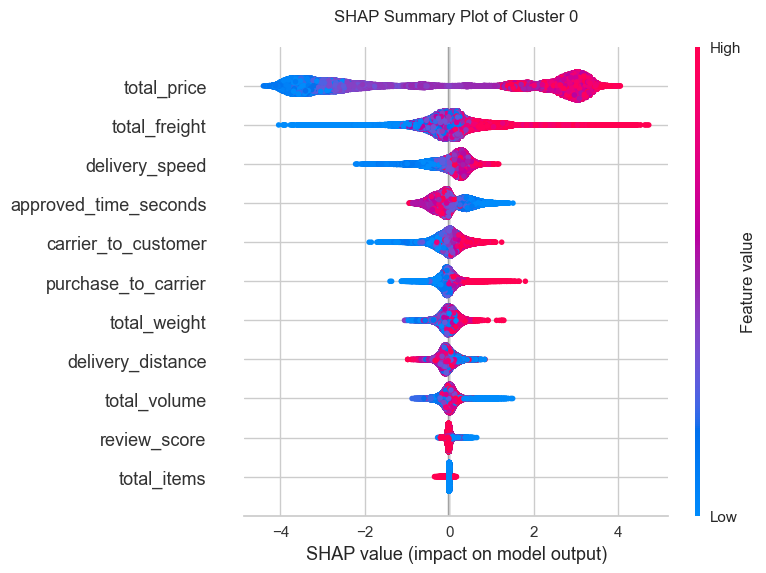

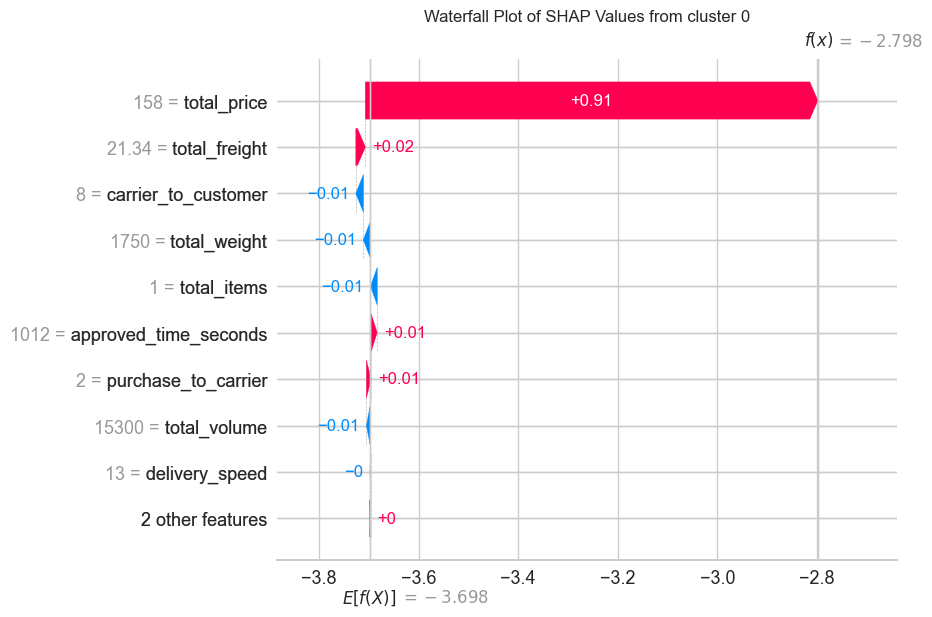

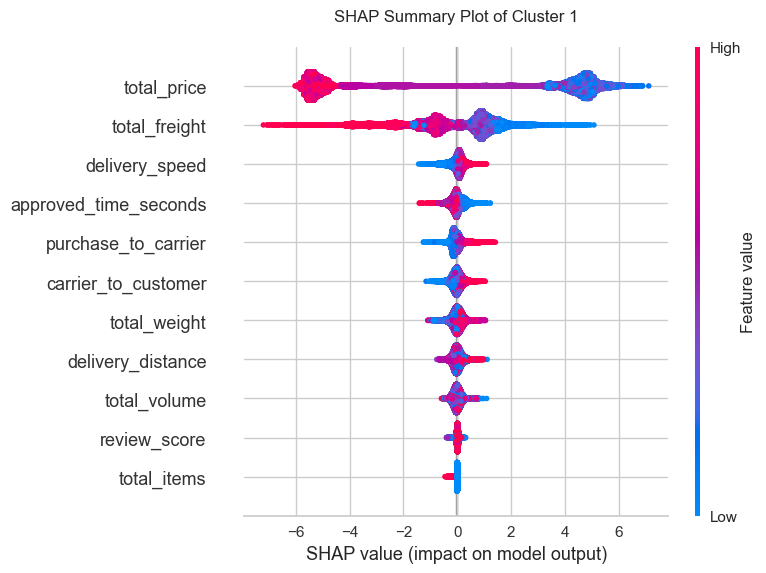

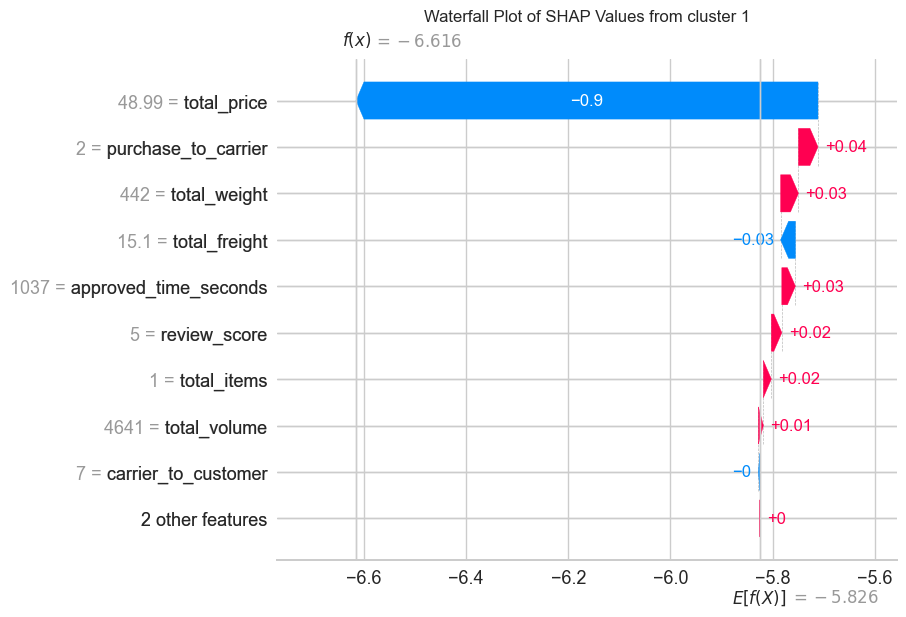

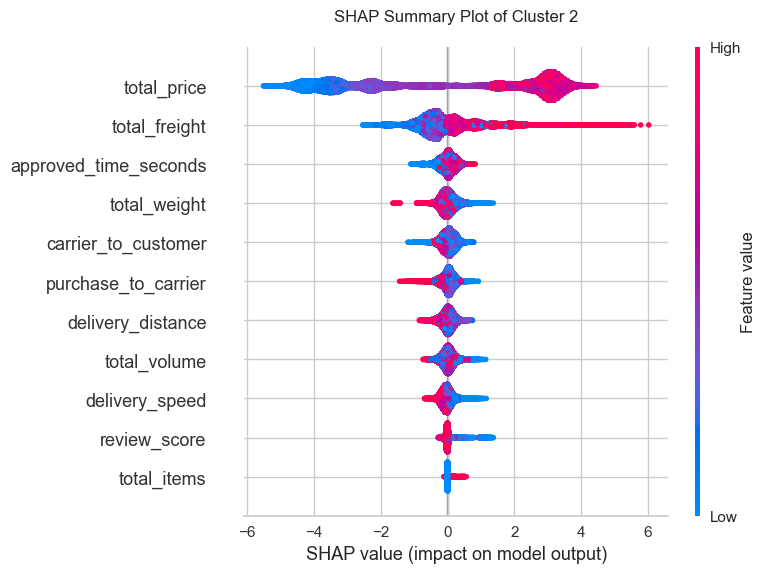

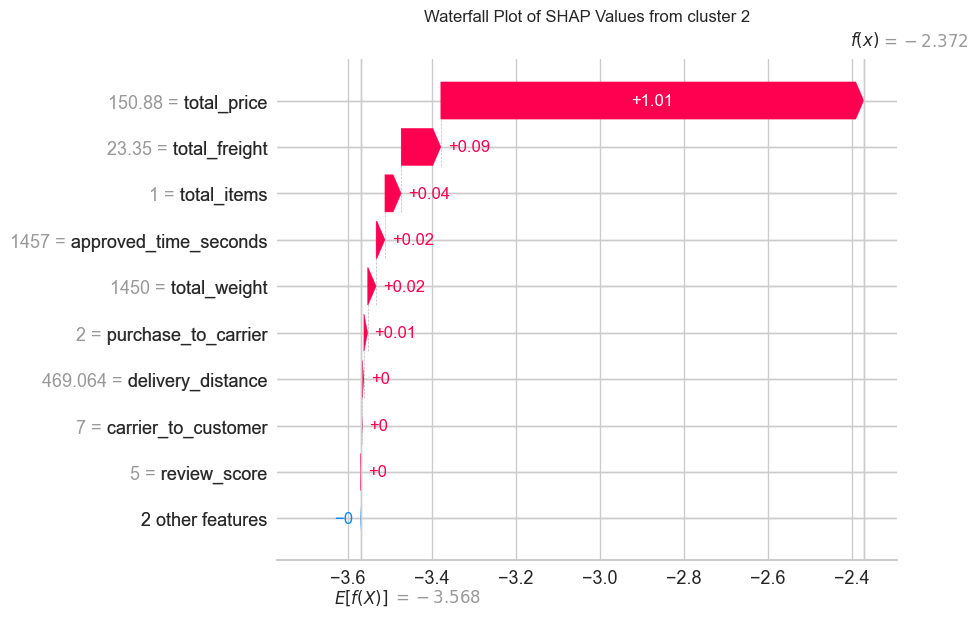

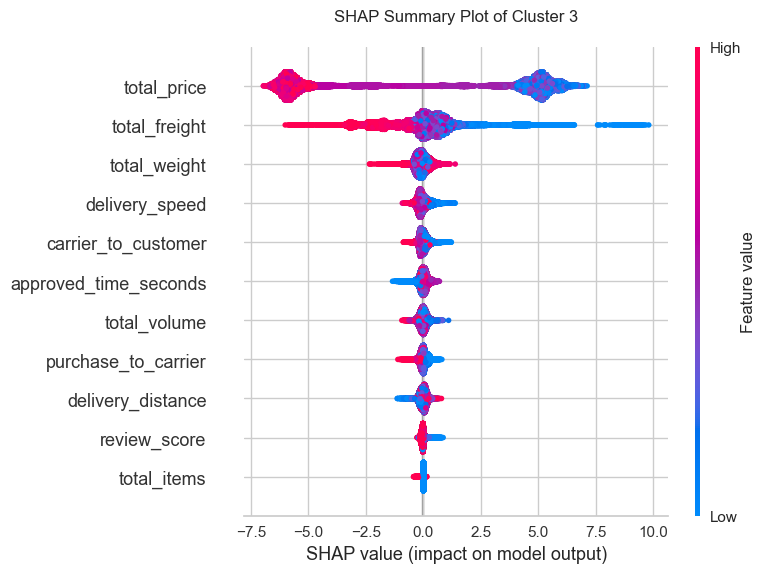

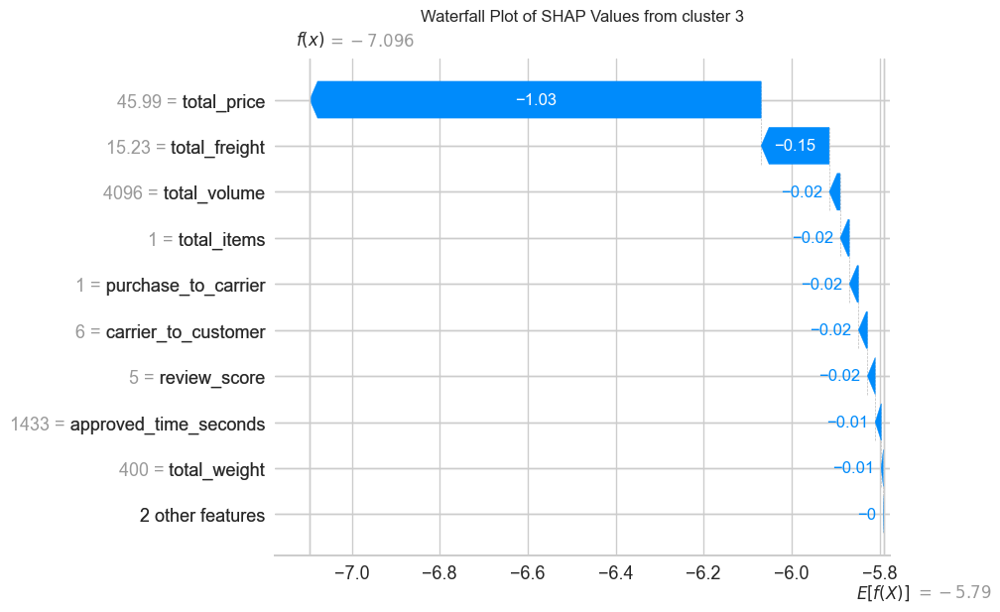

In [296]:
total_shap_list = []

for i in range(4):
    total_shap = (
        pd.DataFrame(shap_val[0]).iloc[df[df['cluster']==i].index].sum() +\
            pd.DataFrame(shap_val[1]).iloc[df[df['cluster']==i].index].sum() +\
                pd.DataFrame(shap_val[2]).iloc[df[df['cluster']==i].index].sum() +\
                    pd.DataFrame(shap_val[2]).iloc[df[df['cluster']==i].index].sum()
    )

    total_shap_list.append(total_shap/92600)

for i in range(4):
    plt.title(f'SHAP Summary Plot of Cluster {i}\n')
    shap.summary_plot(
        shap_values=shap_val[i],
        features=X.values,
        feature_names=X.columns,
    )

    plt.title(f'Waterfall Plot of SHAP Values from cluster {i}')
    shap.waterfall_plot(
        shap.Explanation(
            values=total_shap_list[i].values,
            base_values=expected_val[i],
            data=df[df['cluster']==i].median().values,
            feature_names=df.drop('cluster',axis=1).columns.to_list()
        )
    )

From the Summary plots we found above:

1. As for cluster 0 and 2, the terms apply with the higher the value of total_price, the higher the SHAP value. It means that when the value of total_price tends to go higher, the more contributions it gives positively to the model output when predicting an observation as cluster 0 or 2. As for total_freight feature, the contributions would go oppositely in a way of the model would predict the observation as cluster other than 0 or 2. It would go in the similar way when it comes to the explanation of cluster 0 and 2, the difference is only on the widespread of SHAP values where cluster 0 have broader values than cluster 2. It would leads to other insights that could not be interpreted by the SHAP values.

1. As for cluster 1 and 3, the contributions of total_price feature would behave differently from cluster 0 and 2. As we know before that cluster 1 and 3 belong to people who spend less rather than cluster 0 and 2. That's why, when the value of total_price goes up, the SHAP value will tend to go low. It means the total_price would give negative contributions to model output when it tries to predict observation as cluster 1 or 3. As for total_freight, it also works inversely to the way of contribution the SHAP value gives. The differences of the two cluster only on the range of the SHAP values accross all observations. This could not be explained by the SHAP value. 

From the findings, we can conclude that the cluster label is align with the explanation of SHAP values, those are:

1. Class 2 : High Monetary & Low Recency
- Recent and high spending customer
- Still fresh with high trust to spend more
- This type of customer is the customer we want to retain it is our best customer

2. Class 0 : High Monetary & High Recency
- One of our old customer
- But have the trust to spend high
- Type of customer that goes through our e-commerce when they want to buy high value products

3. Class 3 : Low Monetary & Low Recency
- Fresh customers
- Spends not as much as class 0 and class 2
- Type of customer that loves shopping and buying small things

4. Class 1 : Low Monetary & High Recency
- Customers that are trying out our e-commerce
- Had a low spending
- The type of customer that tries our e-commerce and may end up not liking it

> Total Price and Freight

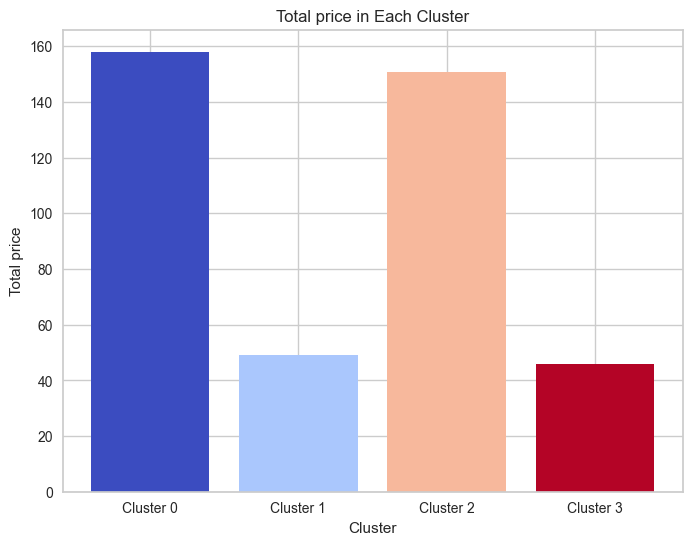

In [132]:
# Grouping the DataFrame by 'cluster' and calculating the mean of 'total_price'
mean_price = df.groupby('cluster')['total_price'].median()

# Assigning categorical labels to each cluster
cluster_labels = ['Cluster ' + str(c) for c in mean_price.index]

# Generating a color gradient for the plot
colors = plt.cm.coolwarm(np.linspace(0, 1, len(mean_price)))

# Creating the cool plot with customized colors and discrete x-axis
plt.figure(figsize=(8, 6))
plt.bar(cluster_labels, mean_price, color=colors)

# Adding labels and title
plt.xlabel('Cluster')
plt.ylabel('Total price')
plt.title('Total price in Each Cluster')

plt.show()

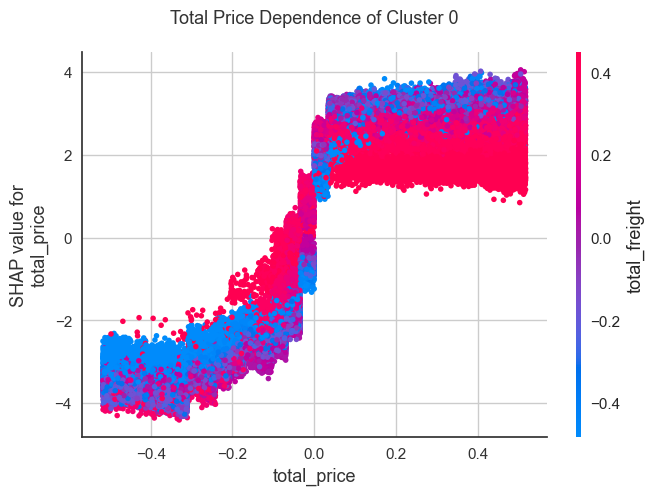

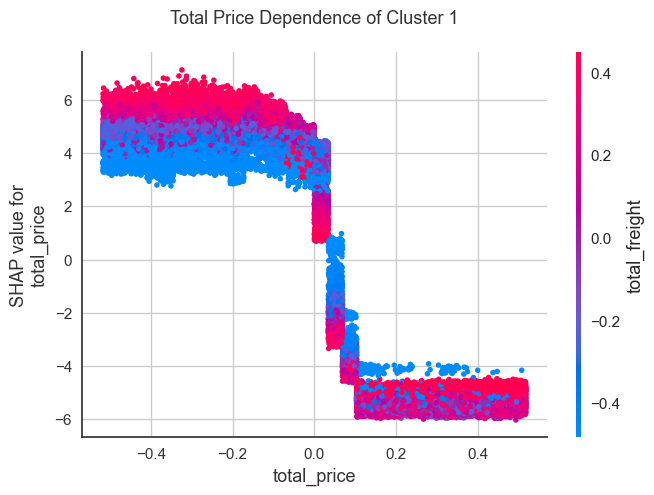

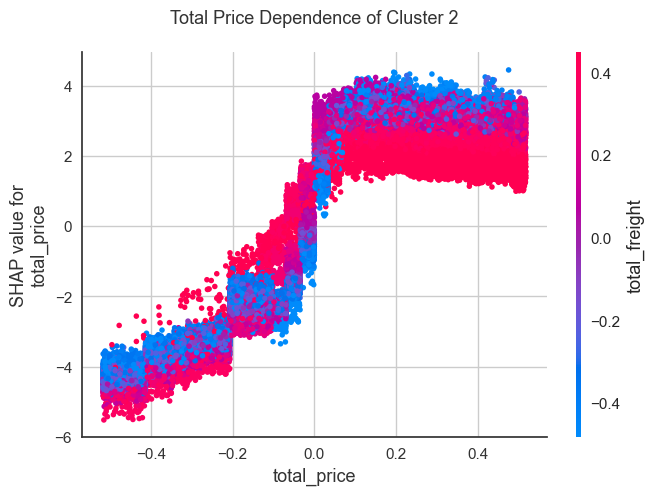

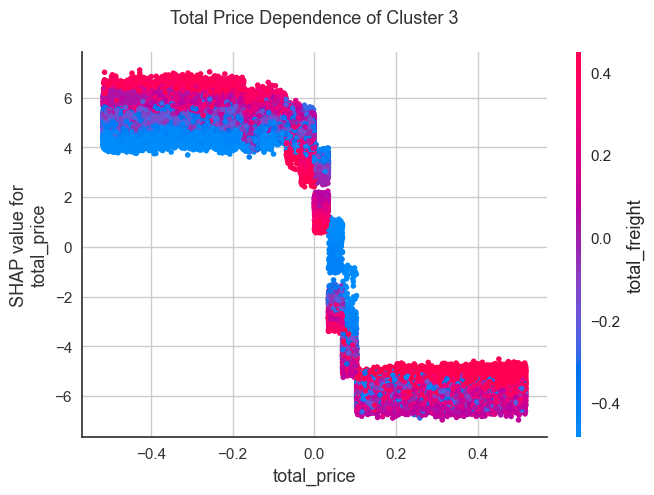

In [128]:
for i in range(4):
    shap.dependence_plot(
        ind=0,
        shap_values=shap_val[i],
        features=X.values,
        feature_names=X.columns,
        x_jitter=1,
        title=f'Total Price Dependence of Cluster {i}\n'
    )

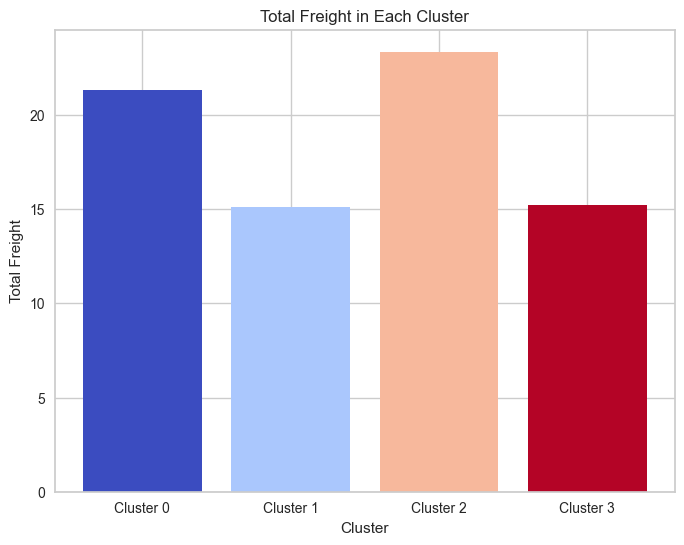

In [133]:
# Grouping the DataFrame by 'cluster' and calculating the mean of 'total_freight'
mean_freight = df.groupby('cluster')['total_freight'].median()

# Assigning categorical labels to each cluster
cluster_labels = ['Cluster ' + str(c) for c in mean_freight.index]

# Generating a color gradient for the plot
colors = plt.cm.coolwarm(np.linspace(0, 1, len(mean_freight)))

# Creating the cool plot with customized colors and discrete x-axis
plt.figure(figsize=(8, 6))
plt.bar(cluster_labels, mean_freight, color=colors)

# Adding labels and title
plt.xlabel('Cluster')
plt.ylabel('Total Freight')
plt.title('Total Freight in Each Cluster')

plt.show()

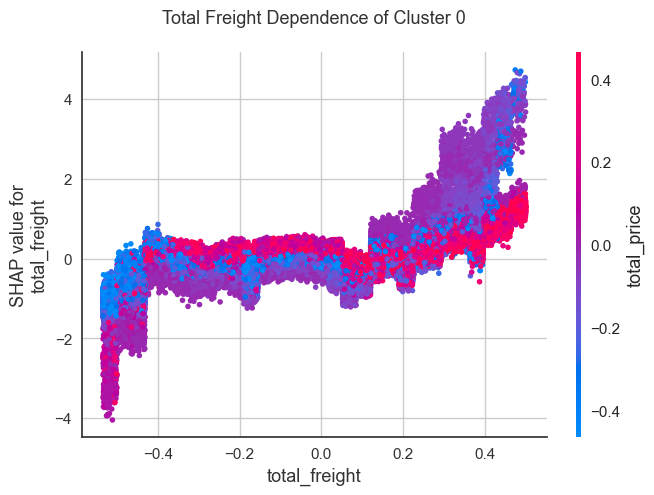

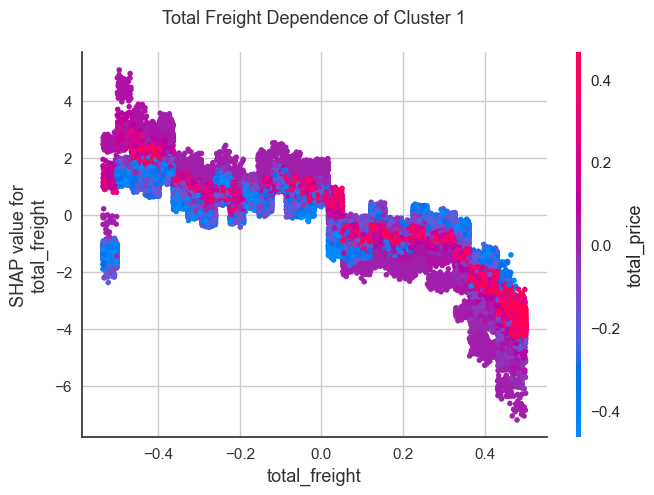

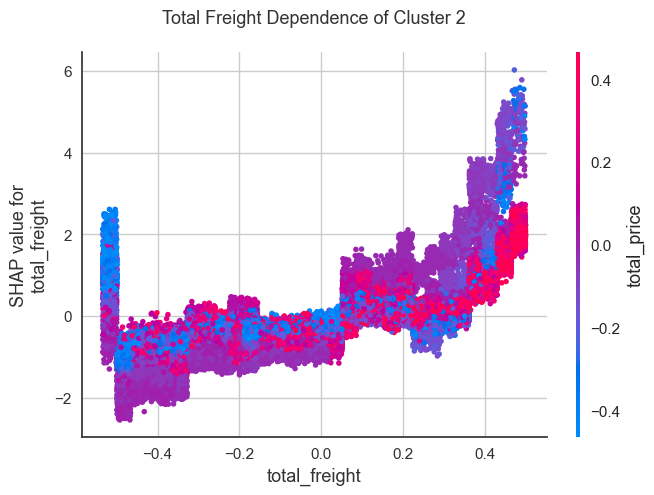

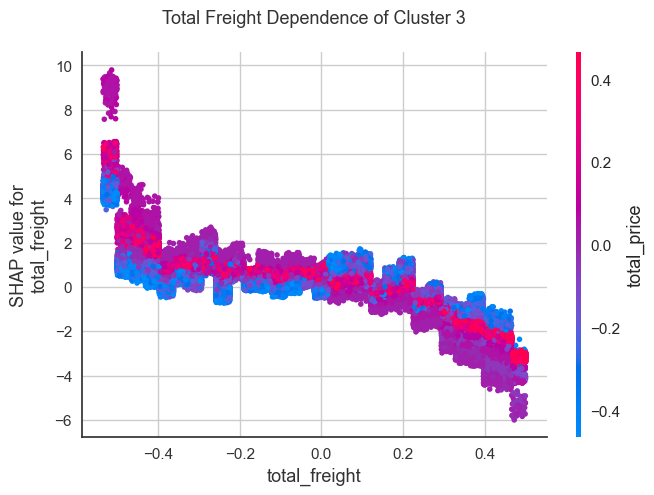

In [134]:
for i in range(4):
    shap.dependence_plot(
        ind=1,
        shap_values=shap_val[i],
        features=X.values,
        feature_names=X.columns,
        x_jitter=1,
        title=f'Total Freight Dependence of Cluster {i}\n'
    )

From the plots above, it can be seen that in terms of price and freight value, if a class with high-monetary status will also have a higher value too, but it should also be noted that freight value is a variable that determined by the Olist, which means the clusters of 0 and 2 have the same freight value relatively higher compared to clusters 1 and 3, this could be caused by many factors, it could be distance, weight , or spending routines.

> Number of Items

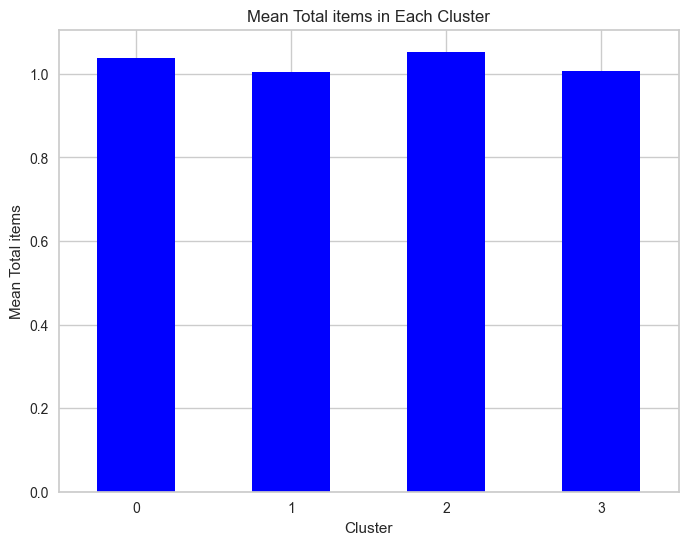

In [137]:
# Grouping the DataFrame by 'cluster' and calculating the mean of 'total_price'
mean_prices = df.groupby('cluster')['total_items'].mean()

# Plotting the mean prices for each cluster
plt.figure(figsize=(8, 6))
mean_prices.plot(kind='bar', color='blue')
plt.xlabel('Cluster')
plt.ylabel('Mean Total items')
plt.title('Mean Total items in Each Cluster')
plt.xticks(rotation=0)
plt.show()

From the plot above, it can be seen that the number of items purchased by the customer does not have a different significance, this is also supported by the model where in the feature importance, this total item has the lowest values compared to the other features.

> Dimensions

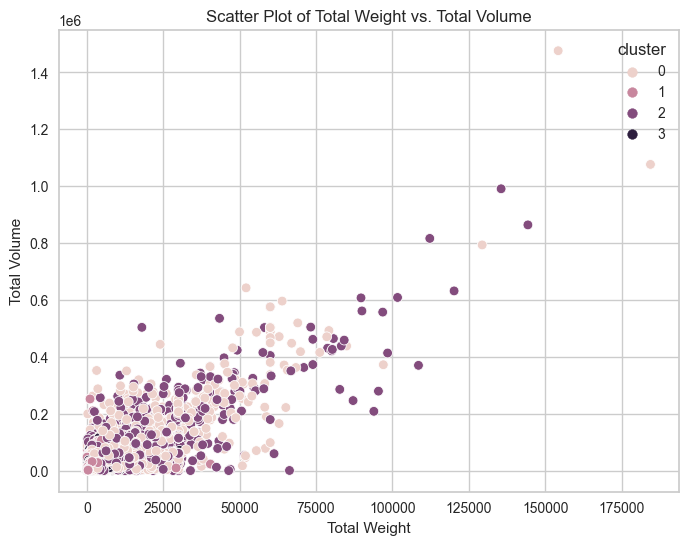

In [138]:
# Creating the scatter plot with hue based on 'cluster'
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='total_weight', y='total_volume', hue='cluster')
plt.xlabel('Total Weight')
plt.ylabel('Total Volume')
plt.title('Scatter Plot of Total Weight vs. Total Volume')
plt.show()

Based on the scatterplot above, it can be seen that the correlation between weight and volume has a positive correlation, it means that every heavy item purchased by the customer has a large volume as well, and it can be seen from the furthest plot, that on average it belongs to clusters 0 and 2.

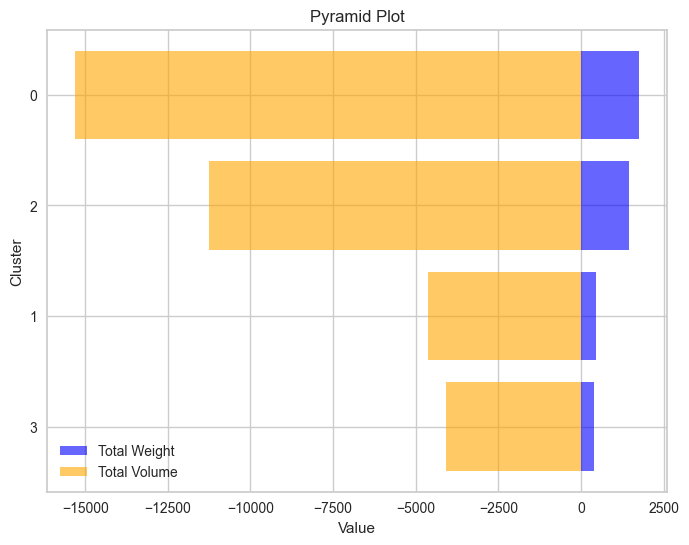

In [140]:
# Grouping the DataFrame by 'cluster' and calculating the sum of 'total_weight' and 'total_volume'
sum_weights = df.groupby('cluster')['total_weight'].median()
sum_volumes = df.groupby('cluster')['total_volume'].median()

# Sorting the clusters based on the sum of 'total_weight'
sorted_clusters = sum_weights.sort_values().index

# Creating the population pyramid plot
fig, ax = plt.subplots(figsize=(8, 6))

# Left bar plot (total_weight)
ax.barh(range(len(sorted_clusters)), sum_weights[sorted_clusters], align='center', color='blue', alpha=0.6)
# Right bar plot (total_volume)
ax.barh(range(len(sorted_clusters)), -sum_volumes[sorted_clusters], align='center', color='orange', alpha=0.6)

# Adjusting y-axis labels and ticks
ax.set_yticks(range(len(sorted_clusters)))
ax.set_yticklabels(sorted_clusters)

# Adding legend and axis labels
ax.legend(['Total Weight', 'Total Volume'])
ax.set_xlabel('Value')
ax.set_ylabel('Cluster')

# Setting plot title
ax.set_title('Pyramid Plot')

plt.show()

Based on the plot above, it can be seen more clearly that clusters 0 and 2 indeed have a larger dimension in making purchases compared to clusters 1 and 3.

In [141]:
# Grouping the DataFrame by 'cluster' and calculating the mean, median, min, and max of 'total_freight'
summary_df = df.groupby('cluster')['total_weight'].agg(['mean', 'median', 'min', 'max'])

# Adding colors to the summary DataFrame based on conditions
summary_df_styled = summary_df.style \
    .background_gradient(subset=['mean', 'median', 'min', 'max'], cmap='coolwarm') \
    .format("{:.2f}")  # Format numeric values with 2 decimal places

# Displaying the styled summary DataFrame
summary_df_styled

,mean,median,min,max
cluster,,,,
0,4241.71,1750.00,50.00,184400.00
1,980.76,442.00,50.00,40425.00
2,3794.30,1450.00,0.00,144300.00
3,855.87,400.00,50.00,40425.00


In [142]:
# Grouping the DataFrame by 'cluster' and calculating the mean, median, min, and max of 'total_freight'
summary_df = df.groupby('cluster')['total_volume'].agg(['mean', 'median', 'min', 'max'])

# Adding colors to the summary DataFrame based on conditions
summary_df_styled = summary_df.style \
    .background_gradient(subset=['mean', 'median', 'min', 'max'], cmap='coolwarm') \
    .format("{:.2f}")  # Format numeric values with 2 decimal places

# Displaying the styled summary DataFrame
summary_df_styled

,mean,median,min,max
cluster,,,,
0,28995.48,15300.00,288.00,1476000.00
1,9814.76,4641.00,352.00,252402.00
2,24759.82,11250.00,168.00,990876.00
3,8283.42,4096.00,352.00,232848.00


> Review Scores

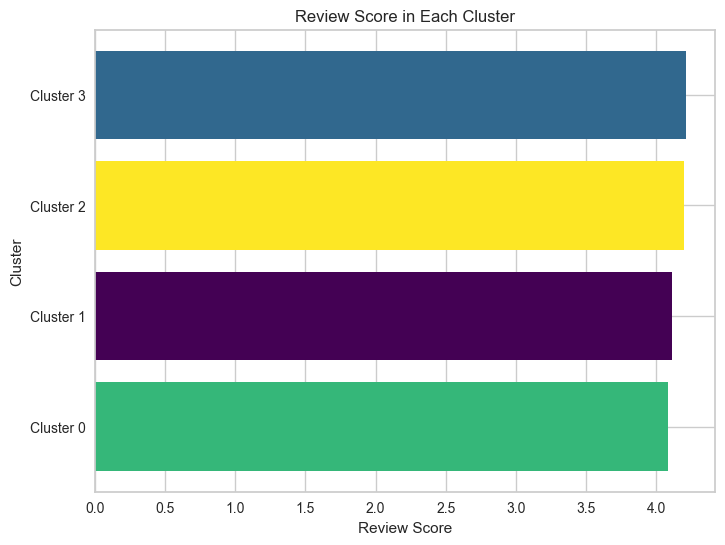

In [144]:
# Grouping the DataFrame by 'cluster' and calculating the mean of 'review_score'
mean_scores = df.groupby('cluster')['review_score'].mean()

# Assigning categorical labels to each cluster
cluster_labels = ['Cluster ' + str(c) for c in mean_scores.index]

# Sorting the clusters based on mean review scores
sorted_clusters = mean_scores.sort_values().index

# Creating a color palette for the bars
colors = plt.cm.viridis(np.linspace(0, 1, len(mean_scores)))

# Creating the horizontal bar plot with sorted clusters and colored bars
plt.figure(figsize=(8, 6))
plt.barh(cluster_labels, mean_scores[sorted_clusters], color=colors[sorted_clusters])

# Adding labels and title
plt.xlabel('Review Score')
plt.ylabel('Cluster')
plt.title('Review Score in Each Cluster')

plt.show()

For the review scores, there is no significant correlation, where clusters 0, 1, 2, 3 have quite varied reviews, and this is a subjective matter. Because sometimes it could be happen when the cluster 2 is having a trouble with our e-commerce service, but the cluster 1 is quite satisfied with our service

> Approval Time

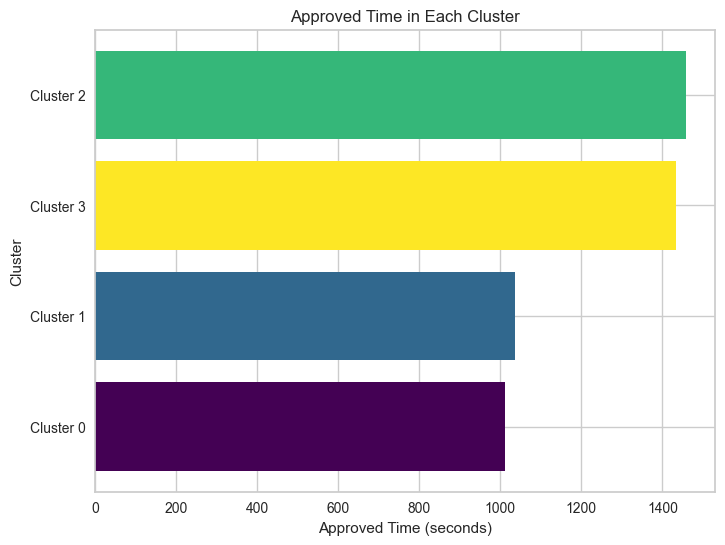

In [145]:
# Grouping the DataFrame by 'cluster' and calculating the mean of 'approved_time_seconds'
mean_times = df.groupby('cluster')['approved_time_seconds'].median()

# Assigning categorical labels to each cluster
cluster_labels = ['Cluster ' + str(c) for c in mean_times.index]

# Sorting the clusters based on mean approved time
sorted_clusters = mean_times.sort_values().index

# Converting sorted clusters index to a list of integers
sorted_clusters_list = sorted_clusters.tolist()

# Creating a color palette for the bars
colors = plt.cm.viridis(np.linspace(0, 1, len(mean_times)))

# Creating the horizontal bar plot with sorted clusters and colored bars
plt.figure(figsize=(8, 6))
plt.barh(range(len(sorted_clusters)), mean_times[sorted_clusters], color=colors[sorted_clusters_list])

# Adding cluster labels to the y-axis
plt.yticks(range(len(sorted_clusters)), [cluster_labels[i] for i in sorted_clusters_list])

# Adding labels and title
plt.xlabel('Approved Time (seconds)')
plt.ylabel('Cluster')
plt.title('Approved Time in Each Cluster')

plt.show()

Based on the barplot above, cluster 2 and cluster 3 have relatively longer approved time values. With clusters 2 and 3 as the clusters that have a small recency values, it means that the performance of the approved time is getting slower compared to the old transactions.

> Distance

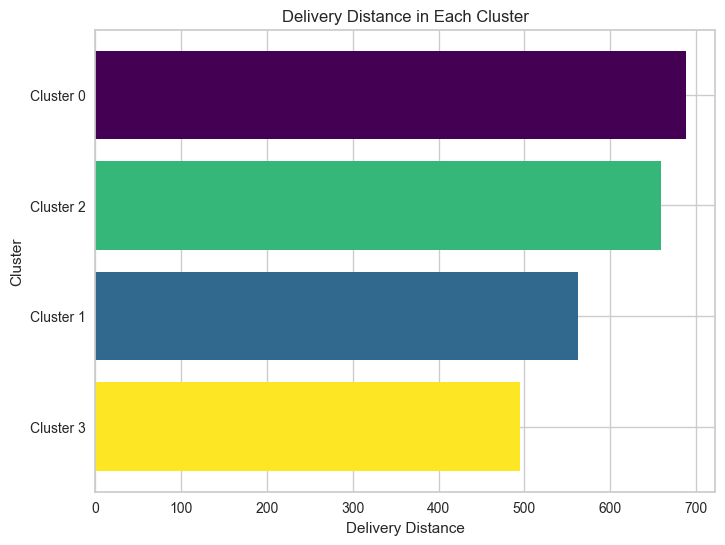

In [146]:
# Grouping the DataFrame by 'cluster' and calculating the mean of 'delivery_distance'
mean_distances = df.groupby('cluster')['delivery_distance'].mean()

# Assigning categorical labels to each cluster
cluster_labels = ['Cluster ' + str(c) for c in mean_distances.index]

# Sorting the clusters based on mean delivery distance
sorted_clusters = mean_distances.sort_values().index

# Creating a color palette for the bars
colors = plt.cm.viridis(np.linspace(0, 1, len(mean_distances)))

# Creating the horizontal bar plot with sorted clusters and colored bars
plt.figure(figsize=(8, 6))
plt.barh(range(len(sorted_clusters)), mean_distances[sorted_clusters], color=colors[sorted_clusters])

# Adding cluster labels to the y-axis
plt.yticks(range(len(sorted_clusters)), [cluster_labels[i] for i in sorted_clusters])

# Adding labels and title
plt.xlabel('Delivery Distance')
plt.ylabel('Cluster')
plt.title('Delivery Distance in Each Cluster')

plt.show()

From the barplot above, it shows that delivery distance affects the shopping patterns of customers, which is in accordance with the results of the cluster, where cluster 0 is a customer who lives relatively farther than the other clusters, according to the analysis, cluster 0 has a behavior where he rarely buys goods, but once he making a purchase he will spend more.

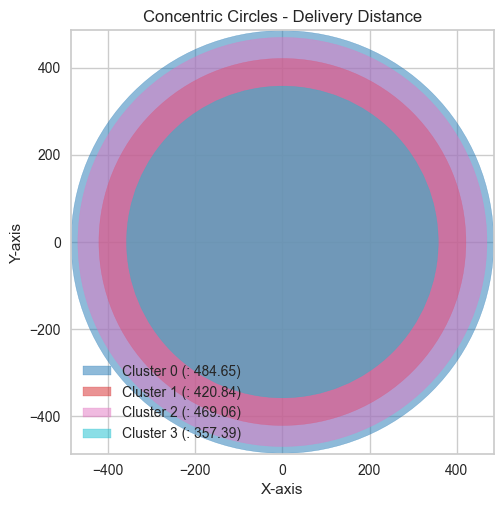

In [147]:
# Grouping the DataFrame by 'cluster' and calculating the median of 'delivery_distance'
summary_df = df.groupby('cluster')['delivery_distance'].median()

# Create a new figure and axes
fig, ax = plt.subplots()

# Define the center coordinates
center = (0, 0)

# Define the radii of the concentric circles based on the median delivery distance
radii = summary_df.values

# Define the colors for the circles based on the cluster
num_clusters = len(summary_df)
colors = plt.cm.tab10(np.linspace(0, 1, num_clusters))

# Plot each circle with color
for radius, color in zip(radii, colors):
    circle = plt.Circle(center, radius, color=color, alpha=0.5)
    ax.add_artist(circle)

# Set the aspect ratio to 'equal' for circular shape
ax.set_aspect('equal')

# Set the x and y limits based on the maximum delivery distance
max_distance = summary_df.max()
ax.set_xlim(-max_distance - 1, max_distance + 1)
ax.set_ylim(-max_distance - 1, max_distance + 1)

# Create a legend for the clusters
legend_labels = [f'Cluster {i} (: {radius:.2f})' for i, radius in enumerate(radii)]
ax.legend(legend_labels, loc='lower left')

# Set labels and title
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_title('Concentric Circles - Delivery Distance')

# Display the plot
plt.show()

It can be seen that the radius of cluster 0 is quite far

> Delivery Speed

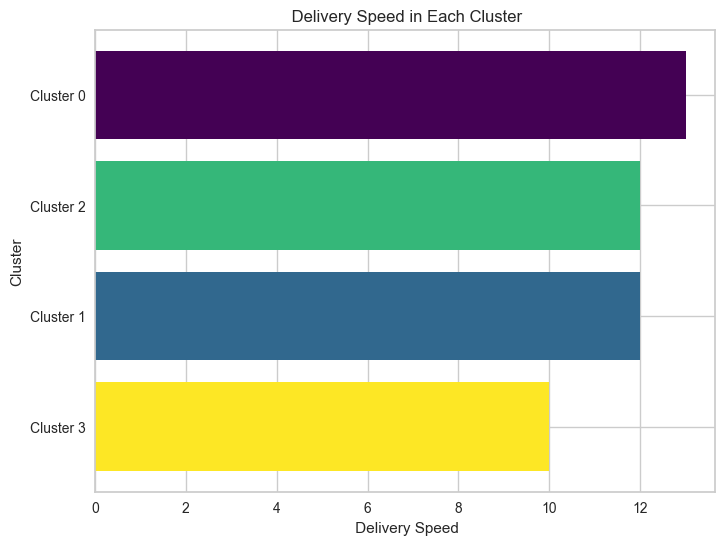

In [148]:
# Grouping the DataFrame by 'cluster' and calculating the mean of 'delivery_speed'
mean_speeds = df.groupby('cluster')['delivery_speed'].median()

# Assigning categorical labels to each cluster
cluster_labels = ['Cluster ' + str(c) for c in mean_speeds.index]

# Sorting the clusters based on mean delivery speed
sorted_clusters = mean_speeds.sort_values().index

# Creating a color palette for the bars
colors = plt.cm.viridis(np.linspace(0, 1, len(mean_speeds)))

# Creating the horizontal bar plot with sorted clusters and colored bars
plt.figure(figsize=(8, 6))
plt.barh(range(len(sorted_clusters)), mean_speeds[sorted_clusters], color=colors[sorted_clusters])

# Adding cluster labels to the y-axis
plt.yticks(range(len(sorted_clusters)), [cluster_labels[i] for i in sorted_clusters])

# Adding labels and title
plt.xlabel(' Delivery Speed')
plt.ylabel('Cluster')
plt.title(' Delivery Speed in Each Cluster')

plt.show()

# Conclusion & Actionable Recommendation

## Conclusion

- There is a growing trend on e-commerce sales in Brazil when the total amount sold between 2017 to 2018 is increased to 137.04%. The highest value sold in history was on November 2017 with 1001.9K just for 1 month. This could be happen because the blackfriday event is held on that month, where each sellers probably gives a massive discount that only happens for 1 day.

- The biggest mean price by customer state is Paraiba with R$215, but the amount price tend to be low with just R$113.40K. Inversely proportional to Sao Paulo where the mean price is lowest, but had the biggest amount price comparing to another states with R$5172.26K. This is how total sales is concentraded in Brazil.

- The Best states to do transaction in Brazil is Sao Paulo, where this state dominates the total orders of all Brazilian states by 42.8% from total.

- The credit card is the most preferred payment choice by customers with 73.99% from total. The evolution of payment types with credit card is also increasing rapidly from January 2017 to May 2018. Many customers also preffered to take 1 month payment installments. This indicates that payment with a credit card, many customers do not need to immediately pay in full for the products they bought. They can pay it with installments they preffered and can be paid at the end of the periods. Vouchers can also be used for payments, with this, customers can get discounts for the products that they bought and add more products to buy. This is how payment types can take influence on e-commerce.

> ### Clustering Result

Based on the clusters, we conclude that it is divided by 4 groups of customer, which is:

1. Class 2 : The best customer, spend more on a recent timeline
2. Class 0 : Type of customer with trust on spending high value products, but may not choose this e-commerce on low spending
3. Class 3 : Type of customer that loves shopping for small things
4. Class 1 : Type of customer that are potentially high to churn

And based on the clustering we derived to continue on the classification, by asssigning the cluster as the target

> ### Classification Result

In [149]:
print('Classification Report Tuned : \n', report_tuned)

Classification Report Tuned : 
               precision    recall  f1-score   support

           0       0.74      0.76      0.75      4517
           1       0.79      0.86      0.82      4729
           2       0.77      0.74      0.75      4731
           3       0.84      0.76      0.80      4543

    accuracy                           0.78     18520
   macro avg       0.78      0.78      0.78     18520
weighted avg       0.78      0.78      0.78     18520



The final model that is used are shown above, where it shows the classifiation report, and based on the classification report, we can conclude that:

1. From the prediction result (recall), we can conclude that:
- Cluster 0 was correctly predicted about 76%
- Cluster 1 was correctly predicted about 87%
- Cluster 2 was correctly predicted about 74%
- Cluster 3 was correctly predicted about 75%

2. From the actual result (precision), we can conclude that:
- Cluster 0 was correctly predicted about 74%
- Cluster 1 was correctly predicted about 78%
- Cluster 2 was correctly predicted about 77%
- Cluster 3 was correctly predicted about 85%


## Actionable Recommendation

> ### Model Limitation

Model limitation is a condition where the model randomly predicted the observation and probably missclassify the truth labels. In this section, we try to find out the predictions that are probably missclasified by the model based on SHAP values by filtering the observations with insignificant SHAP values of total_price and total_freight values.

> Cluster 0 randomly predicted

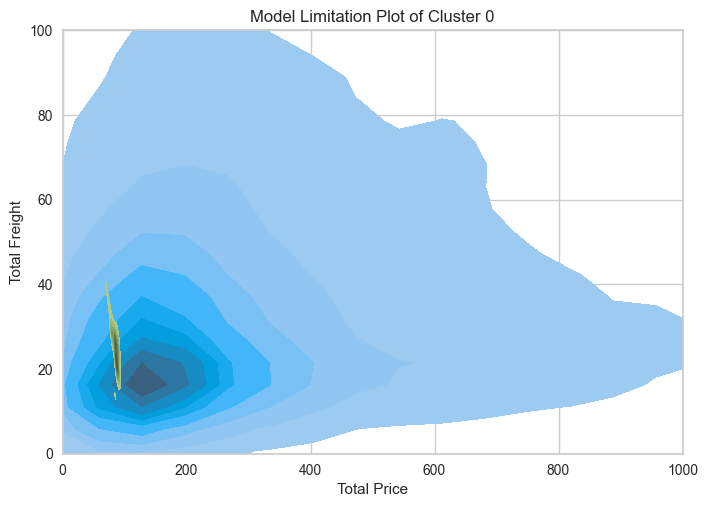

In [169]:
df = df.reset_index().drop('customer_unique_id',axis=1)

cluster_0_edge = df[
    ((shap_val[0][:,0]<1) & (shap_val[0][:,0]>-1)) & 
    ((shap_val[0][:,1]<2) & (shap_val[0][:,1]>-2)) &
    (df['cluster']==0)
]

for i in [df[df['cluster']==0],cluster_0_edge]:
    sns.kdeplot(
        data=i,
        x='total_price',
        y='total_freight',
        fill=True
    )
    
plt.title('Model Limitation Plot of Cluster 0')
plt.xlabel('Total Price'), plt.ylabel('Total Freight')
plt.xlim([0,1000]), plt.ylim([0,100])
plt.show()

for i in cluster_0_edge.head(3).index:
    display(
        shap.force_plot(
        base_value=expected_val[df.iloc[i].cluster.astype(int)],
        shap_values=shap_val[df.iloc[i].cluster.astype(int)][i], 
        features=df.drop('cluster',axis=1).values[i],
        feature_names=X.columns,
    )
    )

> Cluster 1 randomly predicted

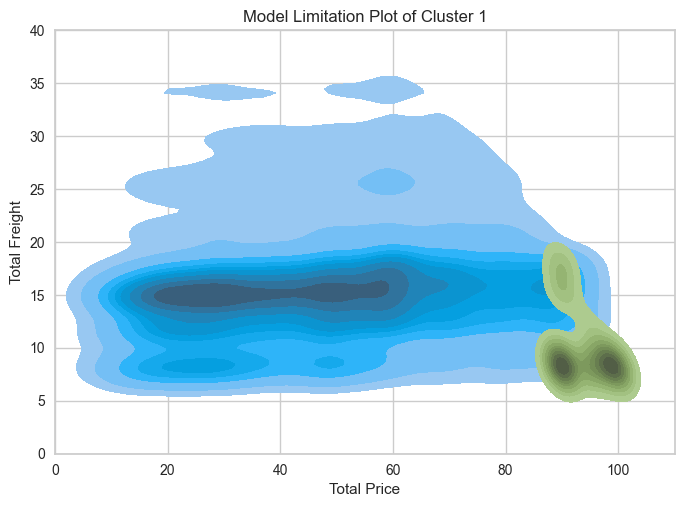

In [170]:
cluster_1_edge = df[
    (shap_val[1][:,0]<3.5) & (shap_val[1][:,0]>-3.5) &
    (shap_val[1][:,1]<5) & (shap_val[1][:,1]>-5) &
    (df['cluster']==1)
]

for i in [df[df['cluster']==1],cluster_1_edge]:
    sns.kdeplot(
        data=i,
        x='total_price',
        y='total_freight',
        fill=True
    )
    
plt.title('Model Limitation Plot of Cluster 1')
plt.xlabel('Total Price'), plt.ylabel('Total Freight')
plt.xlim([0,110]), plt.ylim([0,40])
plt.show()

for i in cluster_1_edge.head(3).index:
    display(
        shap.force_plot(
        base_value=expected_val[df.iloc[i].cluster.astype(int)],
        shap_values=shap_val[df.iloc[i].cluster.astype(int)][i], 
        features=df.drop('cluster',axis=1).values[i],
        feature_names=X.columns,
    )
    )

> Cluster 2 randomly predicted

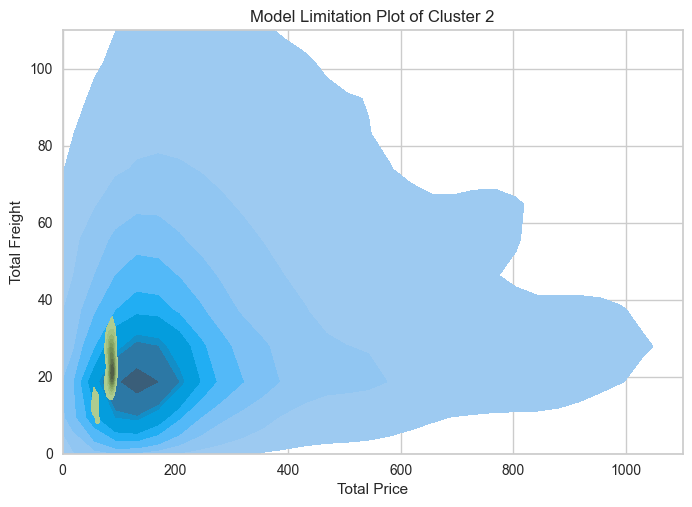

In [175]:
cluster_2_edge = df[
    (shap_val[2][:,0]<1.5) & (shap_val[2][:,0]>-1.5) &
    (shap_val[2][:,1]<1.5) & (shap_val[2][:,1]>-1.5) &
    (df['cluster']==2)
]

for i in [df[df['cluster']==2],cluster_2_edge]:
    sns.kdeplot(
        data=i,
        x='total_price',
        y='total_freight',
        fill=True
    )
    
plt.title('Model Limitation Plot of Cluster 2')
plt.xlabel('Total Price'), plt.ylabel('Total Freight')
plt.xlim([0,1100]), plt.ylim([0,110])
plt.show()

for i in cluster_2_edge.head(3).index:
    display(
        shap.force_plot(
        base_value=expected_val[df.iloc[i].cluster.astype(int)],
        shap_values=shap_val[df.iloc[i].cluster.astype(int)][i], 
        features=df.drop('cluster',axis=1).values[i],
        feature_names=X.columns,
    )
    )

> Cluster 3 randomly predicted

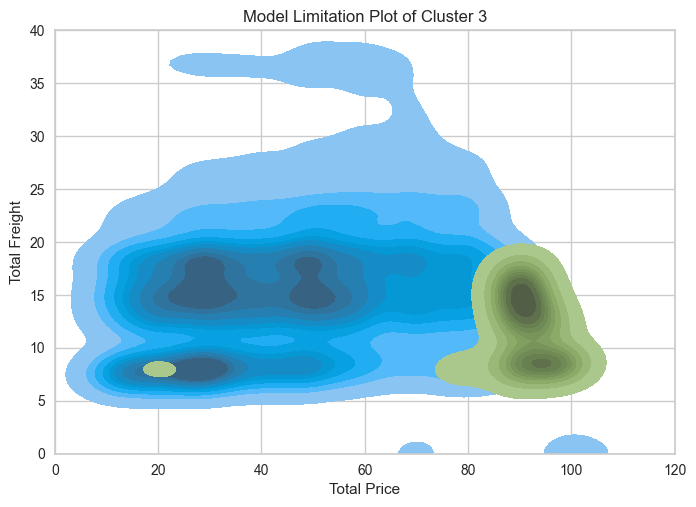

In [176]:
cluster_3_edge = df[
    (shap_val[3][:,0]<4) & (shap_val[3][:,0]>-4) &
    (shap_val[3][:,1]<6) & (shap_val[3][:,1]>-6) &
    (df['cluster']==3)
]

for i in [df[df['cluster']==3],cluster_3_edge]:
    sns.kdeplot(
        data=i,
        x='total_price',
        y='total_freight',
        fill=True
    )

plt.title('Model Limitation Plot of Cluster 3')
plt.xlabel('Total Price'), plt.ylabel('Total Freight')
plt.xlim([0,120]), plt.ylim([0,40])
plt.show()

for i in cluster_3_edge.head(3).index:
    display(
        shap.force_plot(
        base_value=expected_val[df.iloc[i].cluster.astype(int)],
        shap_values=shap_val[df.iloc[i].cluster.astype(int)][i], 
        features=df.drop('cluster',axis=1).values[i],
        feature_names=X.columns,
    )
    )

> ### Recommendation on model performance

1. Additional model that has not been used:
- For clustering: Agglomerative Hierarchy Clustering, DBscan, Gaussian Mixture Model, BIRCH
- For Classification: VotingClassifer, StackingClassifier, SVC, Naive Bayes, KNN

2. Improvement on dataset, more explainable features, such as demographic of customer.

3. More modelling or solution, such as Feature Sales (Time-Series Analysis), Customer Sentiment Analysis, Recommendation System

> ### Recommendation for the business problem

*Class 2: Best Customer*

Goal: Retain & if possible increase<br>
How ? 
- Giving promotion on all items include the lower or higher value products.
- Provide points and rewards to incentivize repeat purchases.

*Class 0: Old High-Value Customer:*

Goal: Draw Interest <br>
How ?
- Focus on building customer retention by giving discount on high value items.
- Provide excellent customer service and ensure a seamless shopping experience for their high-value transactions.
- On-time delivery guarantee, late delivery will result in a free shipment in the next purchase.
- Create an appealing and user-friendly experience for the customer. 
- Give a better shipping services, by live tracking of shipment. 

*Class 3: Fresh Shopper:*

Goal: Increase Spending <br>
How ? 
- Implement strategies to increase their average order value by offering bundle deals.
- Give a first-timer promotion like free shipping for a whole month. 
- Provide a detailed purchasing process which with easy to use shopping cart and multiple payment option. 
- Show product recommendation by previous purchase. 

*Class 1: Potential Churners:*

Goal: Draw Interest & Increase Spending <br>
How ? 
- Customer re-enggagement by giving an old user promotion to draw back to use the e-commerce.
- Collect feedback from these customers to understand their concerns or issues and address them promptly.

> ### Business Case

Assuming we have a business problem, where we needs to do marketing campaigns to increase the monetary value of customers and also reduce cost on doing campaigns and offerings, **assuming the case**:

1. we have a total of 750 Customers
2. about 250 new customers joined 
3. total revenue 500.000 dollar 
4. campaign budget 10% of revenue : 50.000 dollar ([Source](https://www.socialike.media/blog/ecommerce-marketing-budget-a-how-to-guide#:~:text=Know%20your%20business%20goals&text=Typically%2C%20a%20marketing%20budget%20for,12%25%20to%20fuel%20aggressive%20growth.))

> Without Model:

Without model, there will only be blind campaign, without knowing who to approach, or even how to approach. they will just ends up using all campaign budgets, or even more, so at the end:

- with the total of 1000 customers
- each customer gets a promotion on for about 50 dollars discount
- total budget used : 50.000 dollar and may spend more 

> With Model: 

With clustering, we can identify our customers based on segments, this way we can target campaign, and as an example that out of 1.000 customers 750 of them are the target market, but in this scenario we only came up until the segments and who to approach, moreover the clustering model used are only based on RFM, so they are very limited, so at the end:

- 750 customers are the only approached ones
- expected budget used: 37.500 dollar

and based on the classification the prediction of cluster are heavily determined by the delivery fee and also the price of the product

with that all 750 have different situation, where 250 of the customer have high spending with high delivery fee, and 500 of the customer have high spending and low on delivery cost, with this:

- the 250 customer still needs the full discount of 50 dollars
- the 500 customer doesn't need the full discount as they already have low delivery cost, which leads to a decrease of cost, and assuming that for delivery cost is 25, that means 500 customer only needs 25 dollars as a cost

So, in the end:

- 250 customer approached with full discount
- 750 customer approached with partial discount
- (250 x 50) + (500 x 25) = 12.500 + 12.500 = 25.000 Dollar

So by using the model company saved half of the marketing budget.